<a href="https://www.kaggle.com/code/dataranch/development-sustainability-xgboost-fastai?scriptVersionId=109683979" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# <div style="text-align: center; background-color: blue; color: white; padding: 14px; line-height: 1;border-radius:20px">**Development Sustainability Stats Model Comparison + Feature Importance 📊**</div>
- Preprocessing
    - Detect continuous and categorical variables.
    - Normalize and impute data.
    

- For every target variable in the dataset:
    - Compare performance on 27 models + a TabNet model.
    - Output model performance and processed data in CSV format for every dataset.
    - Save plots + CSVs of XGBoost Feature Importances.
    - Save best performing FastAI model.

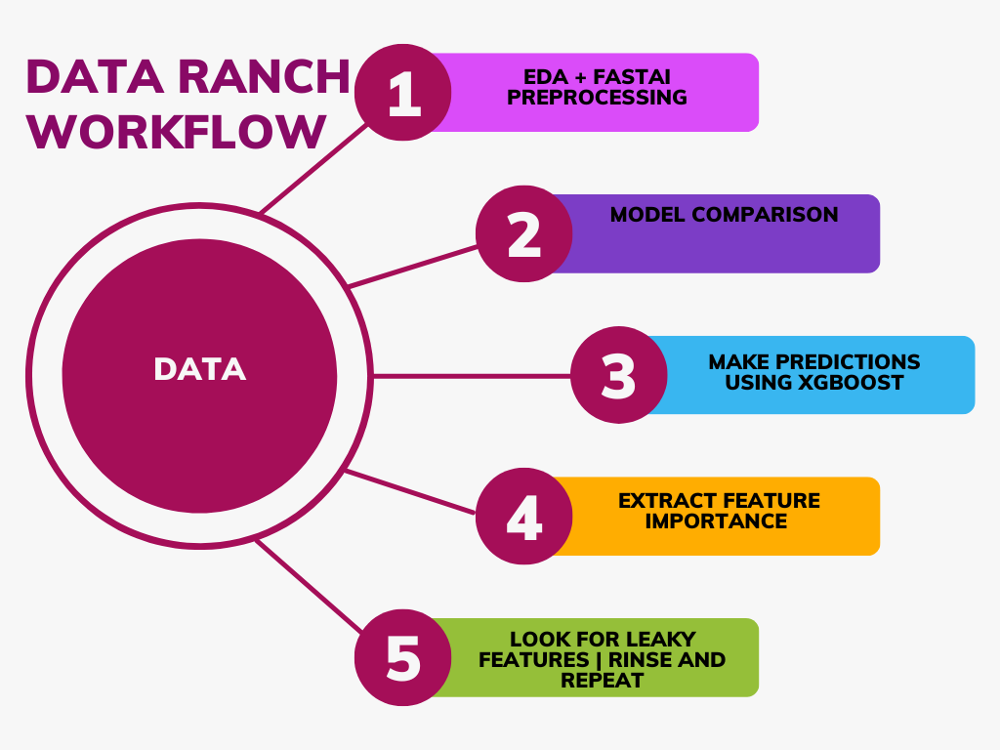

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
!pip install lazypredict

In [3]:
!pip install --upgrade pandas

In [4]:
!pip install fast-tabnet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 3.0 MB/s eta 0:00:00


In [5]:
!pip install fastai

  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.4.0
    Uninstalling typing_extensions-4.4.0:
      Successfully uninstalled typing_extensions-4.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-io 0.21.0 requires tensorflow-io-gcs-filesystem==0.21.0, which is not installed.
tensorflow 2.6.4 requires h5py~=3.1.0, but you have h5py 3.7.0 which is incompatible.
tensorflow 2.6.4 requires numpy~=1.19.2, but you have numpy 1.21.6 which is incompatible.
tensorflow 2.6.4 requires tensorboard<2.7,>=2.6.0, but you have tensorboard 2.10.1 which is incompatible.
tensorflow 2.6.4 requires typing-extensions<3.11,>=3.7, but you have typing-extensions 4.1.1 which is incompatible.
tensorflow-transform 1.9.0 requires pyarrow<6,>=1, but you have pyarrow 8.0.0 which is incompatible.
tensorflow-transform 1.9.0 requires te

In [6]:
!pip install pandas-profiling

  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 2.1.1
    Uninstalling MarkupSafe-2.1.1:
      Successfully uninstalled MarkupSafe-2.1.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
beatrix-jupyterlab 3.1.7 requires google-cloud-bigquery-storage, which is not installed.
werkzeug 2.2.2 requires MarkupSafe>=2.1.1, but you have markupsafe 2.0.1 which is incompatible.


In [7]:
#A program that takes a csv and trains models on it. Streamlined model selection.
#==============================================================================

#LazyPredict
import lazypredict
from lazypredict.Supervised import LazyRegressor
from lazypredict.Supervised import LazyClassifier
#Baysian Optimization
from bayes_opt import BayesianOptimization
#Pandas stack
import pandas as pd
import pandas_profiling
import numpy as np
#FastAI
from fastai.tabular.all import *
from fastai.tabular.core import *
#Plots
import matplotlib.pyplot as plt
import seaborn as sns
#System
import os
import sys
import traceback
#Fit an xgboost model
from xgboost import XGBRegressor
from xgboost import XGBClassifier
from xgboost import plot_importance
from sklearn.metrics import mean_squared_error
from sklearn.metrics import roc_auc_score
#Random
import random

#TabNet
from fast_tabnet.core import *

import shutil

In [8]:
%matplotlib inline

In [9]:
# For Styling
plt.style.use('seaborn-bright')

In [10]:
#Project Variables
#===================================================================================================
PROJECT_NAME = 'unsdg-united-nations-sustainable-development-group'
VARIABLE_FILES = False
#Maximum amount of rows to take
SAMPLE_COUNT = 2000
FASTAI_LEARNING_RATE = 1e-1
AUTO_ADJUST_LEARNING_RATE = False
#Set to True automatically infer if variables are categorical or continuous
ENABLE_BREAKPOINT = True
#When trying to declare a column a continuous variable, if it fails, convert it to a categorical variable
CONVERT_TO_CAT = False
REGRESSOR = True
SEP_DOLLAR = False
SEP_COMMA = True
SHUFFLE_DATA = True

In [11]:
input_dir = f'../input/{PROJECT_NAME}'
param_dir = f'/kaggle/working/{PROJECT_NAME}'
TARGET = ''
PARAM_DIR = param_dir
print(f'param_dir: {param_dir}')
if not os.path.exists(param_dir):
    os.makedirs(param_dir)
#rename any file in param_dir/file that ends with csv to data.csv
for file in os.listdir(input_dir):
    if file.endswith('.csv'):
        print('CSV!')
        if 'classification_results' not in file and 'regression_results' not in file:
            #os.rename(f'{input_dir}/{file}', f'{param_dir}/data.csv')
            shutil.copy(f'{input_dir}/{file}', f'{param_dir}/data.csv')
        #os.rename(f'{param_dir}/{file}', f'{param_dir}/data.csv')
try:
    df = pd.read_csv(f'{param_dir}/data.csv', nrows=SAMPLE_COUNT)
except:
    print(f'Please place a file named data.csv in {param_dir}')
    #sys.exit()

param_dir: /kaggle/working/unsdg-united-nations-sustainable-development-group
CSV!


In [12]:
df

,dt_year,dt_date,country,region,level_of_development,greenhousegas_emissione_mtco2equivalent,total_government_revenue_proportion_of_gdp_perc,fdi_inflows_millionusd,annual_growth_rate_perc,proportion_of_population_with_primary_reliance_on_clean_fuels_a,mortality_rate_perc,renewable_energy_share_on_the_total_energy_consumption,co2emissions_from_fuel_combustion_in_millions_of_tonnes,fossilfuel_subsidies_consumption_and_production_billionusd,randd_expenditure_proportionofgdp_perc,national_action_plans_as_priority_national_policies,number_of_companies_publishing_sustainability_reports,education_for_sustainable_development,enhance_policy_coherence_for_sustainable_development,land_degraded_over_total_land_area
0,2002,2002-01-01,Afghanistan,Central and Southern Asia,Least Developed,NaN,NaN,0.68,0.42,8.00,NaN,37.83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2003,2003-01-01,Afghanistan,Central and Southern Asia,Least Developed,NaN,0.12,50.00,0.11,9.00,NaN,36.66,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2004,2004-01-01,Afghanistan,Central and Southern Asia,Least Developed,NaN,0.18,57.80,-0.01,11.00,NaN,44.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2005,2005-01-01,Afghanistan,Central and Southern Asia,Least Developed,19.33,0.18,186.90,0.04,12.00,0.41,33.88,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2006,2006-01-01,Afghanistan,Central and Southern Asia,Least Developed,NaN,0.30,271.00,0.05,14.00,NaN,31.89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,2017,2017-01-01,Guinea-Bissau,Sub-Saharan Africa,Least Developed,NaN,0.17,24.00,0.03,5.00,NaN,86.80,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN
1996,2018,2018-01-01,Guinea-Bissau,Sub-Saharan Africa,Least Developed,NaN,NaN,15.69,0.01,5.00,NaN,86.59,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN
1997,2019,2019-01-01,Guinea-Bissau,Sub-Saharan Africa,Least Developed,NaN,0.16,20.56,0.02,5.00,0.25,86.24,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN
1998,2020,2020-01-01,Guinea-Bissau,Sub-Saharan Africa,Least Developed,NaN,NaN,71.66,-0.04,5.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN


In [13]:
if SEP_DOLLAR:
    #For every column in df, if the column contains a $, make a new column with the value without the $
    for col in df.columns:
        if '$' in df[col].to_string():
            df[col + '_no_dollar'] = df[col].str.replace('$', '').str.replace(',', '')
            #Try to convert this new column to a numeric type
            try:
                df[col + '_no_dollar'] = df[col + '_no_dollar'].apply(pd.to_numeric, errors='coerce').dropna()
            except Exception:
                print(f'{col} can not be converted to a float!')


if SEP_COMMA:
    #For every column in df, if the column contains a %, make a new column with the value without the %
    for col in df.columns:
        if '%' in df[col].to_string() or ',' in df[col].to_string():
            df[col + '_processed'] = df[col].str.replace('%', '').str.replace(',', '')
            #Try to convert this new column to a numeric type
            try:
                df[col + '_processed'] = df[col + '_processed'].apply(pd.to_numeric, errors='coerce').dropna()
            except Exception:
                print(f'{col} can not be converted to a float!')

In [14]:
df

,dt_year,dt_date,country,region,level_of_development,greenhousegas_emissione_mtco2equivalent,total_government_revenue_proportion_of_gdp_perc,fdi_inflows_millionusd,annual_growth_rate_perc,proportion_of_population_with_primary_reliance_on_clean_fuels_a,...,renewable_energy_share_on_the_total_energy_consumption,co2emissions_from_fuel_combustion_in_millions_of_tonnes,fossilfuel_subsidies_consumption_and_production_billionusd,randd_expenditure_proportionofgdp_perc,national_action_plans_as_priority_national_policies,number_of_companies_publishing_sustainability_reports,education_for_sustainable_development,enhance_policy_coherence_for_sustainable_development,land_degraded_over_total_land_area,country_processed
0,2002,2002-01-01,Afghanistan,Central and Southern Asia,Least Developed,NaN,NaN,0.68,0.42,8.00,...,37.83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2003,2003-01-01,Afghanistan,Central and Southern Asia,Least Developed,NaN,0.12,50.00,0.11,9.00,...,36.66,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2004,2004-01-01,Afghanistan,Central and Southern Asia,Least Developed,NaN,0.18,57.80,-0.01,11.00,...,44.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2005,2005-01-01,Afghanistan,Central and Southern Asia,Least Developed,19.33,0.18,186.90,0.04,12.00,...,33.88,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2006,2006-01-01,Afghanistan,Central and Southern Asia,Least Developed,NaN,0.30,271.00,0.05,14.00,...,31.89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,2017,2017-01-01,Guinea-Bissau,Sub-Saharan Africa,Least Developed,NaN,0.17,24.00,0.03,5.00,...,86.80,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1996,2018,2018-01-01,Guinea-Bissau,Sub-Saharan Africa,Least Developed,NaN,NaN,15.69,0.01,5.00,...,86.59,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1997,2019,2019-01-01,Guinea-Bissau,Sub-Saharan Africa,Least Developed,NaN,0.16,20.56,0.02,5.00,...,86.24,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1998,2020,2020-01-01,Guinea-Bissau,Sub-Saharan Africa,Least Developed,NaN,NaN,71.66,-0.04,5.00,...,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN


In [15]:
df.isna().sum()

dt_year                                                               0
dt_date                                                               0
country                                                               0
region                                                                0
level_of_development                                                  0
greenhousegas_emissione_mtco2equivalent                            1561
total_government_revenue_proportion_of_gdp_perc                     962
fdi_inflows_millionusd                                              452
annual_growth_rate_perc                                             423
proportion_of_population_with_primary_reliance_on_clean_fuels_a     632
mortality_rate_perc                                                1720
renewable_energy_share_on_the_total_energy_consumption              353
co2emissions_from_fuel_combustion_in_millions_of_tonnes            1028
fossilfuel_subsidies_consumption_and_production_billionusd      

In [16]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

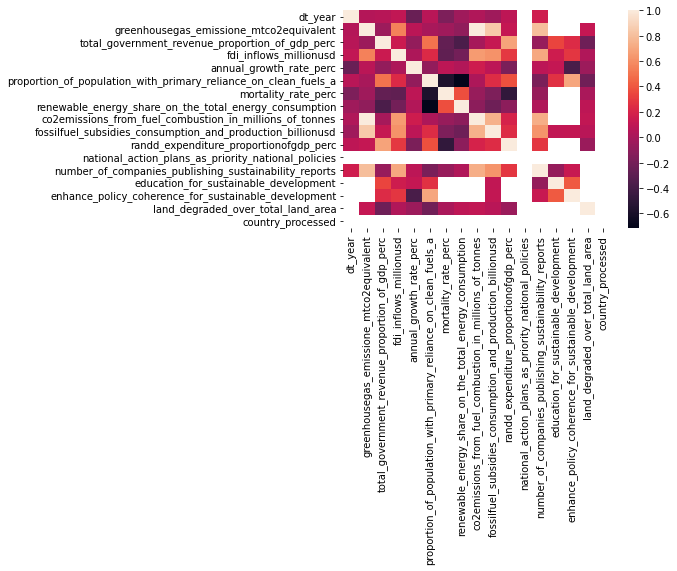

In [17]:
sns.heatmap(df.corr())

In [18]:
df.head().style.background_gradient(cmap = "inferno")

,dt_year,dt_date,country,region,level_of_development,greenhousegas_emissione_mtco2equivalent,total_government_revenue_proportion_of_gdp_perc,fdi_inflows_millionusd,annual_growth_rate_perc,proportion_of_population_with_primary_reliance_on_clean_fuels_a,mortality_rate_perc,renewable_energy_share_on_the_total_energy_consumption,co2emissions_from_fuel_combustion_in_millions_of_tonnes,fossilfuel_subsidies_consumption_and_production_billionusd,randd_expenditure_proportionofgdp_perc,national_action_plans_as_priority_national_policies,number_of_companies_publishing_sustainability_reports,education_for_sustainable_development,enhance_policy_coherence_for_sustainable_development,land_degraded_over_total_land_area,country_processed
0,2002,2002-01-01,Afghanistan,Central and Southern Asia,Least Developed,nan,nan,0.68,0.42,8.00,nan,37.83,nan,nan,nan,nan,nan,nan,nan,nan,nan
1,2003,2003-01-01,Afghanistan,Central and Southern Asia,Least Developed,nan,0.12,50.00,0.11,9.00,nan,36.66,nan,nan,nan,nan,nan,nan,nan,nan,nan
2,2004,2004-01-01,Afghanistan,Central and Southern Asia,Least Developed,nan,0.18,57.80,-0.01,11.00,nan,44.24,nan,nan,nan,nan,nan,nan,nan,nan,nan
3,2005,2005-01-01,Afghanistan,Central and Southern Asia,Least Developed,19.33,0.18,186.90,0.04,12.00,0.41,33.88,nan,nan,nan,nan,nan,nan,nan,nan,nan
4,2006,2006-01-01,Afghanistan,Central and Southern Asia,Least Developed,nan,0.30,271.00,0.05,14.00,nan,31.89,nan,nan,nan,nan,nan,nan,nan,nan,nan


In [19]:
df.describe().T.style.background_gradient(cmap = "viridis")

,count,mean,std,min,25%,50%,75%,max
dt_year,2000.00,2011.50,5.77,2002.00,2006.75,2011.50,2016.25,2021.00
greenhousegas_emissione_mtco2equivalent,439.00,282.56,1049.81,0.17,18.66,67.14,138.52,12300.20
total_government_revenue_proportion_of_gdp_perc,1038.00,0.30,0.13,0.09,0.19,0.27,0.40,0.96
fdi_inflows_millionusd,1548.00,7037.21,19360.31,-28294.65,65.56,492.11,2633.61,174352.89
annual_growth_rate_perc,1577.00,0.02,0.06,-0.57,-0.00,0.02,0.04,0.42
proportion_of_population_with_primary_reliance_on_clean_fuels_a,1368.00,61.26,37.11,5.00,19.00,82.00,95.00,95.00
mortality_rate_perc,280.00,0.21,0.07,0.08,0.15,0.20,0.25,0.47
renewable_energy_share_on_the_total_energy_consumption,1647.00,28.33,29.14,0.00,4.91,17.28,44.20,98.27
co2emissions_from_fuel_combustion_in_millions_of_tonnes,972.00,212.39,1046.45,0.36,5.98,20.23,68.60,9876.50
fossilfuel_subsidies_consumption_and_production_billionusd,432.00,1.83,4.94,0.00,0.00,0.06,1.14,46.66


In [20]:
df.columns

Index(['dt_year', 'dt_date', 'country', 'region', 'level_of_development',
       'greenhousegas_emissione_mtco2equivalent',
       'total_government_revenue_proportion_of_gdp_perc',
       'fdi_inflows_millionusd', 'annual_growth_rate_perc',
       'proportion_of_population_with_primary_reliance_on_clean_fuels_a',
       'mortality_rate_perc',
       'renewable_energy_share_on_the_total_energy_consumption',
       'co2emissions_from_fuel_combustion_in_millions_of_tonnes',
       'fossilfuel_subsidies_consumption_and_production_billionusd',
       'randd_expenditure_proportionofgdp_perc',
       'national_action_plans_as_priority_national_policies',
       'number_of_companies_publishing_sustainability_reports',
       'education_for_sustainable_development',
       'enhance_policy_coherence_for_sustainable_development',
       'land_degraded_over_total_land_area', 'country_processed'],
      dtype='object')

In [21]:
#remove columns we don't want to train or predict on
del(df['dt_year'])
del(df['dt_date'])

Target Variable: country_processed
CATS=====================
['region', 'level_of_development', 'proportion_of_population_with_primary_reliance_on_clean_fuels_a', 'national_action_plans_as_priority_national_policies', 'number_of_companies_publishing_sustainability_reports', 'education_for_sustainable_development', 'enhance_policy_coherence_for_sustainable_development', 'land_degraded_over_total_land_area', 'country_processed']
CONTS=====================
['country', 'greenhousegas_emissione_mtco2equivalent', 'total_government_revenue_proportion_of_gdp_perc', 'fdi_inflows_millionusd', 'annual_growth_rate_perc', 'mortality_rate_perc', 'renewable_energy_share_on_the_total_energy_consumption', 'co2emissions_from_fuel_combustion_in_millions_of_tonnes', 'fossilfuel_subsidies_consumption_and_production_billionusd', 'randd_expenditure_proportionofgdp_perc']
19
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['country', 'greenhousegas_emissione_mt

 10%|▉         | 4/42 [00:00<00:01, 29.73it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.018038511276245117}
{'Model': 'BaggingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03130388259887695}
{'Model': 'BayesianRidge', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03922009468078613}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.04563474655151367}
{'Model': 'DummyRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03757834434509277}
{'Model': 'ElasticNet', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.049393415451049805}


 21%|██▏       | 9/42 [00:00<00:03,  9.64it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.48163676261901855}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.019768476486206055}
{'Model': 'ExtraTreesRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.13390302658081055}
{'Model': 'GammaRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.015468835830688477}


 31%|███       | 13/42 [00:01<00:03,  8.37it/s]

{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.056213017751479244, 'RMSE': 0.2873297261118304, 'Time taken': 0.3988525867462158}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.09108901023864746}
{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.06560492515563965}


 40%|████      | 17/42 [00:01<00:02, 11.25it/s]

{'Model': 'HuberRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.056213017751479244, 'RMSE': 2.834566887657355e-12, 'Time taken': 0.061623334884643555}
{'Model': 'KNeighborsRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03577136993408203}
{'Model': 'KernelRidge', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.056213017751479244, 'RMSE': 0.9999999999999293, 'Time taken': 0.1115255355834961}
{'Model': 'Lars', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.01898646354675293}
LarsCV model failed to execute
x and y arrays must have at least 2 entries
{'Model': 'Lasso', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.07150387763977051}


 57%|█████▋    | 24/42 [00:02<00:01, 11.72it/s]

{'Model': 'LassoCV', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.4844479560852051}
{'Model': 'LassoLars', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.020072460174560547}
LassoLarsCV model failed to execute
x and y arrays must have at least 2 entries
{'Model': 'LassoLarsIC', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.022644996643066406}
{'Model': 'LinearRegression', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.04158353805541992}
{'Model': 'LinearSVR', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.056213017751479244, 'RMSE': 1.3903296130471353e-09, 'Time taken': 0.028725624084472656}


 69%|██████▉   | 29/42 [00:02<00:01, 10.62it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.056213017751479244, 'RMSE': 0.12184338115189759, 'Time taken': 0.46367669105529785}
{'Model': 'NuSVR', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.056213017751479244, 'RMSE': 3.552713678800501e-15, 'Time taken': 0.06943202018737793}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.018714189529418945}
OrthogonalMatchingPursuitCV model failed to execute
attempt to get argmin of an empty sequence
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.056213017751479244, 'RMSE': 0.03747765163050975, 'Time taken': 0.02213573455810547}
{'Model': 'PoissonRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.01837325096130371}


 76%|███████▌  | 32/42 [00:20<00:19,  1.97s/it]

{'Model': 'QuantileRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.056213017751479244, 'RMSE': 4.263256414560601e-14, 'Time taken': 17.599757194519043}
{'Model': 'RANSACRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.024130821228027344}


 93%|█████████▎| 39/42 [00:20<00:02,  1.19it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.2205491065979004}
{'Model': 'Ridge', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.017714500427246094}
{'Model': 'RidgeCV', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.02616739273071289}
{'Model': 'SGDRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.056213017751479244, 'RMSE': 0.0005253262899202929, 'Time taken': 0.021373271942138672}
{'Model': 'SVR', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.017161846160888672}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.018579959869384766}
{'Model': 'TweedieRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.01763916015625}


100%|██████████| 42/42 [00:21<00:00,  1.95it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.056213017751479244, 'RMSE': 5.9604645e-08, 'Time taken': 0.4884834289550781}
{'Model': 'LGBMRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.10912203788757324}
Project: unsdg-united-nations-sustainable-development-group
unsdg-united-nations-sustainable-development-group
Target: country_processed
country_processed
Target Standard Deviation: 0.0
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
AdaBoostRegressor                            1.00       1.00  0.00        0.02
Lars                                         1.00       1.00  0.00        0.02
TweedieRegressor                             1.00       1.00  0.00        0.02
TransformedTargetRegressor                   1.00       1.00  0.00        0.02
SVR                                          1.00       1.00  0.00        

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Could not fit model


Traceback (most recent call last):
  File "/tmp/ipykernel_18/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.00
1       1       1.00
2       1       1.00
3       1       1.00
4       1       1.00
XGBoost RMSE:  5.9604645e-08
XGBoost failed
Target Variable: land_degraded_over_total_land_area
CATS=====================
['region', 'level_of_development', 'national_action_plans_as_priority_national_policies', 'number_of_companies_publishing_sustainability_reports', 'education_for_sustainable_development', 'enhance_policy_coherence_for_sustainable_development', 'land_degraded_over_total_land_area', 'country_processed']
CONTS=====================
['country', 'greenhousegas_emissione_mtco2equivalent', 'total_government_revenue_proportion_of_gdp_perc', 'fdi_inflows_millionusd', 'annual_growth_rate_perc', 'proportion_of_population_with_primary_reliance_on_clean_fuels_a', 'mortality_rate_perc', 'renewable_energy_share_on_the_total_energy_consumption', 'co2emissions_from_fuel_combustion_in_millions_of_tonnes', 'fossilfuel_subs

Traceback (most recent call last):
  File "/tmp/ipykernel_18/2755408106.py", line 310, in <module>
    plot_importance(xgb)
  File "/opt/conda/lib/python3.7/site-packages/xgboost/plotting.py", line 75, in plot_importance
    'Booster.get_score() results in empty.  ' +
ValueError: Booster.get_score() results in empty.  This maybe caused by having all trees as decision dumps.


Continuous variables that made the cut : ['country', 'greenhousegas_emissione_mtco2equivalent', 'total_government_revenue_proportion_of_gdp_perc', 'fdi_inflows_millionusd', 'annual_growth_rate_perc', 'proportion_of_population_with_primary_reliance_on_clean_fuels_a', 'mortality_rate_perc', 'renewable_energy_share_on_the_total_energy_consumption', 'co2emissions_from_fuel_combustion_in_millions_of_tonnes', 'fossilfuel_subsidies_consumption_and_production_billionusd', 'randd_expenditure_proportionofgdp_perc']
Categorical variables that made the cut : ['region', 'level_of_development', 'national_action_plans_as_priority_national_policies', 'number_of_companies_publishing_sustainability_reports', 'education_for_sustainable_development', 'enhance_policy_coherence_for_sustainable_development', 'land_degraded_over_total_land_area', 'country_processed', 'country_na']
Tabular Object size: 1694


  0%|          | 0/42 [00:00<?, ?it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': -1.34424645904212, 'Adjusted R-Squared': -1.4843114990477813, 'RMSE': 1.713587432573588, 'Time taken': 0.043047428131103516}
{'Model': 'BaggingRegressor', 'R-Squared': -0.7544226804844141, 'Adjusted R-Squared': -0.8592466771171308, 'RMSE': 1.4824216554331096, 'Time taken': 0.04258894920349121}


 14%|█▍        | 6/42 [00:00<00:01, 26.20it/s]

{'Model': 'BayesianRidge', 'R-Squared': -0.1235784907983768, 'Adjusted R-Squared': -0.19071053899073265, 'RMSE': 1.1863322655781978, 'Time taken': 0.023702144622802734}
{'Model': 'DecisionTreeRegressor', 'R-Squared': -3.3483833096903615, 'Adjusted R-Squared': -3.6081923753636858, 'RMSE': 2.333826377888933, 'Time taken': 0.038578033447265625}
{'Model': 'DummyRegressor', 'R-Squared': -0.02074508597371283, 'Adjusted R-Squared': -0.0817329999155385, 'RMSE': 1.130741372973289, 'Time taken': 0.03745770454406738}
{'Model': 'ElasticNet', 'R-Squared': -0.00458206711176623, 'Adjusted R-Squared': -0.06460426609014225, 'RMSE': 1.1217532712107168, 'Time taken': 0.04048800468444824}
{'Model': 'ElasticNetCV', 'R-Squared': -0.02880983078166066, 'Adjusted R-Squared': -0.09027960054534478, 'RMSE': 1.1351994885830843, 'Time taken': 0.1425631046295166}
{'Model': 'ExtraTreeRegressor', 'R-Squared': -3.764089698884008, 'Adjusted R-Squared': -4.048736567685254, 'RMSE': 2.442837616646218, 'Time taken': 0.03798

 21%|██▏       | 9/42 [00:00<00:02, 12.41it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': -0.970413091452891, 'Adjusted R-Squared': -1.08814217553341, 'RMSE': 1.5710256514879495, 'Time taken': 0.20579910278320312}
{'Model': 'GammaRegressor', 'R-Squared': 0.03653992626634639, 'Adjusted R-Squared': -0.02102529826490973, 'RMSE': 1.0985542157297397, 'Time taken': 0.020253419876098633}


 26%|██▌       | 11/42 [00:00<00:03,  9.68it/s]

{'Model': 'GaussianProcessRegressor', 'R-Squared': -8.307255454381455, 'Adjusted R-Squared': -8.863349333731291, 'RMSE': 3.4144082813029657, 'Time taken': 0.2879679203033447}
{'Model': 'GradientBoostingRegressor', 'R-Squared': -0.47650795327410833, 'Adjusted R-Squared': -0.5647269819288507, 'RMSE': 1.3599487098850702, 'Time taken': 0.32495975494384766}


 33%|███▎      | 14/42 [00:02<00:08,  3.33it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': -0.8634931693589629, 'Adjusted R-Squared': -0.9748339562074546, 'RMSE': 1.5278071446697217, 'Time taken': 1.4371693134307861}
{'Model': 'HuberRegressor', 'R-Squared': -0.008560643217823793, 'Adjusted R-Squared': -0.06882055586291402, 'RMSE': 1.1239723883971309, 'Time taken': 0.11940312385559082}
{'Model': 'KNeighborsRegressor', 'R-Squared': -0.5926278642357505, 'Adjusted R-Squared': -0.6877848749919748, 'RMSE': 1.412413269055325, 'Time taken': 0.03057074546813965}


 43%|████▎     | 18/42 [00:03<00:04,  5.99it/s]

{'Model': 'KernelRidge', 'R-Squared': -0.9998305951025728, 'Adjusted R-Squared': -1.1193173287722233, 'RMSE': 1.5827096058183519, 'Time taken': 0.0954279899597168}
{'Model': 'Lars', 'R-Squared': -0.21087165680818876, 'Adjusted R-Squared': -0.28321933441622527, 'RMSE': 1.2315546572186133, 'Time taken': 0.021844148635864258}
{'Model': 'LarsCV', 'R-Squared': -0.028518237577096484, 'Adjusted R-Squared': -0.08997058510528788, 'RMSE': 1.1350386036921531, 'Time taken': 0.0823974609375}
{'Model': 'Lasso', 'R-Squared': -0.02074508597371283, 'Adjusted R-Squared': -0.0817329999155385, 'RMSE': 1.130741372973289, 'Time taken': 0.03343677520751953}


 52%|█████▏    | 22/42 [00:03<00:02,  8.06it/s]

{'Model': 'LassoCV', 'R-Squared': -0.03770374485410333, 'Adjusted R-Squared': -0.0997049119994744, 'RMSE': 1.1400957482239065, 'Time taken': 0.18984317779541016}
{'Model': 'LassoLars', 'R-Squared': -0.02074508597371283, 'Adjusted R-Squared': -0.0817329999155385, 'RMSE': 1.130741372973289, 'Time taken': 0.043848276138305664}
{'Model': 'LassoLarsCV', 'R-Squared': -0.028518237577096484, 'Adjusted R-Squared': -0.08997058510528788, 'RMSE': 1.1350386036921531, 'Time taken': 0.08179545402526855}
{'Model': 'LassoLarsIC', 'R-Squared': -0.12434765570134099, 'Adjusted R-Squared': -0.19152566028727036, 'RMSE': 1.1867382581450296, 'Time taken': 0.045354366302490234}


 60%|█████▉    | 25/42 [00:03<00:01, 10.46it/s]

{'Model': 'LinearRegression', 'R-Squared': -0.21087165680818565, 'Adjusted R-Squared': -0.28321933441622194, 'RMSE': 1.2315546572186118, 'Time taken': 0.03886246681213379}
{'Model': 'LinearSVR', 'R-Squared': -0.00856038741845655, 'Adjusted R-Squared': -0.06882028477993685, 'RMSE': 1.1239722458616046, 'Time taken': 0.06252050399780273}
{'Model': 'MLPRegressor', 'R-Squared': -0.44377024144559973, 'Adjusted R-Squared': -0.5300332432929784, 'RMSE': 1.344787541620943, 'Time taken': 1.8850572109222412}


 74%|███████▍  | 31/42 [00:06<00:02,  4.20it/s]

{'Model': 'NuSVR', 'R-Squared': -0.010064702775145706, 'Adjusted R-Squared': -0.07041448061391242, 'RMSE': 1.1248101623218199, 'Time taken': 0.5407872200012207}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': -0.05453783835940684, 'Adjusted R-Squared': -0.11754481612301926, 'RMSE': 1.1493061159769222, 'Time taken': 0.016458511352539062}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': -0.05453783835940684, 'Adjusted R-Squared': -0.11754481612301926, 'RMSE': 1.1493061159769222, 'Time taken': 0.038848161697387695}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.4718959108455787, 'Adjusted R-Squared': -0.5598393772168555, 'RMSE': 1.3578230705548233, 'Time taken': 0.020928621292114258}
{'Model': 'PoissonRegressor', 'R-Squared': -0.02760758838445798, 'Adjusted R-Squared': -0.0890055260552276, 'RMSE': 1.134536011300668, 'Time taken': 0.030815839767456055}


 76%|███████▌  | 32/42 [00:27<00:31,  3.15s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.008560387421423954, 'Adjusted R-Squared': -0.06882028478308144, 'RMSE': 1.1239722458632582, 'Time taken': 21.66873526573181}
{'Model': 'RANSACRegressor', 'R-Squared': -0.008560387418676818, 'Adjusted R-Squared': -0.06882028478017022, 'RMSE': 1.1239722458617274, 'Time taken': 0.03959822654724121}


 90%|█████████ | 38/42 [00:28<00:05,  1.31s/it]

{'Model': 'RandomForestRegressor', 'R-Squared': -0.5009990901531094, 'Adjusted R-Squared': -0.5906814257282953, 'RMSE': 1.3711811951097073, 'Time taken': 0.34716320037841797}
{'Model': 'Ridge', 'R-Squared': -0.21008407730771572, 'Adjusted R-Squared': -0.28238469827893153, 'RMSE': 1.231154075965128, 'Time taken': 0.014949798583984375}
{'Model': 'RidgeCV', 'R-Squared': -0.20317606264776367, 'Adjusted R-Squared': -0.27506394060470574, 'RMSE': 1.22763489774027, 'Time taken': 0.02638864517211914}
{'Model': 'SGDRegressor', 'R-Squared': -0.22523511768954751, 'Adjusted R-Squared': -0.29844098950118725, 'RMSE': 1.2388375255721362, 'Time taken': 0.02801513671875}
{'Model': 'SVR', 'R-Squared': -0.0011129839131389652, 'Adjusted R-Squared': -0.060927910624930304, 'RMSE': 1.1198147432801018, 'Time taken': 0.07309865951538086}
{'Model': 'TransformedTargetRegressor', 'R-Squared': -0.21087165680818565, 'Adjusted R-Squared': -0.28321933441622194, 'RMSE': 1.2315546572186118, 'Time taken': 0.0210928916931

100%|██████████| 42/42 [00:29<00:00,  1.44it/s]

{'Model': 'XGBRegressor', 'R-Squared': -1.4771923306139487, 'Adjusted R-Squared': -1.6252006774116379, 'RMSE': 1.7615075, 'Time taken': 0.6319952011108398}
{'Model': 'LGBMRegressor', 'R-Squared': -0.7880950516295677, 'Adjusted R-Squared': -0.8949309194942277, 'RMSE': 1.496579991752378, 'Time taken': 0.15447616577148438}
Project: unsdg-united-nations-sustainable-development-group
unsdg-united-nations-sustainable-development-group
Target: land_degraded_over_total_land_area
land_degraded_over_total_land_area
Target Standard Deviation: 1.9499555654019984
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
GammaRegressor                              -0.02       0.04  1.10        0.02
TweedieRegressor                            -0.04       0.02  1.11        0.02
SVR                                         -0.06      -0.00  1.12        0.07
ElasticNet                                  -0.0

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_18/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.00
1       1       1.00
2       1       1.00
3       1       2.15
4       1       1.14
XGBoost RMSE:  1.771628


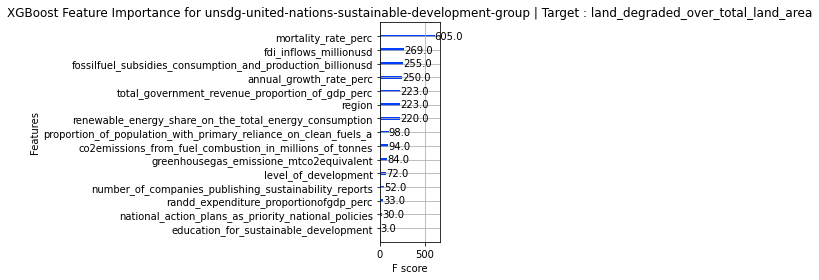

Target Variable: enhance_policy_coherence_for_sustainable_development
CATS=====================
['region', 'level_of_development', 'national_action_plans_as_priority_national_policies', 'number_of_companies_publishing_sustainability_reports', 'education_for_sustainable_development', 'enhance_policy_coherence_for_sustainable_development', 'land_degraded_over_total_land_area', 'country_processed']
CONTS=====================
['country', 'greenhousegas_emissione_mtco2equivalent', 'total_government_revenue_proportion_of_gdp_perc', 'fdi_inflows_millionusd', 'annual_growth_rate_perc', 'proportion_of_population_with_primary_reliance_on_clean_fuels_a', 'mortality_rate_perc', 'renewable_energy_share_on_the_total_energy_consumption', 'co2emissions_from_fuel_combustion_in_millions_of_tonnes', 'fossilfuel_subsidies_consumption_and_production_billionusd', 'randd_expenditure_proportionofgdp_perc']
19
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['co

 10%|▉         | 4/42 [00:00<00:02, 16.19it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': -7.270757722580079, 'Adjusted R-Squared': -7.764922492168198, 'RMSE': 0.22056702516551824, 'Time taken': 0.1447305679321289}
{'Model': 'BaggingRegressor', 'R-Squared': -3.3306250000000004, 'Adjusted R-Squared': -3.589373034591196, 'RMSE': 0.1596037993942033, 'Time taken': 0.04256868362426758}
{'Model': 'BayesianRidge', 'R-Squared': -2.7524913996763076, 'Adjusted R-Squared': -2.976696860663257, 'RMSE': 0.1485688593473576, 'Time taken': 0.03635835647583008}
{'Model': 'DecisionTreeRegressor', 'R-Squared': -0.005952380952380931, 'Adjusted R-Squared': -0.0660564540281523, 'RMSE': 0.07692307692307693, 'Time taken': 0.04689836502075195}
{'Model': 'DummyRegressor', 'R-Squared': -0.1791914196957669, 'Adjusted R-Squared': -0.2496462529480299, 'RMSE': 0.08328371541008647, 'Time taken': 0.03264260292053223}
{'Model': 'ElasticNet', 'R-Squared': -0.1791914196957669, 'Adjusted R-Squared': -0.2496462529480299, 'RMSE': 0.08328371541008647, 'Time taken': 0.026

 17%|█▋        | 7/42 [00:00<00:02, 13.64it/s]

{'Model': 'ElasticNetCV', 'R-Squared': -3.1482150489220055, 'Adjusted R-Squared': -3.3960643757443902, 'RMSE': 0.15620630793135115, 'Time taken': 0.17702817916870117}
{'Model': 'ExtraTreeRegressor', 'R-Squared': -0.005952380952380931, 'Adjusted R-Squared': -0.0660564540281523, 'RMSE': 0.07692307692307693, 'Time taken': 0.041259765625}


 21%|██▏       | 9/42 [00:00<00:02, 11.45it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': -1.7284949404761898, 'Adjusted R-Squared': -1.8915182230832581, 'RMSE': 0.12668625925499444, 'Time taken': 0.18662619590759277}
{'Model': 'GammaRegressor', 'R-Squared': -0.9460937126146838, 'Adjusted R-Squared': -1.062369752047637, 'RMSE': 0.10699163173610733, 'Time taken': 0.019266128540039062}


 26%|██▌       | 11/42 [00:01<00:03,  8.88it/s]

{'Model': 'GaussianProcessRegressor', 'R-Squared': -11.543443018766824, 'Adjusted R-Squared': -12.29289401674346, 'RMSE': 0.27162911389873656, 'Time taken': 0.3087141513824463}
{'Model': 'GradientBoostingRegressor', 'R-Squared': -3.3465823794676686, 'Adjusted R-Squared': -3.6062838423918375, 'RMSE': 0.15989758107165905, 'Time taken': 0.34330296516418457}


 33%|███▎      | 14/42 [00:01<00:05,  5.39it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': -2.8670569778591544, 'Adjusted R-Squared': -3.0981075520079724, 'RMSE': 0.1508197518162431, 'Time taken': 0.4254605770111084}
{'Model': 'HuberRegressor', 'R-Squared': -0.017176991936928676, 'Adjusted R-Squared': -0.07795171787026733, 'RMSE': 0.07735104766555526, 'Time taken': 0.12419867515563965}
{'Model': 'KNeighborsRegressor', 'R-Squared': -0.5692857142857144, 'Adjusted R-Squared': -0.6630480682839177, 'RMSE': 0.09607689228305229, 'Time taken': 0.03240370750427246}


 45%|████▌     | 19/42 [00:02<00:02,  9.16it/s]

{'Model': 'KernelRidge', 'R-Squared': -173.36297828537175, 'Adjusted R-Squared': -183.7808920822965, 'RMSE': 1.0127332653672245, 'Time taken': 0.20374774932861328}
{'Model': 'Lars', 'R-Squared': -3.1600449604613887, 'Adjusted R-Squared': -3.4086011058977617, 'RMSE': 0.15642888453230852, 'Time taken': 0.031592369079589844}
{'Model': 'LarsCV', 'R-Squared': -3.1600449604613887, 'Adjusted R-Squared': -3.4086011058977617, 'RMSE': 0.15642888453230852, 'Time taken': 0.05465888977050781}
{'Model': 'Lasso', 'R-Squared': -0.1791914196957669, 'Adjusted R-Squared': -0.2496462529480299, 'RMSE': 0.08328371541008647, 'Time taken': 0.019322872161865234}


 55%|█████▍    | 23/42 [00:02<00:01,  9.63it/s]

{'Model': 'LassoCV', 'R-Squared': -3.148803837984076, 'Adjusted R-Squared': -3.39668834402715, 'RMSE': 0.1562173933380965, 'Time taken': 0.19460606575012207}
{'Model': 'LassoLars', 'R-Squared': -0.1791914196957669, 'Adjusted R-Squared': -0.2496462529480299, 'RMSE': 0.08328371541008647, 'Time taken': 0.05924105644226074}
{'Model': 'LassoLarsCV', 'R-Squared': -3.1600449604613887, 'Adjusted R-Squared': -3.4086011058977617, 'RMSE': 0.15642888453230852, 'Time taken': 0.09881114959716797}
{'Model': 'LassoLarsIC', 'R-Squared': -2.7749023246533913, 'Adjusted R-Squared': -3.0004468031704183, 'RMSE': 0.14901184624898003, 'Time taken': 0.045209646224975586}


 60%|█████▉    | 25/42 [00:02<00:01, 11.10it/s]

{'Model': 'LinearRegression', 'R-Squared': -3.1600449604614003, 'Adjusted R-Squared': -3.408601105897773, 'RMSE': 0.15642888453230874, 'Time taken': 0.044019222259521484}
{'Model': 'LinearSVR', 'R-Squared': -0.005952381157443787, 'Adjusted R-Squared': -0.06605645424546736, 'RMSE': 0.07692307693091728, 'Time taken': 0.054795026779174805}
{'Model': 'MLPRegressor', 'R-Squared': -3.284443973673131, 'Adjusted R-Squared': -3.540432764552973, 'RMSE': 0.15875052502702056, 'Time taken': 2.01883602142334}


 64%|██████▍   | 27/42 [00:05<00:06,  2.46it/s]

{'Model': 'NuSVR', 'R-Squared': -0.2488207011448742, 'Adjusted R-Squared': -0.3234357744837191, 'RMSE': 0.08570733294390738, 'Time taken': 0.29228973388671875}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': -2.8498736444191657, 'Adjusted R-Squared': -3.0798975414127643, 'RMSE': 0.15048429368193247, 'Time taken': 0.015226125717163086}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': -3.2186741118950186, 'Adjusted R-Squared': -3.4707332569453504, 'RMSE': 0.1575273347780681, 'Time taken': 0.03211402893066406}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -7.287452862576092, 'Adjusted R-Squared': -7.782615140528753, 'RMSE': 0.2207895284150394, 'Time taken': 0.02211451530456543}
{'Model': 'PoissonRegressor', 'R-Squared': -1.361944810119199, 'Adjusted R-Squared': -1.5030672987741198, 'RMSE': 0.11786987121562546, 'Time taken': 0.021362781524658203}


 76%|███████▌  | 32/42 [00:25<00:23,  2.34s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.005952380948641922, 'Adjusted R-Squared': -0.06605645402418991, 'RMSE': 0.07692307692293396, 'Time taken': 20.710787773132324}
{'Model': 'RANSACRegressor', 'R-Squared': -0.005952380952380931, 'Adjusted R-Squared': -0.0660564540281523, 'RMSE': 0.07692307692307693, 'Time taken': 0.044094085693359375}


 90%|█████████ | 38/42 [00:26<00:04,  1.13s/it]

{'Model': 'RandomForestRegressor', 'R-Squared': -3.6583139880952373, 'Adjusted R-Squared': -3.936640924490865, 'RMSE': 0.16553213456596425, 'Time taken': 0.326824426651001}
{'Model': 'Ridge', 'R-Squared': -3.1565121842169797, 'Adjusted R-Squared': -3.404857251827429, 'RMSE': 0.1563624494784229, 'Time taken': 0.015402555465698242}
{'Model': 'RidgeCV', 'R-Squared': -3.12510052573602, 'Adjusted R-Squared': -3.3715687961416316, 'RMSE': 0.15577049661186537, 'Time taken': 0.025071144104003906}
{'Model': 'SGDRegressor', 'R-Squared': -1.9903442353214724, 'Adjusted R-Squared': -2.1690126015828186, 'RMSE': 0.1326259564484587, 'Time taken': 0.020235776901245117}
{'Model': 'SVR', 'R-Squared': -0.8599614198653402, 'Adjusted R-Squared': -0.9710911902346533, 'RMSE': 0.10459716275102533, 'Time taken': 0.04014134407043457}
{'Model': 'TransformedTargetRegressor', 'R-Squared': -3.1600449604614003, 'Adjusted R-Squared': -3.408601105897773, 'RMSE': 0.15642888453230874, 'Time taken': 0.03311324119567871}
{'

100%|██████████| 42/42 [00:27<00:00,  1.54it/s]

{'Model': 'XGBRegressor', 'R-Squared': -8.785345109585515, 'Adjusted R-Squared': -9.3700040941205, 'RMSE': 0.23991424, 'Time taken': 0.5297791957855225}
{'Model': 'LGBMRegressor', 'R-Squared': -2.9660445275996645, 'Adjusted R-Squared': -3.203009452204676, 'RMSE': 0.15273786974761078, 'Time taken': 0.1459965705871582}
Project: unsdg-united-nations-sustainable-development-group
unsdg-united-nations-sustainable-development-group
Target: enhance_policy_coherence_for_sustainable_development
enhance_policy_coherence_for_sustainable_development
Target Standard Deviation: 0.38695948865620267
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
QuantileRegressor                           -0.07      -0.01  0.08       20.71
DecisionTreeRegressor                       -0.07      -0.01  0.08        0.05
ExtraTreeRegressor                          -0.07      -0.01  0.08        0.04
RANSACRegresso

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_18/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.00
1       1       1.00
2       1       0.99
3       1       1.00
4       1       1.00
XGBoost RMSE:  0.23991424


<Figure size 432x288 with 0 Axes>

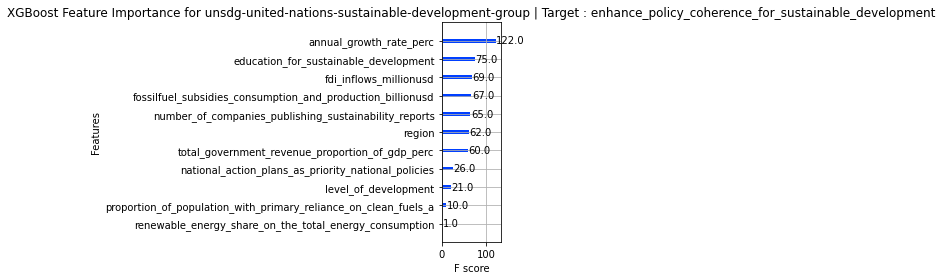

Target Variable: education_for_sustainable_development
CATS=====================
['region', 'level_of_development', 'national_action_plans_as_priority_national_policies', 'number_of_companies_publishing_sustainability_reports', 'education_for_sustainable_development', 'enhance_policy_coherence_for_sustainable_development', 'land_degraded_over_total_land_area', 'country_processed']
CONTS=====================
['country', 'greenhousegas_emissione_mtco2equivalent', 'total_government_revenue_proportion_of_gdp_perc', 'fdi_inflows_millionusd', 'annual_growth_rate_perc', 'proportion_of_population_with_primary_reliance_on_clean_fuels_a', 'mortality_rate_perc', 'renewable_energy_share_on_the_total_energy_consumption', 'co2emissions_from_fuel_combustion_in_millions_of_tonnes', 'fossilfuel_subsidies_consumption_and_production_billionusd', 'randd_expenditure_proportionofgdp_perc']
19
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['country', 'greenh

  0%|          | 0/42 [00:00<?, ?it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.24048268172585208, 'Adjusted R-Squared': 0.19510271616859154, 'RMSE': 0.672129971824339, 'Time taken': 0.06297111511230469}


 12%|█▏        | 5/42 [00:00<00:01, 23.00it/s]

{'Model': 'BaggingRegressor', 'R-Squared': -0.0389401342123854, 'Adjusted R-Squared': -0.10101517367790547, 'RMSE': 0.7861034155132878, 'Time taken': 0.04573845863342285}
{'Model': 'BayesianRidge', 'R-Squared': 0.007799489948670746, 'Adjusted R-Squared': -0.05148293046320118, 'RMSE': 0.7682174086360899, 'Time taken': 0.03636479377746582}
{'Model': 'DecisionTreeRegressor', 'R-Squared': -2.014304214739818, 'Adjusted R-Squared': -2.1944041520984867, 'RMSE': 1.3389919373484007, 'Time taken': 0.04303431510925293}
{'Model': 'DummyRegressor', 'R-Squared': -0.007046476662861956, 'Adjusted R-Squared': -0.06721592023705814, 'RMSE': 0.7739433602226768, 'Time taken': 0.0342717170715332}
{'Model': 'ElasticNet', 'R-Squared': -0.007046476662861956, 'Adjusted R-Squared': -0.06721592023705814, 'RMSE': 0.7739433602226768, 'Time taken': 0.025098800659179688}


 19%|█▉        | 8/42 [00:00<00:01, 17.52it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.01636245908751599, 'Adjusted R-Squared': -0.04240833738209804, 'RMSE': 0.7648952593082987, 'Time taken': 0.16083455085754395}
{'Model': 'ExtraTreeRegressor', 'R-Squared': -0.3032140334353668, 'Adjusted R-Squared': -0.38107902285446116, 'RMSE': 0.8804248570968921, 'Time taken': 0.01861405372619629}


 24%|██▍       | 10/42 [00:00<00:02, 12.88it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.2393199376030135, 'Adjusted R-Squared': 0.1938704999126275, 'RMSE': 0.6726442565412926, 'Time taken': 0.22139811515808105}
{'Model': 'GammaRegressor', 'R-Squared': 0.015832178580246548, 'Adjusted R-Squared': -0.042970301315902404, 'RMSE': 0.7651014096318992, 'Time taken': 0.01915907859802246}
{'Model': 'GaussianProcessRegressor', 'R-Squared': -228.74731927738853, 'Adjusted R-Squared': -242.47436036628912, 'RMSE': 11.68986909487659, 'Time taken': 0.28099894523620605}


 29%|██▊       | 12/42 [00:01<00:04,  6.55it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': -0.0841798969333587, 'Adjusted R-Squared': -0.14895794108975435, 'RMSE': 0.8030361508645725, 'Time taken': 0.3508594036102295}


 33%|███▎      | 14/42 [00:01<00:05,  5.37it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.05030202708582465, 'Adjusted R-Squared': -0.006440933559990869, 'RMSE': 0.7515833959446528, 'Time taken': 0.40610218048095703}
{'Model': 'HuberRegressor', 'R-Squared': -0.008417874389501145, 'Adjusted R-Squared': -0.06866925682157832, 'RMSE': 0.7744701596735741, 'Time taken': 0.11398601531982422}
{'Model': 'KNeighborsRegressor', 'R-Squared': -0.02844478455380317, 'Adjusted R-Squared': -0.08989274337934505, 'RMSE': 0.7821227373829256, 'Time taken': 0.02734661102294922}


 45%|████▌     | 19/42 [00:02<00:02,  9.35it/s]

{'Model': 'KernelRidge', 'R-Squared': -2.0260526665105045, 'Adjusted R-Squared': -2.206854555390063, 'RMSE': 1.3415988049106868, 'Time taken': 0.1077430248260498}
{'Model': 'Lars', 'R-Squared': 0.0054757767725761575, 'Adjusted R-Squared': -0.053945481847930354, 'RMSE': 0.7691164572365556, 'Time taken': 0.0212557315826416}
{'Model': 'LarsCV', 'R-Squared': 0.01577892640458156, 'Adjusted R-Squared': -0.04302673522533351, 'RMSE': 0.7651221087254136, 'Time taken': 0.07270288467407227}
{'Model': 'Lasso', 'R-Squared': -0.007046476662861956, 'Adjusted R-Squared': -0.06721592023705814, 'RMSE': 0.7739433602226768, 'Time taken': 0.02492833137512207}


 55%|█████▍    | 23/42 [00:02<00:01, 10.48it/s]

{'Model': 'LassoCV', 'R-Squared': 0.015647659238821277, 'Adjusted R-Squared': -0.04316584539785295, 'RMSE': 0.7651731298144667, 'Time taken': 0.1324443817138672}
{'Model': 'LassoLars', 'R-Squared': -0.007046476662861956, 'Adjusted R-Squared': -0.06721592023705814, 'RMSE': 0.7739433602226768, 'Time taken': 0.03409576416015625}
{'Model': 'LassoLarsCV', 'R-Squared': 0.01577892640458156, 'Adjusted R-Squared': -0.04302673522533351, 'RMSE': 0.7651221087254136, 'Time taken': 0.08468985557556152}
{'Model': 'LassoLarsIC', 'R-Squared': 0.015316274022036835, 'Adjusted R-Squared': -0.043517030360294306, 'RMSE': 0.7653019179097261, 'Time taken': 0.060071706771850586}


 60%|█████▉    | 25/42 [00:02<00:01, 11.35it/s]

{'Model': 'LinearRegression', 'R-Squared': 0.0054757767725761575, 'Adjusted R-Squared': -0.053945481847930354, 'RMSE': 0.7691164572365556, 'Time taken': 0.04053449630737305}
{'Model': 'LinearSVR', 'R-Squared': -0.009742182597273885, 'Adjusted R-Squared': -0.07007269036251995, 'RMSE': 0.7749785306107183, 'Time taken': 0.09725832939147949}
{'Model': 'MLPRegressor', 'R-Squared': 0.10546751766389506, 'Adjusted R-Squared': 0.052020608341926455, 'RMSE': 0.7294280822615935, 'Time taken': 1.8739895820617676}


 74%|███████▍  | 31/42 [00:05<00:02,  4.34it/s]

{'Model': 'NuSVR', 'R-Squared': -0.004595423739639726, 'Adjusted R-Squared': -0.06461842075553026, 'RMSE': 0.773000935096317, 'Time taken': 0.4530062675476074}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': -0.004817126666815108, 'Adjusted R-Squared': -0.06485337008401482, 'RMSE': 0.7730862267031633, 'Time taken': 0.01888728141784668}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.00919203522498957, 'Adjusted R-Squared': -0.05000718279615901, 'RMSE': 0.7676781259344729, 'Time taken': 0.03201889991760254}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.7462111977213939, 'Adjusted R-Squared': -0.8505445711701565, 'RMSE': 1.0191375559937281, 'Time taken': 0.023270845413208008}
{'Model': 'PoissonRegressor', 'R-Squared': 0.01589519520946736, 'Adjusted R-Squared': -0.04290351954216831, 'RMSE': 0.7650769143768146, 'Time taken': 0.02657032012939453}


 76%|███████▌  | 32/42 [00:26<00:32,  3.26s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.004768071578578947, 'Adjusted R-Squared': -0.06480138403138724, 'RMSE': 0.7730673554703144, 'Time taken': 21.973708629608154}
{'Model': 'RANSACRegressor', 'R-Squared': -0.004768071579939193, 'Adjusted R-Squared': -0.06480138403282876, 'RMSE': 0.7730673554708377, 'Time taken': 0.059487104415893555}


 90%|█████████ | 38/42 [00:27<00:05,  1.34s/it]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.29412406698846205, 'Adjusted R-Squared': 0.2519490898588418, 'RMSE': 0.647960614991283, 'Time taken': 0.3711578845977783}
{'Model': 'Ridge', 'R-Squared': 0.005513166748137732, 'Adjusted R-Squared': -0.05390585788011837, 'RMSE': 0.7691019993102619, 'Time taken': 0.018233299255371094}
{'Model': 'RidgeCV', 'R-Squared': 0.005841147876706643, 'Adjusted R-Squared': -0.05355828039481092, 'RMSE': 0.7689751641754146, 'Time taken': 0.035338401794433594}
{'Model': 'SGDRegressor', 'R-Squared': 0.006145972518726506, 'Adjusted R-Squared': -0.05323524295971449, 'RMSE': 0.768857265235386, 'Time taken': 0.04312252998352051}
{'Model': 'SVR', 'R-Squared': 0.011926488707280525, 'Adjusted R-Squared': -0.04710935001775618, 'RMSE': 0.7666180665979229, 'Time taken': 0.07466268539428711}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.0054757767725761575, 'Adjusted R-Squared': -0.053945481847930354, 'RMSE': 0.7691164572365556, 'Time taken': 0.01660013198

100%|██████████| 42/42 [00:28<00:00,  1.48it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.13383735206129144, 'Adjusted R-Squared': 0.08208549573790935, 'RMSE': 0.717768, 'Time taken': 0.6011073589324951}
{'Model': 'LGBMRegressor', 'R-Squared': 0.16639326093370455, 'Adjusted R-Squared': 0.11658656897691322, 'RMSE': 0.7041497509210781, 'Time taken': 0.1434004306793213}
Project: unsdg-united-nations-sustainable-development-group
unsdg-united-nations-sustainable-development-group
Target: education_for_sustainable_development
education_for_sustainable_development
Target Standard Deviation: 0.9833124381383782
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
RandomForestRegressor                        0.25       0.29  0.65        0.37
AdaBoostRegressor                            0.20       0.24  0.67        0.06
ExtraTreesRegressor                          0.19       0.24  0.67        0.22
LGBMRegressor                              

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_18/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.00
1       1       1.00
2       1       0.96
3       1       0.99
4       1       1.00
XGBoost RMSE:  0.717709


<Figure size 432x288 with 0 Axes>

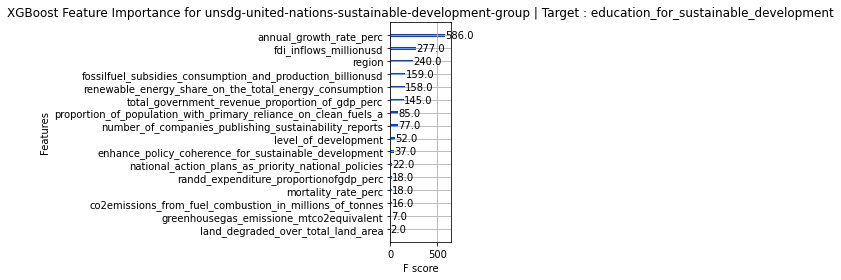

Target Variable: number_of_companies_publishing_sustainability_reports
CATS=====================
['region', 'level_of_development', 'national_action_plans_as_priority_national_policies', 'number_of_companies_publishing_sustainability_reports', 'education_for_sustainable_development', 'enhance_policy_coherence_for_sustainable_development', 'land_degraded_over_total_land_area', 'country_processed']
CONTS=====================
['country', 'greenhousegas_emissione_mtco2equivalent', 'total_government_revenue_proportion_of_gdp_perc', 'fdi_inflows_millionusd', 'annual_growth_rate_perc', 'proportion_of_population_with_primary_reliance_on_clean_fuels_a', 'mortality_rate_perc', 'renewable_energy_share_on_the_total_energy_consumption', 'co2emissions_from_fuel_combustion_in_millions_of_tonnes', 'fossilfuel_subsidies_consumption_and_production_billionusd', 'randd_expenditure_proportionofgdp_perc']
19
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['c

 10%|▉         | 4/42 [00:00<00:02, 15.37it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': -4.09682829353553, 'Adjusted R-Squared': -4.401355770193313, 'RMSE': 6.620297074369491, 'Time taken': 0.15973210334777832}
{'Model': 'BaggingRegressor', 'R-Squared': -2.8616097295276677, 'Adjusted R-Squared': -3.0923348391535352, 'RMSE': 5.762509662807424, 'Time taken': 0.06758904457092285}
{'Model': 'BayesianRidge', 'R-Squared': -2.3251839243374737, 'Adjusted R-Squared': -2.5238584355400273, 'RMSE': 5.347309390765878, 'Time taken': 0.025179147720336914}
{'Model': 'DecisionTreeRegressor', 'R-Squared': -4.526217426710096, 'Adjusted R-Squared': -4.8564002289349135, 'RMSE': 6.893526677918321, 'Time taken': 0.03463578224182129}
{'Model': 'DummyRegressor', 'R-Squared': -0.11280662825331067, 'Adjusted R-Squared': -0.17929507459548977, 'RMSE': 3.0934088844877397, 'Time taken': 0.01601576805114746}
{'Model': 'ElasticNet', 'R-Squared': -0.9722124651958044, 'Adjusted R-Squared': -1.0900490590282583, 'RMSE': 4.118170528976154, 'Time taken': 0.0170509815

 17%|█▋        | 7/42 [00:00<00:02, 17.46it/s]

{'Model': 'ElasticNetCV', 'R-Squared': -1.9951988754399848, 'Adjusted R-Squared': -2.17415729881533, 'RMSE': 5.075049804772585, 'Time taken': 0.11657953262329102}
{'Model': 'ExtraTreeRegressor', 'R-Squared': -5.589004478827359, 'Adjusted R-Squared': -5.9826871363673595, 'RMSE': 7.527267984707962, 'Time taken': 0.04122352600097656}


 21%|██▏       | 9/42 [00:00<00:03, 10.76it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': -3.327069703786643, 'Adjusted R-Squared': -3.585605315019179, 'RMSE': 6.099923973723533, 'Time taken': 0.27947378158569336}
{'Model': 'GammaRegressor', 'R-Squared': -13.660463616614958, 'Adjusted R-Squared': -14.536403266664282, 'RMSE': 11.22797220493362, 'Time taken': 0.020063400268554688}


 26%|██▌       | 11/42 [00:01<00:03,  8.78it/s]

{'Model': 'GaussianProcessRegressor', 'R-Squared': -33749.2930976334, 'Adjusted R-Squared': -35765.82004371842, 'RMSE': 538.7239098340464, 'Time taken': 0.2913839817047119}
{'Model': 'GradientBoostingRegressor', 'R-Squared': -3.8293725027044045, 'Adjusted R-Squared': -4.117919916388002, 'RMSE': 6.4442566611887955, 'Time taken': 0.34033632278442383}


 33%|███▎      | 14/42 [00:02<00:05,  5.29it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': -3.817022565449533, 'Adjusted R-Squared': -4.104832089800292, 'RMSE': 6.436011582654494, 'Time taken': 0.4602382183074951}
{'Model': 'HuberRegressor', 'R-Squared': -0.05540588886471931, 'Adjusted R-Squared': -0.11846473128116486, 'RMSE': 3.0125705980056368, 'Time taken': 0.11187267303466797}
{'Model': 'KNeighborsRegressor', 'R-Squared': -1.501695439739413, 'Adjusted R-Squared': -1.6511678087804476, 'RMSE': 4.638148988066572, 'Time taken': 0.03055739402770996}


 45%|████▌     | 19/42 [00:02<00:02,  9.94it/s]

{'Model': 'KernelRidge', 'R-Squared': -2.419102112181562, 'Adjusted R-Squared': -2.6233880874376934, 'RMSE': 5.422299626813921, 'Time taken': 0.09020638465881348}
{'Model': 'Lars', 'R-Squared': -2.4230204444143366, 'Adjusted R-Squared': -2.6275405338604765, 'RMSE': 5.425405747520858, 'Time taken': 0.022302865982055664}
{'Model': 'LarsCV', 'R-Squared': -2.0629676959669645, 'Adjusted R-Squared': -2.2459751998140476, 'RMSE': 5.132142243468576, 'Time taken': 0.047498464584350586}
{'Model': 'Lasso', 'R-Squared': -1.0562471747561055, 'Adjusted R-Squared': -1.179104710354741, 'RMSE': 4.204991632291624, 'Time taken': 0.04582643508911133}


 57%|█████▋    | 24/42 [00:02<00:01, 13.34it/s]

{'Model': 'LassoCV', 'R-Squared': -2.099667340800567, 'Adjusted R-Squared': -2.2848675907226137, 'RMSE': 5.162796659062975, 'Time taken': 0.1351330280303955}
{'Model': 'LassoLars', 'R-Squared': -0.11280662825331067, 'Adjusted R-Squared': -0.17929507459548977, 'RMSE': 3.0934088844877397, 'Time taken': 0.017976045608520508}
{'Model': 'LassoLarsCV', 'R-Squared': -2.0629676959669645, 'Adjusted R-Squared': -2.2459751998140476, 'RMSE': 5.132142243468576, 'Time taken': 0.05042910575866699}
{'Model': 'LassoLarsIC', 'R-Squared': -2.2628429997662503, 'Adjusted R-Squared': -2.457792738745995, 'RMSE': 5.296946239522844, 'Time taken': 0.02835822105407715}
{'Model': 'LinearRegression', 'R-Squared': -2.4230204444143357, 'Adjusted R-Squared': -2.6275405338604756, 'RMSE': 5.425405747520857, 'Time taken': 0.04594230651855469}
{'Model': 'LinearSVR', 'R-Squared': -0.04653647290882734, 'Adjusted R-Squared': -0.10906538166753088, 'RMSE': 2.999885376160708, 'Time taken': 0.17607927322387695}


 62%|██████▏   | 26/42 [00:04<00:05,  3.18it/s]

{'Model': 'MLPRegressor', 'R-Squared': -6.401812066273341, 'Adjusted R-Squared': -6.844058699163887, 'RMSE': 7.978045404908515, 'Time taken': 1.766115427017212}


 67%|██████▋   | 28/42 [00:05<00:05,  2.68it/s]

{'Model': 'NuSVR', 'R-Squared': -0.017261299052433454, 'Adjusted R-Squared': -0.07804106220336515, 'RMSE': 2.9576292854355657, 'Time taken': 1.0295634269714355}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': -1.9694336657591753, 'Adjusted R-Squared': -2.146852658367428, 'RMSE': 5.053174438866413, 'Time taken': 0.016080617904663086}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': -2.189981495398874, 'Adjusted R-Squared': -2.3805778740547816, 'RMSE': 5.237470122444347, 'Time taken': 0.02935338020324707}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -1.193220367276656, 'Adjusted R-Squared': -1.3242618357617393, 'RMSE': 4.342787826539418, 'Time taken': 0.02009272575378418}
{'Model': 'PoissonRegressor', 'R-Squared': -150.91219783502368, 'Adjusted R-Squared': -159.98871280000938, 'RMSE': 36.14296691226039, 'Time taken': 0.0266263484954834}


 76%|███████▌  | 32/42 [00:27<00:26,  2.65s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.015651465778618423, 'Adjusted R-Squared': -0.07633504392262402, 'RMSE': 2.9552881095561285, 'Time taken': 22.07365655899048}
{'Model': 'RANSACRegressor', 'R-Squared': -0.015651465798045106, 'Adjusted R-Squared': -0.07633504394321133, 'RMSE': 2.9552881095843917, 'Time taken': 0.09149932861328125}


 90%|█████████ | 38/42 [00:28<00:05,  1.26s/it]

{'Model': 'RandomForestRegressor', 'R-Squared': -3.226320836162686, 'Adjusted R-Squared': -3.4788368609648597, 'RMSE': 6.0284922659060864, 'Time taken': 0.5928983688354492}
{'Model': 'Ridge', 'R-Squared': -2.419620345893055, 'Adjusted R-Squared': -2.6239372847986155, 'RMSE': 5.422710540541795, 'Time taken': 0.015048742294311523}
{'Model': 'RidgeCV', 'R-Squared': -2.38961420741241, 'Adjusted R-Squared': -2.5921383267232145, 'RMSE': 5.398866794086338, 'Time taken': 0.027147293090820312}
{'Model': 'SGDRegressor', 'R-Squared': -2.7609132300022012, 'Adjusted R-Squared': -2.9856218821092515, 'RMSE': 5.6868809069096, 'Time taken': 0.024673938751220703}
{'Model': 'SVR', 'R-Squared': -0.009113624676351018, 'Adjusted R-Squared': -0.06940657709412057, 'RMSE': 2.9457610235966, 'Time taken': 0.10192131996154785}
{'Model': 'TransformedTargetRegressor', 'R-Squared': -2.4230204444143357, 'Adjusted R-Squared': -2.6275405338604756, 'RMSE': 5.425405747520857, 'Time taken': 0.020008325576782227}
{'Model':

100%|██████████| 42/42 [00:29<00:00,  1.43it/s]

{'Model': 'XGBRegressor', 'R-Squared': -4.576095120487826, 'Adjusted R-Squared': -4.909258036491817, 'RMSE': 6.9245663, 'Time taken': 0.6479470729827881}
{'Model': 'LGBMRegressor', 'R-Squared': -2.738844403220149, 'Adjusted R-Squared': -2.9622344776263847, 'RMSE': 5.670171209694215, 'Time taken': 0.16461944580078125}
Project: unsdg-united-nations-sustainable-development-group
unsdg-united-nations-sustainable-development-group
Target: number_of_companies_publishing_sustainability_reports
number_of_companies_publishing_sustainability_reports
Target Standard Deviation: 6.578278692388222
                               Adjusted R-Squared  R-Squared   RMSE  \
Model                                                                 
SVR                                         -0.07      -0.01   2.95   
QuantileRegressor                           -0.08      -0.02   2.96   
RANSACRegressor                             -0.08      -0.02   2.96   
NuSVR                                       -0.08     

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_18/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.01
1       1       0.98
2       1       0.98
3       1       0.99
4       1       1.01
XGBoost RMSE:  6.9245796


<Figure size 432x288 with 0 Axes>

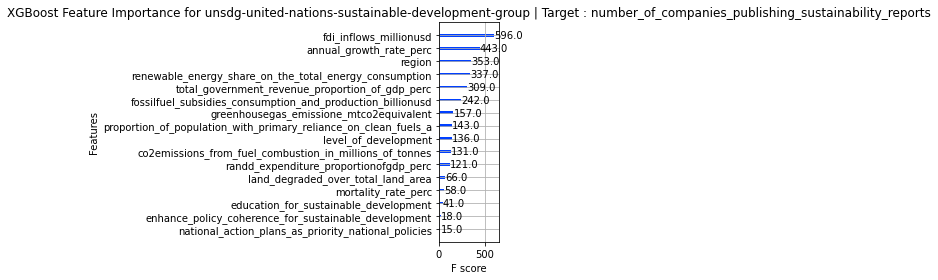

Target Variable: national_action_plans_as_priority_national_policies
CATS=====================
['region', 'level_of_development', 'national_action_plans_as_priority_national_policies', 'number_of_companies_publishing_sustainability_reports', 'education_for_sustainable_development', 'enhance_policy_coherence_for_sustainable_development', 'land_degraded_over_total_land_area', 'country_processed']
CONTS=====================
['country', 'greenhousegas_emissione_mtco2equivalent', 'total_government_revenue_proportion_of_gdp_perc', 'fdi_inflows_millionusd', 'annual_growth_rate_perc', 'proportion_of_population_with_primary_reliance_on_clean_fuels_a', 'mortality_rate_perc', 'renewable_energy_share_on_the_total_energy_consumption', 'co2emissions_from_fuel_combustion_in_millions_of_tonnes', 'fossilfuel_subsidies_consumption_and_production_billionusd', 'randd_expenditure_proportionofgdp_perc']
19
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['cou

  0%|          | 0/42 [00:00<?, ?it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': -0.4153116664466754, 'Adjusted R-Squared': -0.4998743131840555, 'RMSE': 0.1808469990142008, 'Time taken': 0.04575753211975098}


  5%|▍         | 2/42 [00:00<00:02, 18.79it/s]

{'Model': 'BaggingRegressor', 'R-Squared': -0.11161314814814793, 'Adjusted R-Squared': -0.17803028593058445, 'RMSE': 0.16027364009941444, 'Time taken': 0.06041550636291504}
{'Model': 'BayesianRidge', 'R-Squared': 0.0011162329156761963, 'Adjusted R-Squared': -0.05856550159565144, 'RMSE': 0.15192972119804207, 'Time taken': 0.021202564239501953}
{'Model': 'DecisionTreeRegressor', 'R-Squared': -0.7924242424242423, 'Adjusted R-Squared': -0.8995187726319802, 'RMSE': 0.20351933162035313, 'Time taken': 0.025348186492919922}
{'Model': 'DummyRegressor', 'R-Squared': -0.0046754153643886465, 'Adjusted R-Squared': -0.06470319175408501, 'RMSE': 0.15236953799463018, 'Time taken': 0.01663351058959961}
{'Model': 'ElasticNet', 'R-Squared': -0.0046754153643886465, 'Adjusted R-Squared': -0.06470319175408501, 'RMSE': 0.15236953799463018, 'Time taken': 0.017551660537719727}


 17%|█▋        | 7/42 [00:00<00:01, 21.64it/s]

{'Model': 'ElasticNetCV', 'R-Squared': -0.008441293189131116, 'Adjusted R-Squared': -0.0686940748576641, 'RMSE': 0.15265483827917542, 'Time taken': 0.1386737823486328}
{'Model': 'ExtraTreeRegressor', 'R-Squared': -0.9844696969696967, 'Adjusted R-Squared': -1.1030386411282636, 'RMSE': 0.21414478318577007, 'Time taken': 0.018825292587280273}


 24%|██▍       | 10/42 [00:00<00:02, 14.35it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': -0.13645458333333327, 'Adjusted R-Squared': -0.20435595780922444, 'RMSE': 0.16205457843125737, 'Time taken': 0.2717604637145996}
{'Model': 'GammaRegressor', 'R-Squared': -0.00024990351185039117, 'Adjusted R-Squared': -0.060013262526709577, 'RMSE': 0.1520335800327538, 'Time taken': 0.01924300193786621}
{'Model': 'GaussianProcessRegressor', 'R-Squared': -6.795851243004352, 'Adjusted R-Squared': -7.261641097146121, 'RMSE': 0.4244407125072109, 'Time taken': 0.2858450412750244}


 29%|██▊       | 12/42 [00:01<00:04,  7.11it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': -0.10673884844182369, 'Adjusted R-Squared': -0.17286475448080063, 'RMSE': 0.15992186302953215, 'Time taken': 0.3639345169067383}


 33%|███▎      | 14/42 [00:01<00:05,  5.37it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': -0.11382369703042294, 'Adjusted R-Squared': -0.18037291163286961, 'RMSE': 0.16043292067074488, 'Time taken': 0.4765443801879883}
{'Model': 'HuberRegressor', 'R-Squared': -0.024119772383500493, 'Adjusted R-Squared': -0.08530931853220025, 'RMSE': 0.15383694211988405, 'Time taken': 0.1255178451538086}
{'Model': 'KNeighborsRegressor', 'R-Squared': -0.11130303030303024, 'Adjusted R-Squared': -0.17770163903182778, 'RMSE': 0.16025128196922814, 'Time taken': 0.03029656410217285}


 43%|████▎     | 18/42 [00:02<00:03,  7.91it/s]

{'Model': 'KernelRidge', 'R-Squared': -45.44912738151205, 'Adjusted R-Squared': -48.22438970933825, 'RMSE': 1.0360340830926913, 'Time taken': 0.13714361190795898}
{'Model': 'Lars', 'R-Squared': 0.001332212155093826, 'Adjusted R-Squared': -0.05833661793626854, 'RMSE': 0.15191329514295437, 'Time taken': 0.04465651512145996}
{'Model': 'LarsCV', 'R-Squared': -0.007921871879807751, 'Adjusted R-Squared': -0.06814361894180898, 'RMSE': 0.1526155189903568, 'Time taken': 0.0562589168548584}
{'Model': 'Lasso', 'R-Squared': -0.0046754153643886465, 'Adjusted R-Squared': -0.06470319175408501, 'RMSE': 0.15236953799463018, 'Time taken': 0.026411771774291992}


 52%|█████▏    | 22/42 [00:02<00:02,  9.59it/s]

{'Model': 'LassoCV', 'R-Squared': -0.008494910465312255, 'Adjusted R-Squared': -0.06875089568179327, 'RMSE': 0.15265889643699154, 'Time taken': 0.18605852127075195}
{'Model': 'LassoLars', 'R-Squared': -0.0046754153643886465, 'Adjusted R-Squared': -0.06470319175408501, 'RMSE': 0.15236953799463018, 'Time taken': 0.033556222915649414}
{'Model': 'LassoLarsCV', 'R-Squared': -0.007921871879807751, 'Adjusted R-Squared': -0.06814361894180898, 'RMSE': 0.1526155189903568, 'Time taken': 0.08105874061584473}
{'Model': 'LassoLarsIC', 'R-Squared': -0.010013308560940182, 'Adjusted R-Squared': -0.07036001567621653, 'RMSE': 0.15277377544728424, 'Time taken': 0.04315996170043945}


 60%|█████▉    | 25/42 [00:02<00:01, 10.94it/s]

{'Model': 'LinearRegression', 'R-Squared': 0.001332212155093937, 'Adjusted R-Squared': -0.05833661793626854, 'RMSE': 0.15191329514295437, 'Time taken': 0.04424095153808594}
{'Model': 'LinearSVR', 'R-Squared': -0.02424242422690792, 'Adjusted R-Squared': -0.08543929863040245, 'RMSE': 0.15384615384498854, 'Time taken': 0.11981630325317383}
{'Model': 'MLPRegressor', 'R-Squared': -0.31513362733209127, 'Adjusted R-Squared': -0.39371079374501505, 'RMSE': 0.17432922700840622, 'Time taken': 0.5116457939147949}


 64%|██████▍   | 27/42 [00:03<00:02,  5.64it/s]

{'Model': 'NuSVR', 'R-Squared': -0.01993450285531484, 'Adjusted R-Squared': -0.08087398573031801, 'RMSE': 0.15352227764630963, 'Time taken': 0.30599260330200195}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': -0.012497239235911062, 'Adjusted R-Squared': -0.07299235730346565, 'RMSE': 0.15296151873565333, 'Time taken': 0.016114473342895508}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': -0.012497239235911062, 'Adjusted R-Squared': -0.07299235730346565, 'RMSE': 0.15296151873565333, 'Time taken': 0.029819726943969727}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -1.8458895798236732, 'Adjusted R-Squared': -2.0159270075489872, 'RMSE': 0.2564450295352498, 'Time taken': 0.022215843200683594}
{'Model': 'PoissonRegressor', 'R-Squared': -0.00011211027528656992, 'Adjusted R-Squared': -0.05986723636091695, 'RMSE': 0.1520231076895327, 'Time taken': 0.022370100021362305}


 76%|███████▌  | 32/42 [00:25<00:22,  2.22s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.02424242422950096, 'Adjusted R-Squared': -0.08543929863315047, 'RMSE': 0.15384615384518327, 'Time taken': 21.616122722625732}
{'Model': 'RANSACRegressor', 'R-Squared': -0.024242424242424176, 'Adjusted R-Squared': -0.08543929864684574, 'RMSE': 0.15384615384615385, 'Time taken': 0.03971266746520996}


 88%|████████▊ | 37/42 [00:25<00:06,  1.23s/it]

{'Model': 'RandomForestRegressor', 'R-Squared': -0.06559124383417503, 'Adjusted R-Squared': -0.12925864519533659, 'RMSE': 0.15692082572333613, 'Time taken': 0.470383882522583}
{'Model': 'Ridge', 'R-Squared': 0.0013440026477559153, 'Adjusted R-Squared': -0.058324122980208504, 'RMSE': 0.15191239837933584, 'Time taken': 0.017657756805419922}
{'Model': 'RidgeCV', 'R-Squared': 0.0014431346525376476, 'Adjusted R-Squared': -0.05821906799400889, 'RMSE': 0.15190485836837114, 'Time taken': 0.04175090789794922}
{'Model': 'SGDRegressor', 'R-Squared': 0.001403436183238349, 'Adjusted R-Squared': -0.05826113838442981, 'RMSE': 0.15190787789115998, 'Time taken': 0.04356741905212402}
{'Model': 'SVR', 'R-Squared': -0.18207773548950024, 'Adjusted R-Squared': -0.2527050215722064, 'RMSE': 0.16527542472310822, 'Time taken': 0.0815887451171875}


 93%|█████████▎| 39/42 [00:25<00:02,  1.05it/s]

{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.001332212155093937, 'Adjusted R-Squared': -0.05833661793626854, 'RMSE': 0.15191329514295437, 'Time taken': 0.025638341903686523}
{'Model': 'TweedieRegressor', 'R-Squared': -0.00010870361626325042, 'Adjusted R-Squared': -0.05986362615937346, 'RMSE': 0.1520228487728936, 'Time taken': 0.022663116455078125}


100%|██████████| 42/42 [00:26<00:00,  1.57it/s]

{'Model': 'XGBRegressor', 'R-Squared': -0.23413024112094183, 'Adjusted R-Squared': -0.3078675825715642, 'RMSE': 0.16887516, 'Time taken': 0.6403806209564209}
{'Model': 'LGBMRegressor', 'R-Squared': -0.10165798662514458, 'Adjusted R-Squared': -0.16748031915935147, 'RMSE': 0.1595543528454887, 'Time taken': 0.1653132438659668}
Project: unsdg-united-nations-sustainable-development-group
unsdg-united-nations-sustainable-development-group
Target: national_action_plans_as_priority_national_policies
national_action_plans_as_priority_national_policies
Target Standard Deviation: 0.11444705448121736
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
RidgeCV                                     -0.06       0.00  0.15        0.04
SGDRegressor                                -0.06       0.00  0.15        0.04
Ridge                                       -0.06       0.00  0.15        0.02
Lars     

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_18/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.00
1       1       1.16
2       1       1.00
3       1       1.01
4       1       1.00
XGBoost RMSE:  0.16887121


<Figure size 432x288 with 0 Axes>

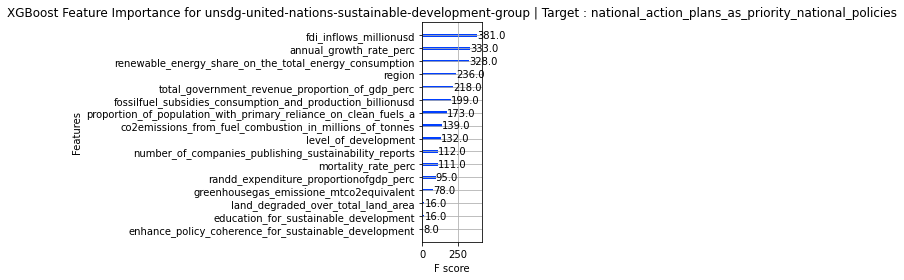

Target Variable: randd_expenditure_proportionofgdp_perc
CATS=====================
['region', 'level_of_development', 'national_action_plans_as_priority_national_policies', 'number_of_companies_publishing_sustainability_reports', 'education_for_sustainable_development', 'enhance_policy_coherence_for_sustainable_development', 'land_degraded_over_total_land_area', 'country_processed']
CONTS=====================
['country', 'greenhousegas_emissione_mtco2equivalent', 'total_government_revenue_proportion_of_gdp_perc', 'fdi_inflows_millionusd', 'annual_growth_rate_perc', 'proportion_of_population_with_primary_reliance_on_clean_fuels_a', 'mortality_rate_perc', 'renewable_energy_share_on_the_total_energy_consumption', 'co2emissions_from_fuel_combustion_in_millions_of_tonnes', 'fossilfuel_subsidies_consumption_and_production_billionusd']
18
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['country', 'greenhousegas_emissione_mtco2equivalent', 'tota

  7%|▋         | 3/42 [00:00<00:03, 11.37it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.7383240131195401, 'Adjusted R-Squared': 0.7226892843436635, 'RMSE': 0.0037766709893768133, 'Time taken': 0.17298316955566406}
{'Model': 'BaggingRegressor', 'R-Squared': 0.8990943922454755, 'Adjusted R-Squared': 0.8930654408387586, 'RMSE': 0.002345226906312935, 'Time taken': 0.08306765556335449}
{'Model': 'BayesianRidge', 'R-Squared': 0.4679385030019958, 'Adjusted R-Squared': 0.4361486651310458, 'RMSE': 0.00538527806726242, 'Time taken': 0.03154301643371582}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.8062952451213361, 'Adjusted R-Squared': 0.7947216905845605, 'RMSE': 0.0032493564659783233, 'Time taken': 0.05820465087890625}


 17%|█▋        | 7/42 [00:00<00:02, 12.24it/s]

{'Model': 'DummyRegressor', 'R-Squared': -0.0032775130690791965, 'Adjusted R-Squared': -0.06322176699459026, 'RMSE': 0.0073949927, 'Time taken': 0.04437875747680664}
{'Model': 'ElasticNet', 'R-Squared': -0.0032775227200145807, 'Adjusted R-Squared': -0.06322177722215394, 'RMSE': 0.007394992844542048, 'Time taken': 0.020564794540405273}
{'Model': 'ElasticNetCV', 'R-Squared': 0.47919006083838844, 'Adjusted R-Squared': 0.4480724858570343, 'RMSE': 0.0053280322969035745, 'Time taken': 0.17244958877563477}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 0.7886325238776706, 'Adjusted R-Squared': 0.7760036495181604, 'RMSE': 0.0033942693123864063, 'Time taken': 0.047749996185302734}


 21%|██▏       | 9/42 [00:01<00:04,  7.61it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.922401416730535, 'Adjusted R-Squared': 0.9177650233905355, 'RMSE': 0.0020566202754381995, 'Time taken': 0.3726949691772461}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution


 26%|██▌       | 11/42 [00:01<00:04,  7.74it/s]

{'Model': 'GaussianProcessRegressor', 'R-Squared': -740.8305971540417, 'Adjusted R-Squared': -785.1538089336858, 'RMSE': 0.20108495944705562, 'Time taken': 0.24036240577697754}


 29%|██▊       | 12/42 [00:01<00:04,  6.00it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.8837351325123969, 'Adjusted R-Squared': 0.876788489486408, 'RMSE': 0.0025173955916382835, 'Time taken': 0.31421709060668945}


 31%|███       | 13/42 [00:02<00:06,  4.25it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.8907762904790104, 'Adjusted R-Squared': 0.8842503455705236, 'RMSE': 0.0024399766933127834, 'Time taken': 0.4747018814086914}
{'Model': 'HuberRegressor', 'R-Squared': -2.7785053312905386, 'Adjusted R-Squared': -3.00426508378903, 'RMSE': 0.014351167604974496, 'Time taken': 0.05535578727722168}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.7756505251829153, 'Adjusted R-Squared': 0.762245996813341, 'RMSE': 0.0034969526, 'Time taken': 0.03322124481201172}


 43%|████▎     | 18/42 [00:02<00:02,  8.20it/s]

{'Model': 'KernelRidge', 'R-Squared': 0.29860346811925986, 'Adjusted R-Squared': 0.25669612816412124, 'RMSE': 0.006183139201770201, 'Time taken': 0.12072181701660156}
{'Model': 'Lars', 'R-Squared': 0.46740366227714847, 'Adjusted R-Squared': 0.4355818685138334, 'RMSE': 0.005387984091450452, 'Time taken': 0.03823065757751465}
{'Model': 'LarsCV', 'R-Squared': 0.4791418736209663, 'Adjusted R-Squared': 0.4480214195291372, 'RMSE': 0.005328278775602418, 'Time taken': 0.06271982192993164}
{'Model': 'Lasso', 'R-Squared': -0.0032775227200145807, 'Adjusted R-Squared': -0.06322177722215394, 'RMSE': 0.007394992844542048, 'Time taken': 0.030922889709472656}


 52%|█████▏    | 22/42 [00:02<00:02,  9.96it/s]

{'Model': 'LassoCV', 'R-Squared': 0.4791954281602022, 'Adjusted R-Squared': 0.4480781738678872, 'RMSE': 0.005328004842226253, 'Time taken': 0.17096590995788574}
{'Model': 'LassoLars', 'R-Squared': -0.0032775227200145807, 'Adjusted R-Squared': -0.06322177722215394, 'RMSE': 0.007394992844542048, 'Time taken': 0.03212928771972656}
{'Model': 'LassoLarsCV', 'R-Squared': 0.4791418736209663, 'Adjusted R-Squared': 0.4480214195291372, 'RMSE': 0.005328278775602418, 'Time taken': 0.09288287162780762}
{'Model': 'LassoLarsIC', 'R-Squared': 0.47816384930334344, 'Adjusted R-Squared': 0.4469849597963105, 'RMSE': 0.005333278930116866, 'Time taken': 0.030038833618164062}
{'Model': 'LinearRegression', 'R-Squared': 0.4674036622771488, 'Adjusted R-Squared': 0.43558186851383374, 'RMSE': 0.005387984091450451, 'Time taken': 0.018004655838012695}


 60%|█████▉    | 25/42 [00:02<00:01, 11.04it/s]

{'Model': 'LinearSVR', 'R-Squared': -7.737251702595522, 'Adjusted R-Squared': -8.259288754008463, 'RMSE': 0.021823009432773023, 'Time taken': 0.17365217208862305}
{'Model': 'MLPRegressor', 'R-Squared': -121.34609063370831, 'Adjusted R-Squared': -128.65607718100537, 'RMSE': 0.08166242366539604, 'Time taken': 0.2381000518798828}


 74%|███████▍  | 31/42 [00:04<00:01,  6.32it/s]

{'Model': 'NuSVR', 'R-Squared': 0.8187121552856733, 'Adjusted R-Squared': 0.8078804916077733, 'RMSE': 0.0031434862117891175, 'Time taken': 1.1687216758728027}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.3367891153587883, 'Adjusted R-Squared': 0.2971633077858856, 'RMSE': 0.0060124716207851, 'Time taken': 0.01742696762084961}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.4575404743571001, 'Adjusted R-Squared': 0.42512937062371925, 'RMSE': 0.0054376454481909675, 'Time taken': 0.045801401138305664}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.24503173191046113, 'Adjusted R-Squared': -0.3194204202950486, 'RMSE': 0.008237917285961903, 'Time taken': 0.020655393600463867}
{'Model': 'PoissonRegressor', 'R-Squared': 0.005677344106584381, 'Adjusted R-Squared': -0.053731871182644886, 'RMSE': 0.007361916450471851, 'Time taken': 0.03285551071166992}


 76%|███████▌  | 32/42 [41:05<55:41, 334.15s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -2.213327332881742e+75, 'Adjusted R-Squared': -2.3455701609470035e+75, 'RMSE': 3.473361934997892e+35, 'Time taken': 2460.674504995346}


 79%|███████▊  | 33/42 [41:05<41:59, 279.92s/it]

{'Model': 'RANSACRegressor', 'R-Squared': -0.24503173191046113, 'Adjusted R-Squared': -0.3194204202950486, 'RMSE': 0.008237917285961903, 'Time taken': 0.256472110748291}


 90%|█████████ | 38/42 [41:06<07:35, 113.94s/it]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.8955968401637371, 'Adjusted R-Squared': 0.889358915519432, 'RMSE': 0.002385525363308904, 'Time taken': 0.7106795310974121}
{'Model': 'Ridge', 'R-Squared': 0.467427716040945, 'Adjusted R-Squared': 0.4356073594521964, 'RMSE': 0.005387862420730217, 'Time taken': 0.02248978614807129}
{'Model': 'RidgeCV', 'R-Squared': 0.46762774759225034, 'Adjusted R-Squared': 0.4358193425741772, 'RMSE': 0.005386850498284743, 'Time taken': 0.03680753707885742}
{'Model': 'SGDRegressor', 'R-Squared': 0.48422110483700076, 'Adjusted R-Squared': 0.4534041268241171, 'RMSE': 0.005302235347610776, 'Time taken': 0.04123115539550781}
{'Model': 'SVR', 'R-Squared': -4.057748123483412, 'Adjusted R-Squared': -4.35994062142739, 'RMSE': 0.016603735855171997, 'Time taken': 0.04026436805725098}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.4674036622771488, 'Adjusted R-Squared': 0.43558186851383374, 'RMSE': 0.005387984091450451, 'Time taken': 0.029551982879638672}
{'

100%|██████████| 42/42 [41:07<00:00, 58.74s/it]

{'Model': 'XGBRegressor', 'R-Squared': 0.8931210940001675, 'Adjusted R-Squared': 0.8867352474152719, 'RMSE': 0.002413644, 'Time taken': 0.5111472606658936}
{'Model': 'LGBMRegressor', 'R-Squared': 0.909153152597161, 'Adjusted R-Squared': 0.9037251963057964, 'RMSE': 0.00222526710131174, 'Time taken': 0.14067411422729492}
Project: unsdg-united-nations-sustainable-development-group
unsdg-united-nations-sustainable-development-group
Target: randd_expenditure_proportionofgdp_perc
randd_expenditure_proportionofgdp_perc
Target Standard Deviation: 0.007114727981388569
                                                                                            Adjusted R-Squared  \
Model                                                                                                            
ExtraTreesRegressor                                                                                       0.92   
LGBMRegressor                                                                               

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_18/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0    0.00       0.00
1    0.00       0.00
2    0.00       0.00
3    0.00       0.00
4    0.00       0.00
XGBoost RMSE:  0.002413644


<Figure size 432x288 with 0 Axes>

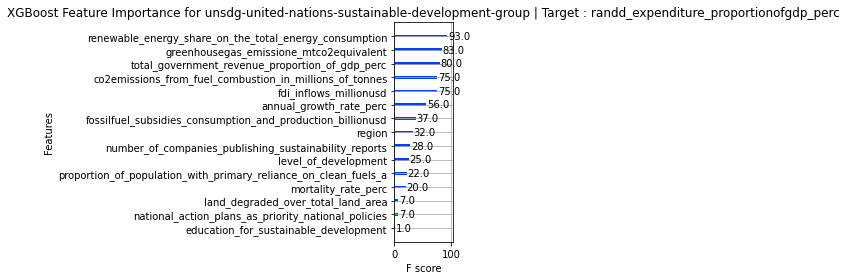

Target Variable: fossilfuel_subsidies_consumption_and_production_billionusd
CATS=====================
['region', 'level_of_development', 'national_action_plans_as_priority_national_policies', 'number_of_companies_publishing_sustainability_reports', 'education_for_sustainable_development', 'enhance_policy_coherence_for_sustainable_development', 'land_degraded_over_total_land_area', 'country_processed']
CONTS=====================
['country', 'greenhousegas_emissione_mtco2equivalent', 'total_government_revenue_proportion_of_gdp_perc', 'fdi_inflows_millionusd', 'annual_growth_rate_perc', 'proportion_of_population_with_primary_reliance_on_clean_fuels_a', 'mortality_rate_perc', 'renewable_energy_share_on_the_total_energy_consumption', 'co2emissions_from_fuel_combustion_in_millions_of_tonnes', 'randd_expenditure_proportionofgdp_perc']
18
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['country', 'greenhousegas_emissione_mtco2equivalent', 'tota

  5%|▍         | 2/42 [00:00<00:05,  7.41it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.5227679511418972, 'Adjusted R-Squared': 0.49425408658748227, 'RMSE': 1.4492305657916371, 'Time taken': 0.16896986961364746}
{'Model': 'BaggingRegressor', 'R-Squared': 0.7918457441816145, 'Adjusted R-Squared': 0.7794088546830317, 'RMSE': 0.9571176650423175, 'Time taken': 0.10970163345336914}
{'Model': 'BayesianRidge', 'R-Squared': 0.3597244769351391, 'Adjusted R-Squared': 0.32146902115453413, 'RMSE': 1.678634459994473, 'Time taken': 0.0368955135345459}


 10%|▉         | 4/42 [00:00<00:03, 12.02it/s]

{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.6955939084872915, 'Adjusted R-Squared': 0.6774061231453372, 'RMSE': 1.1574423103634457, 'Time taken': 0.06653094291687012}
{'Model': 'DummyRegressor', 'R-Squared': -0.004138444106103423, 'Adjusted R-Squared': -0.06413413730741158, 'RMSE': 2.102178, 'Time taken': 0.031421661376953125}
{'Model': 'ElasticNet', 'R-Squared': 0.1558577644663901, 'Adjusted R-Squared': 0.10542159316092281, 'RMSE': 1.9274383666940749, 'Time taken': 0.029020309448242188}


 17%|█▋        | 7/42 [00:00<00:02, 12.14it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.3590954840315027, 'Adjusted R-Squared': 0.32080244691388804, 'RMSE': 1.679458784790225, 'Time taken': 0.17631196975708008}
{'Model': 'ExtraTreeRegressor', 'R-Squared': -0.44997167806088667, 'Adjusted R-Squared': -0.5366052059953423, 'RMSE': 2.526111082563897, 'Time taken': 0.04437708854675293}


 21%|██▏       | 9/42 [00:01<00:04,  7.59it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.5108057698726234, 'Adjusted R-Squared': 0.48157718379583037, 'RMSE': 1.4672811814127589, 'Time taken': 0.39699316024780273}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution


 26%|██▌       | 11/42 [00:01<00:04,  7.37it/s]

{'Model': 'GaussianProcessRegressor', 'R-Squared': -9.628113572995028, 'Adjusted R-Squared': -10.263126648111085, 'RMSE': 6.839128722216563, 'Time taken': 0.27725887298583984}


 29%|██▊       | 12/42 [00:01<00:05,  5.77it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.7379097447949421, 'Adjusted R-Squared': 0.7222502641380362, 'RMSE': 1.0739847666045192, 'Time taken': 0.3278810977935791}


 33%|███▎      | 14/42 [00:02<00:05,  4.78it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.306331332836144, 'Adjusted R-Squared': 0.26488572064710847, 'RMSE': 1.7472245509167557, 'Time taken': 0.4614126682281494}
{'Model': 'HuberRegressor', 'R-Squared': -0.0419432014231651, 'Adjusted R-Squared': -0.10419766943272535, 'RMSE': 2.141384758190572, 'Time taken': 0.11944413185119629}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.04548644403250757, 'Adjusted R-Squared': -0.01154424012907218, 'RMSE': 2.0495744, 'Time taken': 0.030550479888916016}


 43%|████▎     | 18/42 [00:02<00:02,  8.33it/s]

{'Model': 'KernelRidge', 'R-Squared': 0.2657064816827721, 'Adjusted R-Squared': 0.22183359851287476, 'RMSE': 1.7976599042615755, 'Time taken': 0.11827969551086426}
{'Model': 'Lars', 'R-Squared': 0.3594765737175719, 'Adjusted R-Squared': 0.3212063061095023, 'RMSE': 1.6789593971474464, 'Time taken': 0.04949331283569336}
{'Model': 'LarsCV', 'R-Squared': 0.3593444232961971, 'Adjusted R-Squared': 0.321066259908234, 'RMSE': 1.6791325865576725, 'Time taken': 0.062203168869018555}
{'Model': 'Lasso', 'R-Squared': 0.010611376834562258, 'Adjusted R-Squared': -0.04850303775708342, 'RMSE': 2.0866813793319854, 'Time taken': 0.03266716003417969}


 52%|█████▏    | 22/42 [00:02<00:01, 10.72it/s]

{'Model': 'LassoCV', 'R-Squared': 0.3592297102225319, 'Adjusted R-Squared': 0.3209446929087838, 'RMSE': 1.6792829090129118, 'Time taken': 0.16316580772399902}
{'Model': 'LassoLars', 'R-Squared': -0.004138395912549164, 'Adjusted R-Squared': -0.06413408623436823, 'RMSE': 2.1021779258595896, 'Time taken': 0.042821645736694336}
{'Model': 'LassoLarsCV', 'R-Squared': 0.3593444232961971, 'Adjusted R-Squared': 0.321066259908234, 'RMSE': 1.6791325865576725, 'Time taken': 0.06194019317626953}
{'Model': 'LassoLarsIC', 'R-Squared': 0.3594765737175719, 'Adjusted R-Squared': 0.3212063061095023, 'RMSE': 1.6789593971474464, 'Time taken': 0.03444218635559082}
{'Model': 'LinearRegression', 'R-Squared': 0.3594765737175728, 'Adjusted R-Squared': 0.3212063061095032, 'RMSE': 1.6789593971474452, 'Time taken': 0.019321441650390625}


 60%|█████▉    | 25/42 [00:03<00:01, 11.78it/s]

{'Model': 'LinearSVR', 'R-Squared': -0.044763736426703726, 'Adjusted R-Squared': -0.10718672696792209, 'RMSE': 2.1442811582630337, 'Time taken': 0.1637730598449707}
{'Model': 'MLPRegressor', 'R-Squared': 0.21543073872160245, 'Adjusted R-Squared': 0.1685539589596855, 'RMSE': 1.8581823429242952, 'Time taken': 1.9772794246673584}


 64%|██████▍   | 27/42 [00:05<00:06,  2.20it/s]

{'Model': 'NuSVR', 'R-Squared': -0.016945683951517188, 'Adjusted R-Squared': -0.0777065895964193, 'RMSE': 2.1155415684850536, 'Time taken': 0.801222562789917}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': -0.04173535779953519, 'Adjusted R-Squared': -0.10397740747938178, 'RMSE': 2.1411711691173907, 'Time taken': 0.014891862869262695}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.3679280343504644, 'Adjusted R-Squared': 0.33016272822674997, 'RMSE': 1.6678460039363476, 'Time taken': 0.03122544288635254}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.036063776431009, 'Adjusted R-Squared': -0.09796695804166689, 'RMSE': 2.135334561765642, 'Time taken': 0.020420551300048828}
{'Model': 'PoissonRegressor', 'R-Squared': 0.13609002504817969, 'Adjusted R-Squared': 0.0844727623938255, 'RMSE': 1.9498757080305933, 'Time taken': 0.025584936141967773}


 79%|███████▊  | 33/42 [42:03<33:12, 221.34s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -6.708542248876292e+87, 'Adjusted R-Squared': -7.109367100224247e+87, 'RMSE': 1.7182516282298541e+44, 'Time taken': 2517.3849699497223}
{'Model': 'RANSACRegressor', 'R-Squared': -0.029176160235310222, 'Adjusted R-Squared': -0.09066781760786036, 'RMSE': 2.128225014076022, 'Time taken': 0.1432807445526123}


 88%|████████▊ | 37/42 [42:04<09:28, 113.75s/it]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.7522180152713448, 'Adjusted R-Squared': 0.7374134312781233, 'RMSE': 1.044257367907703, 'Time taken': 0.9136805534362793}
{'Model': 'Ridge', 'R-Squared': 0.3594994270494828, 'Adjusted R-Squared': 0.32123052489206194, 'RMSE': 1.6789294449575263, 'Time taken': 0.018485069274902344}
{'Model': 'RidgeCV', 'R-Squared': 0.3596532890976152, 'Adjusted R-Squared': 0.32139357995564877, 'RMSE': 1.6787277753185244, 'Time taken': 0.03508400917053223}
{'Model': 'SGDRegressor', 'R-Squared': 0.3696477712780669, 'Adjusted R-Squared': 0.3319852167317878, 'RMSE': 1.665575526712203, 'Time taken': 0.04874467849731445}


 93%|█████████▎| 39/42 [42:04<04:08, 82.70s/it] 

{'Model': 'SVR', 'R-Squared': -0.0019605434858898096, 'Adjusted R-Squared': -0.06182611054951215, 'RMSE': 2.0998970060096136, 'Time taken': 0.10986900329589844}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.3594765737175728, 'Adjusted R-Squared': 0.3212063061095032, 'RMSE': 1.6789593971474452, 'Time taken': 0.017085552215576172}
{'Model': 'TweedieRegressor', 'R-Squared': 0.2709198340933304, 'Adjusted R-Squared': 0.2273584405328689, 'RMSE': 1.791267005330644, 'Time taken': 0.023084163665771484}


100%|██████████| 42/42 [42:05<00:00, 60.13s/it]

{'Model': 'XGBRegressor', 'R-Squared': 0.6686525493647366, 'Adjusted R-Squared': 0.6488550601758372, 'RMSE': 1.2075762, 'Time taken': 0.6539263725280762}
{'Model': 'LGBMRegressor', 'R-Squared': 0.3978337999806063, 'Adjusted R-Squared': 0.3618553163316488, 'RMSE': 1.6279118024279415, 'Time taken': 0.14828157424926758}
Project: unsdg-united-nations-sustainable-development-group
unsdg-united-nations-sustainable-development-group
Target: fossilfuel_subsidies_consumption_and_production_billionusd
fossilfuel_subsidies_consumption_and_production_billionusd
Target Standard Deviation: 2.7277448177337646
                                                                                                        Adjusted R-Squared  \
Model                                                                                                                        
BaggingRegressor                                                                                                      0.78   
RandomForestRegresso

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_18/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0    0.00       0.04
1    0.00       0.01
2    0.00       0.00
3    0.00      -0.00
4    0.00       0.54
XGBoost RMSE:  1.2077415


<Figure size 432x288 with 0 Axes>

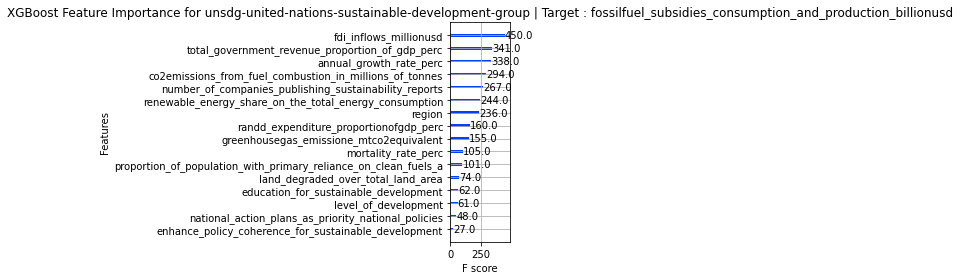

Target Variable: co2emissions_from_fuel_combustion_in_millions_of_tonnes
CATS=====================
['region', 'level_of_development', 'national_action_plans_as_priority_national_policies', 'number_of_companies_publishing_sustainability_reports', 'education_for_sustainable_development', 'enhance_policy_coherence_for_sustainable_development', 'land_degraded_over_total_land_area', 'country_processed']
CONTS=====================
['country', 'greenhousegas_emissione_mtco2equivalent', 'total_government_revenue_proportion_of_gdp_perc', 'fdi_inflows_millionusd', 'annual_growth_rate_perc', 'proportion_of_population_with_primary_reliance_on_clean_fuels_a', 'mortality_rate_perc', 'renewable_energy_share_on_the_total_energy_consumption', 'fossilfuel_subsidies_consumption_and_production_billionusd', 'randd_expenditure_proportionofgdp_perc']
18
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['country', 'greenhousegas_emissione_mtco2equivalent', 'tota

  0%|          | 0/42 [00:00<?, ?it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.9853742054010725, 'Adjusted R-Squared': 0.9845003371703189, 'RMSE': 132.88824918639455, 'Time taken': 0.08260631561279297}


  5%|▍         | 2/42 [00:00<00:03, 11.03it/s]

{'Model': 'BaggingRegressor', 'R-Squared': 0.8609747843295031, 'Adjusted R-Squared': 0.8526682462862973, 'RMSE': 409.7072351154512, 'Time taken': 0.0984187126159668}
{'Model': 'BayesianRidge', 'R-Squared': 0.5679594308047031, 'Adjusted R-Squared': 0.5421456861043552, 'RMSE': 722.2525924559707, 'Time taken': 0.053114891052246094}


 10%|▉         | 4/42 [00:00<00:02, 12.76it/s]

{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.7540021682317488, 'Adjusted R-Squared': 0.7393041845726395, 'RMSE': 544.9949577160928, 'Time taken': 0.07643008232116699}
{'Model': 'DummyRegressor', 'R-Squared': -0.00642215158663384, 'Adjusted R-Squared': -0.06655429271916868, 'RMSE': 1102.3435, 'Time taken': 0.018741369247436523}
{'Model': 'ElasticNet', 'R-Squared': 0.4968198330846014, 'Adjusted R-Squared': 0.4667556092751908, 'RMSE': 779.4506113522607, 'Time taken': 0.01731395721435547}


 17%|█▋        | 7/42 [00:00<00:02, 13.66it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.5114932834096361, 'Adjusted R-Squared': 0.4823057751856834, 'RMSE': 768.001581318893, 'Time taken': 0.16641974449157715}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 0.967965569841509, 'Adjusted R-Squared': 0.9660515630081401, 'RMSE': 196.66874484265554, 'Time taken': 0.0245969295501709}


 21%|██▏       | 9/42 [00:01<00:04,  7.61it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.9746888851539809, 'Adjusted R-Squared': 0.9731765858392817, 'RMSE': 174.81652447620382, 'Time taken': 0.45256590843200684}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution


 26%|██▌       | 11/42 [00:01<00:04,  7.68it/s]

{'Model': 'GaussianProcessRegressor', 'R-Squared': -0.3207888992430419, 'Adjusted R-Squared': -0.3997039592607081, 'RMSE': 1262.8261011685966, 'Time taken': 0.24423956871032715}


 29%|██▊       | 12/42 [00:01<00:04,  6.06it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.976027163181447, 'Adjusted R-Squared': 0.9745948238746781, 'RMSE': 170.1322161506015, 'Time taken': 0.30760955810546875}


 31%|███       | 13/42 [00:02<00:06,  4.28it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.8112668116286251, 'Adjusted R-Squared': 0.7999903003737316, 'RMSE': 477.36544981320964, 'Time taken': 0.48248291015625}
{'Model': 'HuberRegressor', 'R-Squared': 0.35956060001173507, 'Adjusted R-Squared': 0.3212953528426248, 'RMSE': 879.3582968813149, 'Time taken': 0.04947781562805176}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.6521466470056307, 'Adjusted R-Squared': 0.6313629561034514, 'RMSE': 648.0745, 'Time taken': 0.02913665771484375}


 43%|████▎     | 18/42 [00:02<00:02,  8.07it/s]

{'Model': 'KernelRidge', 'R-Squared': 0.5599608188703127, 'Adjusted R-Squared': 0.5336691696833187, 'RMSE': 728.9076672289469, 'Time taken': 0.12887811660766602}
{'Model': 'Lars', 'R-Squared': 0.5692272551012927, 'Adjusted R-Squared': 0.5434892609092314, 'RMSE': 721.1920877127998, 'Time taken': 0.041579246520996094}
{'Model': 'LarsCV', 'R-Squared': 0.5692272551012927, 'Adjusted R-Squared': 0.5434892609092314, 'RMSE': 721.1920877127998, 'Time taken': 0.06678009033203125}
{'Model': 'Lasso', 'R-Squared': 0.5684336871847655, 'Adjusted R-Squared': 0.5426482785574401, 'RMSE': 721.8560707208404, 'Time taken': 0.03367280960083008}


 52%|█████▏    | 22/42 [00:02<00:02,  9.50it/s]

{'Model': 'LassoCV', 'R-Squared': 0.5689133499747774, 'Adjusted R-Squared': 0.5431566004449684, 'RMSE': 721.4548070575706, 'Time taken': 0.17188715934753418}
{'Model': 'LassoLars', 'R-Squared': 0.5328001473236789, 'Adjusted R-Squared': 0.5048856907172319, 'RMSE': 751.06615706032, 'Time taken': 0.0398554801940918}
{'Model': 'LassoLarsCV', 'R-Squared': 0.5692272551012927, 'Adjusted R-Squared': 0.5434892609092314, 'RMSE': 721.1920877127998, 'Time taken': 0.11210918426513672}


 57%|█████▋    | 24/42 [00:02<00:01, 11.14it/s]

{'Model': 'LassoLarsIC', 'R-Squared': 0.5647716680346551, 'Adjusted R-Squared': 0.5387674595210024, 'RMSE': 724.9122253008534, 'Time taken': 0.06200075149536133}
{'Model': 'LinearRegression', 'R-Squared': 0.5692272551012926, 'Adjusted R-Squared': 0.5434892609092314, 'RMSE': 721.1920877127999, 'Time taken': 0.044025421142578125}
{'Model': 'LinearSVR', 'R-Squared': 0.2741804729166437, 'Adjusted R-Squared': 0.23081389739908464, 'RMSE': 936.1407892864366, 'Time taken': 0.04578590393066406}


 64%|██████▍   | 27/42 [00:04<00:04,  3.30it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.4203660614980501, 'Adjusted R-Squared': 0.38573384504667574, 'RMSE': 836.5728148154859, 'Time taken': 1.7252380847930908}
{'Model': 'NuSVR', 'R-Squared': -0.020851503954352424, 'Adjusted R-Squared': -0.08184577620319744, 'RMSE': 1110.2176594311516, 'Time taken': 0.16437196731567383}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.3963286500737663, 'Adjusted R-Squared': 0.3602602360844629, 'RMSE': 853.7429433333953, 'Time taken': 0.015262126922607422}


 74%|███████▍  | 31/42 [00:04<00:01,  5.94it/s]

{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.5627048921575127, 'Adjusted R-Squared': 0.5365771970348483, 'RMSE': 726.6313880166963, 'Time taken': 0.03579592704772949}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.35255726547966293, 'Adjusted R-Squared': 0.3138735800837936, 'RMSE': 884.1532047263017, 'Time taken': 0.026347637176513672}
{'Model': 'PoissonRegressor', 'R-Squared': 0.6854272619853305, 'Adjusted R-Squared': 0.6666320355001774, 'RMSE': 616.2932140849473, 'Time taken': 0.0643911361694336}


 76%|███████▌  | 32/42 [01:01<01:27,  8.78s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.02947904060488238, 'Adjusted R-Squared': -0.09098879460328746, 'RMSE': 1114.8991880223866, 'Time taken': 56.59345316886902}


 79%|███████▊  | 33/42 [01:01<01:05,  7.26s/it]

{'Model': 'RANSACRegressor', 'R-Squared': 0.3299241191073983, 'Adjusted R-Squared': 0.2898881388024943, 'RMSE': 899.4744625491645, 'Time taken': 0.27698397636413574}


 83%|████████▎ | 35/42 [01:02<00:34,  4.95s/it]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.9265671199880359, 'Adjusted R-Squared': 0.9221796208678241, 'RMSE': 297.7639557082759, 'Time taken': 0.8669750690460205}
{'Model': 'Ridge', 'R-Squared': 0.5691630364476414, 'Adjusted R-Squared': 0.5434212052919973, 'RMSE': 721.2458425748206, 'Time taken': 0.016414880752563477}
{'Model': 'RidgeCV', 'R-Squared': 0.5692208518930711, 'Adjusted R-Squared': 0.5434824751193867, 'RMSE': 721.197447761688, 'Time taken': 0.04354548454284668}
{'Model': 'SGDRegressor', 'R-Squared': 0.5643758282217379, 'Adjusted R-Squared': 0.538347968901653, 'RMSE': 725.2418039188221, 'Time taken': 0.04701948165893555}


 90%|█████████ | 38/42 [01:02<00:11,  2.91s/it]

{'Model': 'SVR', 'R-Squared': -0.021941036600168884, 'Adjusted R-Squared': -0.08300040671149977, 'RMSE': 1110.8099570383379, 'Time taken': 0.17612957954406738}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.5692272551012926, 'Adjusted R-Squared': 0.5434892609092314, 'RMSE': 721.1920877127999, 'Time taken': 0.017203807830810547}
{'Model': 'TweedieRegressor', 'R-Squared': 0.4307653240221814, 'Adjusted R-Squared': 0.39675444715558206, 'RMSE': 829.034337121902, 'Time taken': 0.022906780242919922}


100%|██████████| 42/42 [01:03<00:00,  1.52s/it]

{'Model': 'XGBRegressor', 'R-Squared': 0.808571300822087, 'Adjusted R-Squared': 0.7971337370347273, 'RMSE': 480.76218, 'Time taken': 0.6600477695465088}
{'Model': 'LGBMRegressor', 'R-Squared': 0.8535946433980458, 'Adjusted R-Squared': 0.8448471535381806, 'RMSE': 420.44125906456935, 'Time taken': 0.14479446411132812}
Project: unsdg-united-nations-sustainable-development-group
unsdg-united-nations-sustainable-development-group
Target: co2emissions_from_fuel_combustion_in_millions_of_tonnes
co2emissions_from_fuel_combustion_in_millions_of_tonnes
Target Standard Deviation: 703.8630981445312
                               Adjusted R-Squared  R-Squared    RMSE  \
Model                                                                  
AdaBoostRegressor                            0.98       0.99  132.89   
GradientBoostingRegressor                    0.97       0.98  170.13   
ExtraTreesRegressor                          0.97       0.97  174.82   
ExtraTreeRegressor                           0

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_18/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0    0.00       3.29
1    0.00      -0.22
2    0.00       1.51
3    0.00       1.30
4  361.33     348.82
XGBoost RMSE:  480.76257


<Figure size 432x288 with 0 Axes>

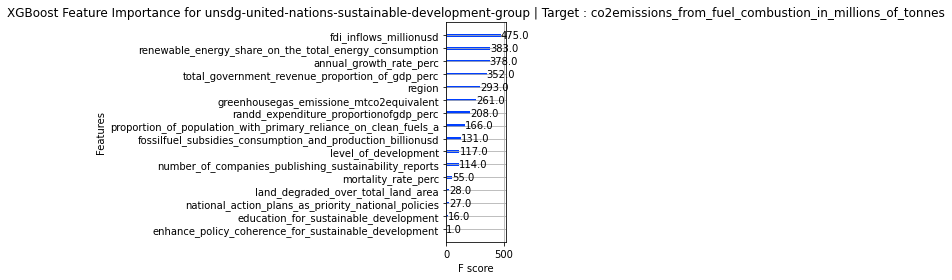

Target Variable: renewable_energy_share_on_the_total_energy_consumption
CATS=====================
['region', 'level_of_development', 'national_action_plans_as_priority_national_policies', 'number_of_companies_publishing_sustainability_reports', 'education_for_sustainable_development', 'enhance_policy_coherence_for_sustainable_development', 'land_degraded_over_total_land_area', 'country_processed']
CONTS=====================
['country', 'greenhousegas_emissione_mtco2equivalent', 'total_government_revenue_proportion_of_gdp_perc', 'fdi_inflows_millionusd', 'annual_growth_rate_perc', 'proportion_of_population_with_primary_reliance_on_clean_fuels_a', 'mortality_rate_perc', 'co2emissions_from_fuel_combustion_in_millions_of_tonnes', 'fossilfuel_subsidies_consumption_and_production_billionusd', 'randd_expenditure_proportionofgdp_perc']
18
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['country', 'greenhousegas_emissione_mtco2equivalent', 'tota

  0%|          | 0/42 [00:00<?, ?it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.5968369844728613, 'Adjusted R-Squared': 0.5727486281992271, 'RMSE': 18.853219888194264, 'Time taken': 0.06203794479370117}


 14%|█▍        | 6/42 [00:00<00:01, 24.49it/s]

{'Model': 'BaggingRegressor', 'R-Squared': 0.8374611463510255, 'Adjusted R-Squared': 0.8277497054097346, 'RMSE': 11.970816858005817, 'Time taken': 0.08409547805786133}
{'Model': 'BayesianRidge', 'R-Squared': 0.3155037507854973, 'Adjusted R-Squared': 0.27460617614689486, 'RMSE': 24.56578953178018, 'Time taken': 0.031560659408569336}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.7013899439607536, 'Adjusted R-Squared': 0.6835484626250754, 'RMSE': 16.225474448451546, 'Time taken': 0.04282736778259277}
{'Model': 'DummyRegressor', 'R-Squared': -4.091788467386337e-05, 'Adjusted R-Squared': -0.05979179033690296, 'RMSE': 29.692999, 'Time taken': 0.01684284210205078}
{'Model': 'ElasticNet', 'R-Squared': 0.26841278302291616, 'Adjusted R-Squared': 0.2247015971029016, 'RMSE': 25.396755887377587, 'Time taken': 0.018201351165771484}
{'Model': 'ElasticNetCV', 'R-Squared': 0.31452857839602344, 'Adjusted R-Squared': 0.27357273874043986, 'RMSE': 24.583282216034316, 'Time taken': 0.1250457763671875}
{

 21%|██▏       | 9/42 [00:00<00:03,  8.47it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.8362650944560961, 'Adjusted R-Squared': 0.8264821912946678, 'RMSE': 12.014780116285271, 'Time taken': 0.46660947799682617}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution


 26%|██▌       | 11/42 [00:01<00:03,  8.11it/s]

{'Model': 'GaussianProcessRegressor', 'R-Squared': -64886.31743728144, 'Adjusted R-Squared': -68763.23263007498, 'RMSE': 7563.539866211088, 'Time taken': 0.2596123218536377}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.7636145159457169, 'Adjusted R-Squared': 0.7494908549487629, 'RMSE': 14.436289820347929, 'Time taken': 0.29400014877319336}


 31%|███       | 13/42 [00:01<00:05,  5.00it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.8089504547948762, 'Adjusted R-Squared': 0.7975355448612367, 'RMSE': 12.978311521916975, 'Time taken': 0.46506309509277344}
{'Model': 'HuberRegressor', 'R-Squared': 0.31997034422779513, 'Adjusted R-Squared': 0.27933964152442436, 'RMSE': 24.485507878847724, 'Time taken': 0.02817225456237793}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.646639696598918, 'Adjusted R-Squared': 0.6255269740686646, 'RMSE': 17.650381, 'Time taken': 0.03338146209716797}


 45%|████▌     | 19/42 [00:02<00:02,  9.29it/s]

{'Model': 'KernelRidge', 'R-Squared': -0.485341507209025, 'Adjusted R-Squared': -0.5740883268221431, 'RMSE': 36.18748066577796, 'Time taken': 0.14157915115356445}
{'Model': 'Lars', 'R-Squared': 0.31512145517598056, 'Adjusted R-Squared': 0.2742010389758033, 'RMSE': 24.572648650855374, 'Time taken': 0.02252507209777832}
{'Model': 'LarsCV', 'R-Squared': 0.3147842902582991, 'Adjusted R-Squared': 0.2738437289844239, 'RMSE': 24.57869644991026, 'Time taken': 0.054434776306152344}
{'Model': 'Lasso', 'R-Squared': 0.31095249760596866, 'Adjusted R-Squared': 0.26978299274594786, 'RMSE': 24.64732386709535, 'Time taken': 0.02038717269897461}


 57%|█████▋    | 24/42 [00:02<00:01, 13.19it/s]

{'Model': 'LassoCV', 'R-Squared': 0.31645416714465247, 'Adjusted R-Squared': 0.27561337838914424, 'RMSE': 24.548728928140672, 'Time taken': 0.10918712615966797}
{'Model': 'LassoLars', 'R-Squared': -4.0878666182964096e-05, 'Adjusted R-Squared': -0.05979174877516891, 'RMSE': 29.69299921835544, 'Time taken': 0.023107290267944336}
{'Model': 'LassoLarsCV', 'R-Squared': 0.3147842902582991, 'Adjusted R-Squared': 0.2738437289844239, 'RMSE': 24.57869644991026, 'Time taken': 0.05379199981689453}
{'Model': 'LassoLarsIC', 'R-Squared': 0.3164469223458367, 'Adjusted R-Squared': 0.27560570072499047, 'RMSE': 24.548859021926972, 'Time taken': 0.025220155715942383}
{'Model': 'LinearRegression', 'R-Squared': 0.31512145517598056, 'Adjusted R-Squared': 0.2742010389758033, 'RMSE': 24.572648650855374, 'Time taken': 0.021361827850341797}
{'Model': 'LinearSVR', 'R-Squared': 0.30911002672352894, 'Adjusted R-Squared': 0.2678304371252491, 'RMSE': 24.68025458646117, 'Time taken': 0.05301213264465332}


 67%|██████▋   | 28/42 [00:04<00:03,  4.07it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.4949584022513509, 'Adjusted R-Squared': 0.46478296087643156, 'RMSE': 21.101278306519376, 'Time taken': 1.875964879989624}
{'Model': 'NuSVR', 'R-Squared': 0.34391643836344254, 'Adjusted R-Squared': 0.3047164771335853, 'RMSE': 24.050536494119314, 'Time taken': 0.16494131088256836}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.25682098287491184, 'Adjusted R-Squared': 0.2124172051221549, 'RMSE': 25.59716747970987, 'Time taken': 0.014583826065063477}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.30613108347932516, 'Adjusted R-Squared': 0.26467350670607726, 'RMSE': 24.733404870745535, 'Time taken': 0.03387928009033203}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.06714197444190018, 'Adjusted R-Squared': 0.011405174172705479, 'RMSE': 28.678271137273736, 'Time taken': 0.021790027618408203}
{'Model': 'PoissonRegressor', 'R-Squared': 0.3601480904313463, 'Adjusted R-Squared': 0.32191794489108083, 'RMSE': 23.751165481998534, 'Tim

 76%|███████▌  | 32/42 [00:50<00:50,  5.04s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.12852168918339824, 'Adjusted R-Squared': -0.1959490857069348, 'RMSE': 31.54279296872614, 'Time taken': 45.46907711029053}


 79%|███████▊  | 33/42 [00:50<00:39,  4.41s/it]

{'Model': 'RANSACRegressor', 'R-Squared': -4.773301211843531, 'Adjusted R-Squared': -5.118246881733554, 'RMSE': 71.34397431688693, 'Time taken': 0.29860854148864746}


 83%|████████▎ | 35/42 [00:51<00:23,  3.30s/it]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.8433225483507317, 'Adjusted R-Squared': 0.8339613169628823, 'RMSE': 11.752991983315201, 'Time taken': 0.7347877025604248}
{'Model': 'Ridge', 'R-Squared': 0.31514437567439524, 'Adjusted R-Squared': 0.2742253289379597, 'RMSE': 24.57223746695203, 'Time taken': 0.015413522720336914}
{'Model': 'RidgeCV', 'R-Squared': 0.3153168063772198, 'Adjusted R-Squared': 0.2744080621041606, 'RMSE': 24.5691439135413, 'Time taken': 0.0422818660736084}
{'Model': 'SGDRegressor', 'R-Squared': 0.31528701365049305, 'Adjusted R-Squared': 0.27437648930885583, 'RMSE': 24.569678448224497, 'Time taken': 0.026895761489868164}


 90%|█████████ | 38/42 [00:51<00:08,  2.11s/it]

{'Model': 'SVR', 'R-Squared': 0.33370809172102234, 'Adjusted R-Squared': 0.29389819783013993, 'RMSE': 24.236921702844594, 'Time taken': 0.20207595825195312}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.31512145517598056, 'Adjusted R-Squared': 0.2742010389758033, 'RMSE': 24.572648650855374, 'Time taken': 0.017709016799926758}
{'Model': 'TweedieRegressor', 'R-Squared': 0.23551906235191955, 'Adjusted R-Squared': 0.18984252834149962, 'RMSE': 25.96142463443728, 'Time taken': 0.03039717674255371}


100%|██████████| 42/42 [00:52<00:00,  1.25s/it]

{'Model': 'XGBRegressor', 'R-Squared': 0.8353390486463232, 'Adjusted R-Squared': 0.825500815703808, 'RMSE': 12.048708, 'Time taken': 0.6871488094329834}
{'Model': 'LGBMRegressor', 'R-Squared': 0.8134367789950767, 'Adjusted R-Squared': 0.8022899198784303, 'RMSE': 12.82502457448625, 'Time taken': 0.15402436256408691}
Project: unsdg-united-nations-sustainable-development-group
unsdg-united-nations-sustainable-development-group
Target: renewable_energy_share_on_the_total_energy_consumption
renewable_energy_share_on_the_total_energy_consumption
Target Standard Deviation: 28.959243774414062
                               Adjusted R-Squared  R-Squared    RMSE  \
Model                                                                  
RandomForestRegressor                        0.83       0.84   11.75   
BaggingRegressor                             0.83       0.84   11.97   
ExtraTreesRegressor                          0.83       0.84   12.01   
XGBRegressor                                 0.8

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_18/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0    0.26       0.47
1    3.42       5.28
2   11.79      13.72
3   18.59      18.27
4   88.53      89.40
XGBoost RMSE:  12.034624


<Figure size 432x288 with 0 Axes>

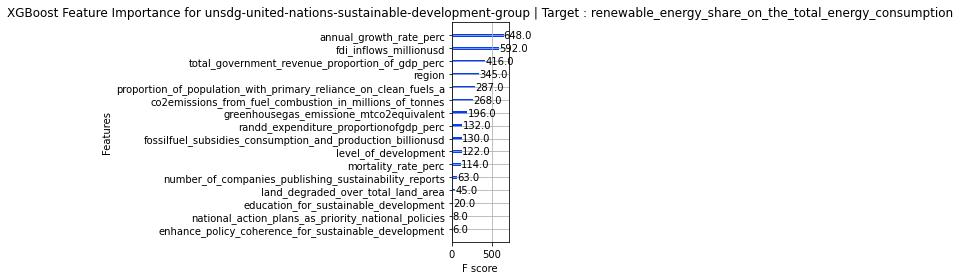

Target Variable: mortality_rate_perc
CATS=====================
['region', 'level_of_development', 'national_action_plans_as_priority_national_policies', 'number_of_companies_publishing_sustainability_reports', 'education_for_sustainable_development', 'enhance_policy_coherence_for_sustainable_development', 'land_degraded_over_total_land_area', 'country_processed']
CONTS=====================
['country', 'greenhousegas_emissione_mtco2equivalent', 'total_government_revenue_proportion_of_gdp_perc', 'fdi_inflows_millionusd', 'annual_growth_rate_perc', 'proportion_of_population_with_primary_reliance_on_clean_fuels_a', 'renewable_energy_share_on_the_total_energy_consumption', 'co2emissions_from_fuel_combustion_in_millions_of_tonnes', 'fossilfuel_subsidies_consumption_and_production_billionusd', 'randd_expenditure_proportionofgdp_perc']
18
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['country', 'greenhousegas_emissione_mtco2equivalent', 'tota

  0%|          | 0/42 [00:00<?, ?it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': -0.1305528154241562, 'Adjusted R-Squared': -0.19810156854698335, 'RMSE': 0.08549929271459512, 'Time taken': 0.07407093048095703}


  5%|▍         | 2/42 [00:00<00:03, 12.43it/s]

{'Model': 'BaggingRegressor', 'R-Squared': -0.02012949291716315, 'Adjusted R-Squared': -0.08108062614177358, 'RMSE': 0.08121658905113854, 'Time taken': 0.08634471893310547}
{'Model': 'BayesianRidge', 'R-Squared': 0.06886215170251497, 'Adjusted R-Squared': 0.013228129319960757, 'RMSE': 0.0775932752645396, 'Time taken': 0.03658008575439453}


 10%|▉         | 4/42 [00:00<00:02, 14.36it/s]

{'Model': 'DecisionTreeRegressor', 'R-Squared': -0.8307491288152196, 'Adjusted R-Squared': -0.9401335107255631, 'RMSE': 0.10880065558160423, 'Time taken': 0.08599638938903809}
{'Model': 'DummyRegressor', 'R-Squared': -8.350495374132016e-05, 'Adjusted R-Squared': -0.05983692191638634, 'RMSE': 0.08041466, 'Time taken': 0.023288249969482422}
{'Model': 'ElasticNet', 'R-Squared': -8.346947218940137e-05, 'Adjusted R-Squared': -0.059836884314867556, 'RMSE': 0.080414657872565, 'Time taken': 0.017141342163085938}


 17%|█▋        | 7/42 [00:00<00:02, 15.97it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.07051639854836622, 'Adjusted R-Squared': 0.01498121481383452, 'RMSE': 0.07752431904513597, 'Time taken': 0.12239336967468262}
{'Model': 'ExtraTreeRegressor', 'R-Squared': -1.2993992473207805, 'Adjusted R-Squared': -1.436784736940576, 'RMSE': 0.12193384998217968, 'Time taken': 0.02925848960876465}


 21%|██▏       | 9/42 [00:00<00:03,  8.66it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': -0.23870795964269487, 'Adjusted R-Squared': -0.3127188125773215, 'RMSE': 0.08949557409467945, 'Time taken': 0.39459776878356934}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution


 26%|██▌       | 11/42 [00:01<00:03,  8.16it/s]

{'Model': 'GaussianProcessRegressor', 'R-Squared': -9566.049686938995, 'Adjusted R-Squared': -10137.665863202647, 'RMSE': 7.865133686862059, 'Time taken': 0.26006531715393066}


 29%|██▊       | 12/42 [00:01<00:04,  6.13it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.13740200349510845, 'Adjusted R-Squared': 0.08586312949009911, 'RMSE': 0.07468292460453066, 'Time taken': 0.33289384841918945}


 33%|███▎      | 14/42 [00:02<00:05,  4.85it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.019035992481733266, 'Adjusted R-Squared': -0.03957506457124493, 'RMSE': 0.07964227012187175, 'Time taken': 0.49340081214904785}
{'Model': 'HuberRegressor', 'R-Squared': -0.1318764930746028, 'Adjusted R-Squared': -0.1995043338557898, 'RMSE': 0.08554933035732393, 'Time taken': 0.11003637313842773}
{'Model': 'KNeighborsRegressor', 'R-Squared': -0.17265933313896276, 'Adjusted R-Squared': -0.24272388449003302, 'RMSE': 0.08707692, 'Time taken': 0.03336143493652344}


 45%|████▌     | 19/42 [00:02<00:02, 10.29it/s]

{'Model': 'KernelRidge', 'R-Squared': -0.150762912118505, 'Adjusted R-Squared': -0.2195191867419377, 'RMSE': 0.08626011294319565, 'Time taken': 0.09436559677124023}
{'Model': 'Lars', 'R-Squared': 0.07069301162110664, 'Adjusted R-Squared': 0.015168380239977686, 'RMSE': 0.07751695341832923, 'Time taken': 0.02154827117919922}
{'Model': 'LarsCV', 'R-Squared': 0.07056242000912383, 'Adjusted R-Squared': 0.015029985984511662, 'RMSE': 0.07752239979310988, 'Time taken': 0.05263161659240723}
{'Model': 'Lasso', 'R-Squared': -8.346947218940137e-05, 'Adjusted R-Squared': -0.059836884314867556, 'RMSE': 0.080414657872565, 'Time taken': 0.028696775436401367}


 55%|█████▍    | 23/42 [00:02<00:01, 11.61it/s]

{'Model': 'LassoCV', 'R-Squared': 0.07055296316861326, 'Adjusted R-Squared': 0.01501996411264983, 'RMSE': 0.07752279417952258, 'Time taken': 0.1284637451171875}
{'Model': 'LassoLars', 'R-Squared': -8.346947218940137e-05, 'Adjusted R-Squared': -0.059836884314867556, 'RMSE': 0.080414657872565, 'Time taken': 0.040204524993896484}
{'Model': 'LassoLarsCV', 'R-Squared': 0.07056242000912383, 'Adjusted R-Squared': 0.015029985984511662, 'RMSE': 0.07752239979310988, 'Time taken': 0.08348274230957031}
{'Model': 'LassoLarsIC', 'R-Squared': 0.07012295110219513, 'Adjusted R-Squared': 0.014564259501382848, 'RMSE': 0.07754072520773901, 'Time taken': 0.04459047317504883}


 60%|█████▉    | 25/42 [00:02<00:01, 10.80it/s]

{'Model': 'LinearRegression', 'R-Squared': 0.07069301162110664, 'Adjusted R-Squared': 0.015168380239977686, 'RMSE': 0.07751695341832923, 'Time taken': 0.028481721878051758}
{'Model': 'LinearSVR', 'R-Squared': -0.13188415124864172, 'Adjusted R-Squared': -0.19951244959368641, 'RMSE': 0.08554961976635247, 'Time taken': 0.18472576141357422}
{'Model': 'MLPRegressor', 'R-Squared': -0.7156653017559609, 'Adjusted R-Squared': -0.8181736059489273, 'RMSE': 0.10532546330242218, 'Time taken': 0.26244211196899414}


 74%|███████▍  | 31/42 [00:03<00:01,  8.86it/s]

{'Model': 'NuSVR', 'R-Squared': -0.12023857275423233, 'Adjusted R-Squared': -0.1871710660948942, 'RMSE': 0.08510838615422021, 'Time taken': 0.5373115539550781}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.031873262129305746, 'Adjusted R-Squared': -0.02597078824661625, 'RMSE': 0.07911943941663975, 'Time taken': 0.02181220054626465}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.06327288181764923, 'Adjusted R-Squared': 0.007304909347634503, 'RMSE': 0.07782580844125095, 'Time taken': 0.04001498222351074}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.5667250606598122, 'Adjusted R-Squared': -0.6603344196300527, 'RMSE': 0.10064993280539715, 'Time taken': 0.02598714828491211}
{'Model': 'PoissonRegressor', 'R-Squared': 0.0046230251246579535, 'Adjusted R-Squared': -0.05484918406600725, 'RMSE': 0.08022521494297294, 'Time taken': 0.024793148040771484}


 76%|███████▌  | 32/42 [00:29<00:37,  3.76s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.17552987229001626, 'Adjusted R-Squared': -0.24576593384193557, 'RMSE': 0.08718342555734805, 'Time taken': 25.81645965576172}


 79%|███████▊  | 33/42 [00:29<00:28,  3.17s/it]

{'Model': 'RANSACRegressor', 'R-Squared': -0.17552986878059418, 'Adjusted R-Squared': -0.245765930122831, 'RMSE': 0.08718342542720953, 'Time taken': 0.254528284072876}


 83%|████████▎ | 35/42 [00:30<00:15,  2.26s/it]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.023362091264265916, 'Adjusted R-Squared': -0.03499048818849815, 'RMSE': 0.07946646294394884, 'Time taken': 0.7260205745697021}
{'Model': 'Ridge', 'R-Squared': 0.07067916413673148, 'Adjusted R-Squared': 0.015153705390183903, 'RMSE': 0.07751753095127369, 'Time taken': 0.01650857925415039}
{'Model': 'RidgeCV', 'R-Squared': 0.07055204684311955, 'Adjusted R-Squared': 0.015018993038148576, 'RMSE': 0.07752283239369312, 'Time taken': 0.036216020584106445}
{'Model': 'SGDRegressor', 'R-Squared': 0.06583311909244427, 'Adjusted R-Squared': 0.010018116774068164, 'RMSE': 0.07771937997017782, 'Time taken': 0.04766368865966797}


 90%|█████████ | 38/42 [00:30<00:05,  1.36s/it]

{'Model': 'SVR', 'R-Squared': -0.625788234791179, 'Adjusted R-Squared': -0.7229265255491426, 'RMSE': 0.10252955733882424, 'Time taken': 0.12740111351013184}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.07069301162110664, 'Adjusted R-Squared': 0.015168380239977686, 'RMSE': 0.07751695341832923, 'Time taken': 0.024071455001831055}
{'Model': 'TweedieRegressor', 'R-Squared': 0.049205613480359456, 'Adjusted R-Squared': -0.007602856154461879, 'RMSE': 0.07840800405529652, 'Time taken': 0.02134990692138672}


100%|██████████| 42/42 [00:31<00:00,  1.32it/s]

{'Model': 'XGBRegressor', 'R-Squared': -0.12810266468402798, 'Adjusted R-Squared': -0.19550502515257073, 'RMSE': 0.085406594, 'Time taken': 0.6587111949920654}
{'Model': 'LGBMRegressor', 'R-Squared': 0.03050314525689246, 'Adjusted R-Squared': -0.02742276744788441, 'RMSE': 0.07917540551495582, 'Time taken': 0.15848064422607422}
Project: unsdg-united-nations-sustainable-development-group
unsdg-united-nations-sustainable-development-group
Target: mortality_rate_perc
mortality_rate_perc
Target Standard Deviation: 0.08323901146650314
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
GradientBoostingRegressor                    0.09       0.14  0.07        0.33
TransformedTargetRegressor                   0.02       0.07  0.08        0.02
LinearRegression                             0.02       0.07  0.08        0.03
Lars                                         0.02       0.07  0.08    

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_18/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0    0.00       0.07
1    0.00       0.05
2    0.24      -0.01
3    0.23       0.08
4    0.00       0.04
XGBoost RMSE:  0.08540657


<Figure size 432x288 with 0 Axes>

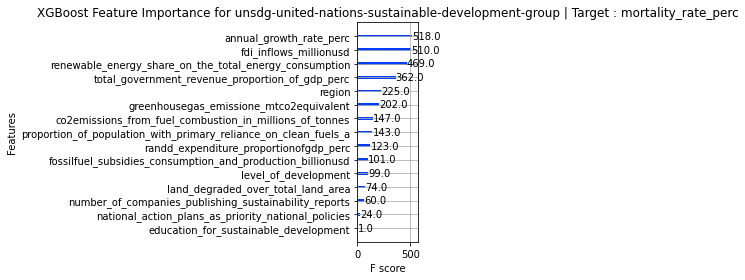

Target Variable: proportion_of_population_with_primary_reliance_on_clean_fuels_a
CATS=====================
['region', 'level_of_development', 'national_action_plans_as_priority_national_policies', 'number_of_companies_publishing_sustainability_reports', 'education_for_sustainable_development', 'enhance_policy_coherence_for_sustainable_development', 'land_degraded_over_total_land_area', 'country_processed']
CONTS=====================
['country', 'greenhousegas_emissione_mtco2equivalent', 'total_government_revenue_proportion_of_gdp_perc', 'fdi_inflows_millionusd', 'annual_growth_rate_perc', 'mortality_rate_perc', 'renewable_energy_share_on_the_total_energy_consumption', 'co2emissions_from_fuel_combustion_in_millions_of_tonnes', 'fossilfuel_subsidies_consumption_and_production_billionusd', 'randd_expenditure_proportionofgdp_perc']
18
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['country', 'greenhousegas_emissione_mtco2equivalent', 'tota

  0%|          | 0/42 [00:00<?, ?it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.6146496166497669, 'Adjusted R-Squared': 0.5916255371414196, 'RMSE': 25.81587111452616, 'Time taken': 0.03282761573791504}


  5%|▍         | 2/42 [00:00<00:02, 18.33it/s]

{'Model': 'BaggingRegressor', 'R-Squared': 0.9049106994283651, 'Adjusted R-Squared': 0.8992292632306889, 'RMSE': 12.824035541668016, 'Time taken': 0.07603859901428223}
{'Model': 'BayesianRidge', 'R-Squared': 0.5446060319557676, 'Adjusted R-Squared': 0.5173969583933764, 'RMSE': 28.064190741435453, 'Time taken': 0.026851177215576172}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.8457029511581089, 'Adjusted R-Squared': 0.8364839450952286, 'RMSE': 16.33569801342443, 'Time taken': 0.06316494941711426}
{'Model': 'DummyRegressor', 'R-Squared': -0.0003027538574711386, 'Adjusted R-Squared': -0.060069270597383095, 'RMSE': 41.59342, 'Time taken': 0.037225961685180664}


 12%|█▏        | 5/42 [00:00<00:01, 21.48it/s]

{'Model': 'ElasticNet', 'R-Squared': 0.4770337044196552, 'Adjusted R-Squared': 0.4457872905327792, 'RMSE': 30.07431446894492, 'Time taken': 0.017423629760742188}


 19%|█▉        | 8/42 [00:00<00:01, 20.32it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.5441082655517808, 'Adjusted R-Squared': 0.516869451229403, 'RMSE': 28.079524273574485, 'Time taken': 0.10749697685241699}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 0.8595610660917337, 'Adjusted R-Squared': 0.8511700606066486, 'RMSE': 15.58485078415886, 'Time taken': 0.021629810333251953}
{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.9467872840536335, 'Adjusted R-Squared': 0.9436079079436305, 'RMSE': 9.593268488677776, 'Time taken': 0.36175966262817383}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution


 26%|██▌       | 11/42 [00:01<00:03,  8.66it/s]

{'Model': 'GaussianProcessRegressor', 'R-Squared': -2323.694992440874, 'Adjusted R-Squared': -2462.591863058411, 'RMSE': 2005.126961000755, 'Time taken': 0.25323486328125}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.8343343279880476, 'Adjusted R-Squared': 0.8244360645659499, 'RMSE': 16.926811185066605, 'Time taken': 0.31957244873046875}


 38%|███▊      | 16/42 [00:01<00:03,  7.01it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.8855732738047462, 'Adjusted R-Squared': 0.8787364568308159, 'RMSE': 14.067684602743274, 'Time taken': 0.48450684547424316}
{'Model': 'HuberRegressor', 'R-Squared': 0.5190470913090782, 'Adjusted R-Squared': 0.4903109112300609, 'RMSE': 28.840990022965645, 'Time taken': 0.0354464054107666}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.8042524596045408, 'Adjusted R-Squared': 0.7925568518450636, 'RMSE': 18.399544, 'Time taken': 0.02940821647644043}
{'Model': 'KernelRidge', 'R-Squared': -0.834598179472446, 'Adjusted R-Squared': -0.9442125361075924, 'RMSE': 56.32865295296282, 'Time taken': 0.09089899063110352}
{'Model': 'Lars', 'R-Squared': 0.5461848034009307, 'Adjusted R-Squared': 0.5190700589500428, 'RMSE': 28.01550167888077, 'Time taken': 0.02251434326171875}


 45%|████▌     | 19/42 [00:02<00:02,  9.49it/s]

{'Model': 'LarsCV', 'R-Squared': 0.5465506504411723, 'Adjusted R-Squared': 0.5194577647757077, 'RMSE': 28.004206932761406, 'Time taken': 0.05109596252441406}
{'Model': 'Lasso', 'R-Squared': 0.5396197334451222, 'Adjusted R-Squared': 0.5121127363868119, 'RMSE': 28.21741571757953, 'Time taken': 0.02768254280090332}
{'Model': 'LassoCV', 'R-Squared': 0.546547982541282, 'Adjusted R-Squared': 0.5194549374729938, 'RMSE': 28.004289314962183, 'Time taken': 0.13580036163330078}


 55%|█████▍    | 23/42 [00:02<00:01, 10.96it/s]

{'Model': 'LassoLars', 'R-Squared': -0.00030274333846680435, 'Adjusted R-Squared': -0.06006925944988484, 'RMSE': 41.59341855784034, 'Time taken': 0.05097389221191406}
{'Model': 'LassoLarsCV', 'R-Squared': 0.5465506504411723, 'Adjusted R-Squared': 0.5194577647757077, 'RMSE': 28.004206932761406, 'Time taken': 0.08045744895935059}
{'Model': 'LassoLarsIC', 'R-Squared': 0.5464968877254801, 'Adjusted R-Squared': 0.5194007898222854, 'RMSE': 28.005867027315194, 'Time taken': 0.030501842498779297}
{'Model': 'LinearRegression', 'R-Squared': 0.5461848034009307, 'Adjusted R-Squared': 0.5190700589500428, 'RMSE': 28.015501678880767, 'Time taken': 0.03598594665527344}
{'Model': 'LinearSVR', 'R-Squared': 0.45323389384229007, 'Adjusted R-Squared': 0.42056547869450234, 'RMSE': 30.75103085139794, 'Time taken': 0.055800437927246094}


 67%|██████▋   | 28/42 [00:04<00:03,  4.10it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.6081191440573376, 'Adjusted R-Squared': 0.5847048790796313, 'RMSE': 26.03370087225505, 'Time taken': 1.882857322692871}
{'Model': 'NuSVR', 'R-Squared': 0.4299992472255644, 'Adjusted R-Squared': 0.39594259847489044, 'RMSE': 31.397610757622502, 'Time taken': 0.16437315940856934}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.413431594437246, 'Adjusted R-Squared': 0.3783850544822386, 'RMSE': 31.850644145566587, 'Time taken': 0.015574455261230469}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.5431352320532885, 'Adjusted R-Squared': 0.5158382805093026, 'RMSE': 28.10947409757012, 'Time taken': 0.03502488136291504}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.41457791119600174, 'Adjusted R-Squared': 0.3795998618649452, 'RMSE': 31.81950644502158, 'Time taken': 0.025578975677490234}
{'Model': 'PoissonRegressor', 'R-Squared': 0.45431163531326124, 'Adjusted R-Squared': 0.4217076135238019, 'RMSE': 30.720708919852107, 'Time taken':

 76%|███████▌  | 32/42 [00:31<00:29,  2.97s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -4.345022883600613e-05, 'Adjusted R-Squared': -0.05979447398464699, 'RMSE': 41.58802739706397, 'Time taken': 26.702963829040527}


 79%|███████▊  | 33/42 [00:31<00:23,  2.62s/it]

{'Model': 'RANSACRegressor', 'R-Squared': 0.1774291525216214, 'Adjusted R-Squared': 0.12828183773517732, 'RMSE': 37.7177296574306, 'Time taken': 0.29172515869140625}


 88%|████████▊ | 37/42 [00:32<00:06,  1.39s/it]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.9121409282368425, 'Adjusted R-Squared': 0.9068914868421883, 'RMSE': 12.326852285888174, 'Time taken': 0.6433258056640625}
{'Model': 'Ridge', 'R-Squared': 0.5461244977557507, 'Adjusted R-Squared': 0.5190061501373835, 'RMSE': 28.017363049756764, 'Time taken': 0.015338659286499023}
{'Model': 'RidgeCV', 'R-Squared': 0.5455630341542148, 'Adjusted R-Squared': 0.5184111399684603, 'RMSE': 28.034687037936806, 'Time taken': 0.03200054168701172}
{'Model': 'SGDRegressor', 'R-Squared': 0.546225855874102, 'Adjusted R-Squared': 0.5191135642439382, 'RMSE': 28.014234498263292, 'Time taken': 0.057999610900878906}


 93%|█████████▎| 39/42 [00:32<00:03,  1.03s/it]

{'Model': 'SVR', 'R-Squared': 0.5398988474092596, 'Adjusted R-Squared': 0.512408526971448, 'RMSE': 28.208860758324978, 'Time taken': 0.18450713157653809}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.5461848034009307, 'Adjusted R-Squared': 0.5190700589500428, 'RMSE': 28.015501678880767, 'Time taken': 0.016702890396118164}
{'Model': 'TweedieRegressor', 'R-Squared': 0.433161315973819, 'Adjusted R-Squared': 0.3992935958590471, 'RMSE': 31.3104008048704, 'Time taken': 0.021209239959716797}


100%|██████████| 42/42 [00:33<00:00,  1.26it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.8961711614100544, 'Adjusted R-Squared': 0.889967551557196, 'RMSE': 13.400404, 'Time taken': 0.6527369022369385}
{'Model': 'LGBMRegressor', 'R-Squared': 0.8952587446779396, 'Adjusted R-Squared': 0.8890006193599549, 'RMSE': 13.459154354838336, 'Time taken': 0.14917659759521484}
Project: unsdg-united-nations-sustainable-development-group
unsdg-united-nations-sustainable-development-group
Target: proportion_of_population_with_primary_reliance_on_clean_fuels_a
proportion_of_population_with_primary_reliance_on_clean_fuels_a
Target Standard Deviation: 41.06061553955078
                               Adjusted R-Squared  R-Squared    RMSE  \
Model                                                                  
ExtraTreesRegressor                          0.94       0.95    9.59   
RandomForestRegressor                        0.91       0.91   12.33   
BaggingRegressor                             0.90       0.90   12.82   
XGBRegressor                  

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_18/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0   15.00      14.98
1   95.00      94.12
2   95.00      95.64
3   93.00      86.39
4    5.00      -4.25
XGBoost RMSE:  13.422064


<Figure size 432x288 with 0 Axes>

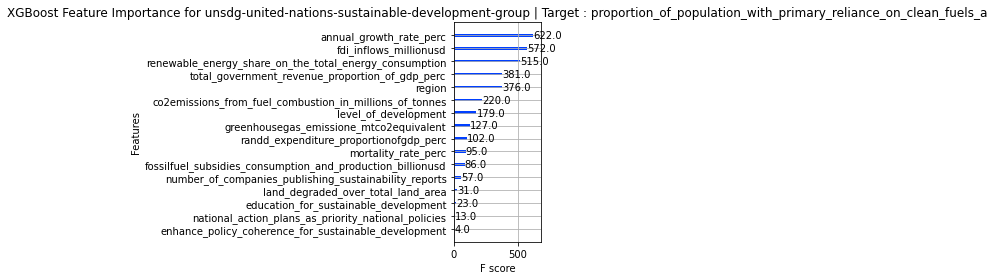

Target Variable: annual_growth_rate_perc
CATS=====================
['region', 'level_of_development', 'national_action_plans_as_priority_national_policies', 'number_of_companies_publishing_sustainability_reports', 'education_for_sustainable_development', 'enhance_policy_coherence_for_sustainable_development', 'land_degraded_over_total_land_area', 'country_processed']
CONTS=====================
['country', 'greenhousegas_emissione_mtco2equivalent', 'total_government_revenue_proportion_of_gdp_perc', 'fdi_inflows_millionusd', 'proportion_of_population_with_primary_reliance_on_clean_fuels_a', 'mortality_rate_perc', 'renewable_energy_share_on_the_total_energy_consumption', 'co2emissions_from_fuel_combustion_in_millions_of_tonnes', 'fossilfuel_subsidies_consumption_and_production_billionusd', 'randd_expenditure_proportionofgdp_perc']
18
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['country', 'greenhousegas_emissione_mtco2equivalent', 'tota

  7%|▋         | 3/42 [00:00<00:03, 12.30it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': -0.5113326489859742, 'Adjusted R-Squared': -0.6016323984536898, 'RMSE': 0.05164460059378324, 'Time taken': 0.14571237564086914}
{'Model': 'BaggingRegressor', 'R-Squared': -0.06081528068463049, 'Adjusted R-Squared': -0.12419732575698283, 'RMSE': 0.04326779609044043, 'Time taken': 0.09447932243347168}
{'Model': 'BayesianRidge', 'R-Squared': 0.057043992591350956, 'Adjusted R-Squared': 0.0007038537839159087, 'RMSE': 0.040793466013221875, 'Time taken': 0.021388769149780273}
{'Model': 'DecisionTreeRegressor', 'R-Squared': -0.6780467844780598, 'Adjusted R-Squared': -0.7783074414122837, 'RMSE': 0.05441854469043264, 'Time taken': 0.03360390663146973}
{'Model': 'DummyRegressor', 'R-Squared': -0.006923696298139159, 'Adjusted R-Squared': -0.0670858039385942, 'RMSE': 0.042154424, 'Time taken': 0.01659417152404785}
{'Model': 'ElasticNet', 'R-Squared': -0.0069236829961902835, 'Adjusted R-Squared': -0.06708578984187463, 'RMSE': 0.04215442489369885, 'Time tak

 17%|█▋        | 7/42 [00:00<00:02, 17.37it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.052588727282930625, 'Adjusted R-Squared': -0.004017606621548486, 'RMSE': 0.04088972264702707, 'Time taken': 0.11549973487854004}
{'Model': 'ExtraTreeRegressor', 'R-Squared': -0.6094409814671982, 'Adjusted R-Squared': -0.7056025495422824, 'RMSE': 0.053294503261445345, 'Time taken': 0.03158736228942871}


 21%|██▏       | 9/42 [00:00<00:04,  7.92it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.14049175217522003, 'Adjusted R-Squared': 0.08913748579575198, 'RMSE': 0.03894663272550613, 'Time taken': 0.5022099018096924}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution


 26%|██▌       | 11/42 [00:01<00:03,  7.80it/s]

{'Model': 'GaussianProcessRegressor', 'R-Squared': -80696.5983686429, 'Adjusted R-Squared': -85518.15298815302, 'RMSE': 11.933702193953618, 'Time taken': 0.2542245388031006}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.13315867016687766, 'Adjusted R-Squared': 0.08136626366741428, 'RMSE': 0.03911242070663043, 'Time taken': 0.3182804584503174}


 38%|███▊      | 16/42 [00:02<00:04,  6.18it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.03204078790154463, 'Adjusted R-Squared': -0.025793253072891487, 'RMSE': 0.04133076268969501, 'Time taken': 0.5815753936767578}
{'Model': 'HuberRegressor', 'R-Squared': 0.055226666183889495, 'Adjusted R-Squared': -0.0012220550189598889, 'RMSE': 0.040832757007372336, 'Time taken': 0.03435254096984863}
{'Model': 'KNeighborsRegressor', 'R-Squared': -0.0822884194319975, 'Adjusted R-Squared': -0.14695345078170807, 'RMSE': 0.043703515, 'Time taken': 0.030055761337280273}
{'Model': 'KernelRidge', 'R-Squared': -0.11592620025257694, 'Adjusted R-Squared': -0.18260103611672474, 'RMSE': 0.044377479084254684, 'Time taken': 0.11930561065673828}


 45%|████▌     | 19/42 [00:02<00:02,  8.48it/s]

{'Model': 'Lars', 'R-Squared': 0.04892699112783161, 'Adjusted R-Squared': -0.00789812575446791, 'RMSE': 0.04096866564953273, 'Time taken': 0.027439117431640625}
{'Model': 'LarsCV', 'R-Squared': 0.04892699112783161, 'Adjusted R-Squared': -0.00789812575446791, 'RMSE': 0.04096866564953273, 'Time taken': 0.056482553482055664}
{'Model': 'Lasso', 'R-Squared': -0.0069236829961902835, 'Adjusted R-Squared': -0.06708578984187463, 'RMSE': 0.04215442489369885, 'Time taken': 0.03462648391723633}


 55%|█████▍    | 23/42 [00:02<00:01, 10.30it/s]

{'Model': 'LassoCV', 'R-Squared': 0.05234923059273289, 'Adjusted R-Squared': -0.004271412862418389, 'RMSE': 0.040894890589770395, 'Time taken': 0.1701035499572754}
{'Model': 'LassoLars', 'R-Squared': -0.0069236829961902835, 'Adjusted R-Squared': -0.06708578984187463, 'RMSE': 0.04215442489369885, 'Time taken': 0.021770000457763672}
{'Model': 'LassoLarsCV', 'R-Squared': 0.04892699112783161, 'Adjusted R-Squared': -0.00789812575446791, 'RMSE': 0.04096866564953273, 'Time taken': 0.0559239387512207}
{'Model': 'LassoLarsIC', 'R-Squared': 0.04892699112783161, 'Adjusted R-Squared': -0.00789812575446791, 'RMSE': 0.04096866564953273, 'Time taken': 0.04851818084716797}
{'Model': 'LinearRegression', 'R-Squared': 0.04892699112783183, 'Adjusted R-Squared': -0.007898125754467689, 'RMSE': 0.04096866564953272, 'Time taken': 0.04618692398071289}


 60%|█████▉    | 25/42 [00:03<00:01,  9.71it/s]

{'Model': 'LinearSVR', 'R-Squared': 0.033466347918041595, 'Adjusted R-Squared': -0.02428251808685533, 'RMSE': 0.04130031657616969, 'Time taken': 0.1826333999633789}
{'Model': 'MLPRegressor', 'R-Squared': -3.9059324273233136, 'Adjusted R-Squared': -4.19905417612565, 'RMSE': 0.093047706297696, 'Time taken': 0.2881488800048828}


 74%|███████▍  | 31/42 [00:03<00:01,  9.86it/s]

{'Model': 'NuSVR', 'R-Squared': 0.015893651848655654, 'Adjusted R-Squared': -0.04290515511636195, 'RMSE': 0.041674069099762664, 'Time taken': 0.335956335067749}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': -0.01264385318281902, 'Adjusted R-Squared': -0.0731477312031763, 'RMSE': 0.042273991551062644, 'Time taken': 0.02309703826904297}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.0564025224760446, 'Adjusted R-Squared': 2.4056837820807253e-05, 'RMSE': 0.04080733905731225, 'Time taken': 0.038652658462524414}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.9819588267734856, 'Adjusted R-Squared': -1.100377750385738, 'RMSE': 0.05914148224872364, 'Time taken': 0.025887727737426758}
PoissonRegressor model failed to execute
Some value(s) of y are out of the valid range for family PoissonDistribution


 76%|███████▌  | 32/42 [41:33<57:14, 343.50s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -2.598100059779367e+105, 'Adjusted R-Squared': -2.7533324532881973e+105, 'RMSE': 2.1412768774036683e+51, 'Time taken': 2490.1795020103455}


 79%|███████▊  | 33/42 [41:34<43:03, 287.01s/it]

{'Model': 'RANSACRegressor', 'R-Squared': -202.1581924856869, 'Adjusted R-Squared': -214.29657505558646, 'RMSE': 0.5987727961405559, 'Time taken': 0.29933857917785645}


 90%|█████████ | 38/42 [41:35<07:43, 115.93s/it]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.10283895930529674, 'Adjusted R-Squared': 0.04923499775435525, 'RMSE': 0.0397905638981364, 'Time taken': 0.8486433029174805}
{'Model': 'Ridge', 'R-Squared': 0.049016382759177746, 'Adjusted R-Squared': -0.0078033931137015955, 'RMSE': 0.040966740275833496, 'Time taken': 0.014290571212768555}
{'Model': 'RidgeCV', 'R-Squared': 0.049790770506024096, 'Adjusted R-Squared': -0.00698273691657203, 'RMSE': 0.04095005723208255, 'Time taken': 0.039991140365600586}
{'Model': 'SGDRegressor', 'R-Squared': 0.04200267979495953, 'Adjusted R-Squared': -0.015236153802197006, 'RMSE': 0.04111753189312927, 'Time taken': 0.02293109893798828}
{'Model': 'SVR', 'R-Squared': -0.6184894469444855, 'Adjusted R-Squared': -0.7151916466046908, 'RMSE': 0.053444107249362174, 'Time taken': 0.05028033256530762}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.04892699112783183, 'Adjusted R-Squared': -0.007898125754467689, 'RMSE': 0.04096866564953272, 'Time taken': 0.041

100%|██████████| 42/42 [41:36<00:00, 59.43s/it]

{'Model': 'XGBRegressor', 'R-Squared': 0.03783827789095673, 'Adjusted R-Squared': -0.019649372172162227, 'RMSE': 0.041206803, 'Time taken': 0.6394932270050049}
{'Model': 'LGBMRegressor', 'R-Squared': 0.07786514619359952, 'Adjusted R-Squared': 0.02276903857623591, 'RMSE': 0.04034057734957454, 'Time taken': 0.1460115909576416}
Project: unsdg-united-nations-sustainable-development-group
unsdg-united-nations-sustainable-development-group
Target: annual_growth_rate_perc
annual_growth_rate_perc
Target Standard Deviation: 0.05607805773615837
                                                                                                                          Adjusted R-Squared  \
Model                                                                                                                                          
ExtraTreesRegressor                                                                                                                     0.09   
GradientBoostingRegressor  

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_18/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0   -0.00       0.01
1    0.13       0.04
2    0.02       0.04
3    0.00      -0.09
4   -0.01      -0.03
XGBoost RMSE:  0.041206248


<Figure size 432x288 with 0 Axes>

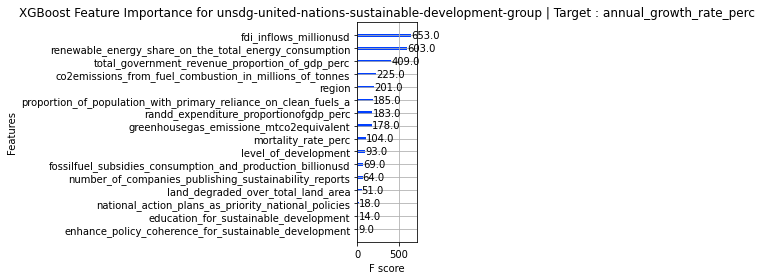

Target Variable: fdi_inflows_millionusd
CATS=====================
['region', 'level_of_development', 'national_action_plans_as_priority_national_policies', 'number_of_companies_publishing_sustainability_reports', 'education_for_sustainable_development', 'enhance_policy_coherence_for_sustainable_development', 'land_degraded_over_total_land_area', 'country_processed']
CONTS=====================
['country', 'greenhousegas_emissione_mtco2equivalent', 'total_government_revenue_proportion_of_gdp_perc', 'annual_growth_rate_perc', 'proportion_of_population_with_primary_reliance_on_clean_fuels_a', 'mortality_rate_perc', 'renewable_energy_share_on_the_total_energy_consumption', 'co2emissions_from_fuel_combustion_in_millions_of_tonnes', 'fossilfuel_subsidies_consumption_and_production_billionusd', 'randd_expenditure_proportionofgdp_perc']
18
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['country', 'greenhousegas_emissione_mtco2equivalent', 'tota

  0%|          | 0/42 [00:00<?, ?it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.4942443461226028, 'Adjusted R-Squared': 0.4640262410167205, 'RMSE': 13392.381145638514, 'Time taken': 0.06955647468566895}


  5%|▍         | 2/42 [00:00<00:03, 11.93it/s]

{'Model': 'BaggingRegressor', 'R-Squared': 0.6662475359456181, 'Adjusted R-Squared': 0.646306350986394, 'RMSE': 10879.267815122115, 'Time taken': 0.09780550003051758}
{'Model': 'BayesianRidge', 'R-Squared': 0.45888146540256136, 'Adjusted R-Squared': 0.4265504837756703, 'RMSE': 13852.674591032828, 'Time taken': 0.038170576095581055}


 10%|▉         | 4/42 [00:00<00:02, 13.92it/s]

{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.5866875400092222, 'Adjusted R-Squared': 0.5619927703871317, 'RMSE': 12106.724968881672, 'Time taken': 0.0814213752746582}
{'Model': 'DummyRegressor', 'R-Squared': -0.00017911396298386784, 'Adjusted R-Squared': -0.05993824341360243, 'RMSE': 18833.295, 'Time taken': 0.020256757736206055}
{'Model': 'ElasticNet', 'R-Squared': 0.47990564060108853, 'Adjusted R-Squared': 0.4488308203854302, 'RMSE': 13580.89837476667, 'Time taken': 0.01670551300048828}


 17%|█▋        | 7/42 [00:00<00:02, 14.25it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.15774099046951162, 'Adjusted R-Squared': 0.1074173389566836, 'RMSE': 17282.647026570892, 'Time taken': 0.16373801231384277}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 0.4608371498252988, 'Adjusted R-Squared': 0.4286230172676908, 'RMSE': 13827.619098869702, 'Time taken': 0.02651357650756836}


 21%|██▏       | 9/42 [00:01<00:04,  6.75it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.6512977545135268, 'Adjusted R-Squared': 0.6304633436196809, 'RMSE': 11120.256366251824, 'Time taken': 0.5613799095153809}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution


 26%|██▌       | 11/42 [00:01<00:04,  7.05it/s]

{'Model': 'GaussianProcessRegressor', 'R-Squared': -528410.5453732889, 'Adjusted R-Squared': -559982.3043735798, 'RMSE': 13689058.409470147, 'Time taken': 0.247910737991333}


 29%|██▊       | 12/42 [00:01<00:05,  5.75it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.6303574011905555, 'Adjusted R-Squared': 0.6082718371107458, 'RMSE': 11449.286816259315, 'Time taken': 0.30645084381103516}


 36%|███▌      | 15/42 [00:02<00:04,  5.89it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.5876124484031728, 'Adjusted R-Squared': 0.5629729406033623, 'RMSE': 12093.17120007557, 'Time taken': 0.48403215408325195}
{'Model': 'HuberRegressor', 'R-Squared': 0.41414913081840155, 'Adjusted R-Squared': 0.3791454625339664, 'RMSE': 14413.882148950097, 'Time taken': 0.07410073280334473}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.577877705985704, 'Adjusted R-Squared': 0.5526565626326485, 'RMSE': 12235.073, 'Time taken': 0.032874107360839844}


 43%|████▎     | 18/42 [00:02<00:02,  8.19it/s]

{'Model': 'KernelRidge', 'R-Squared': 0.30283082952931506, 'Adjusted R-Squared': 0.2611760677716326, 'RMSE': 15723.76391679673, 'Time taken': 0.14484953880310059}
{'Model': 'Lars', 'R-Squared': 0.4530197627429171, 'Adjusted R-Squared': 0.42033855359862593, 'RMSE': 13927.502503546237, 'Time taken': 0.04146909713745117}
{'Model': 'LarsCV', 'R-Squared': 0.46208770940175714, 'Adjusted R-Squared': 0.4299482958125539, 'RMSE': 13811.573575477236, 'Time taken': 0.0586855411529541}
{'Model': 'Lasso', 'R-Squared': 0.45312454617170483, 'Adjusted R-Squared': 0.4204495976725299, 'RMSE': 13926.168413879046, 'Time taken': 0.019590377807617188}


 52%|█████▏    | 22/42 [00:02<00:01, 11.26it/s]

{'Model': 'LassoCV', 'R-Squared': 0.46227369846595256, 'Adjusted R-Squared': 0.4301453974308994, 'RMSE': 13809.185617648895, 'Time taken': 0.10457658767700195}
{'Model': 'LassoLars', 'R-Squared': 0.45686008050008153, 'Adjusted R-Squared': 0.42440832430354547, 'RMSE': 13878.524274385229, 'Time taken': 0.024601221084594727}
{'Model': 'LassoLarsCV', 'R-Squared': 0.46208770940175714, 'Adjusted R-Squared': 0.4299482958125539, 'RMSE': 13811.573575477236, 'Time taken': 0.09613037109375}
{'Model': 'LassoLarsIC', 'R-Squared': 0.46241271895063185, 'Adjusted R-Squared': 0.43029272417095255, 'RMSE': 13807.40043086437, 'Time taken': 0.04503154754638672}


 60%|█████▉    | 25/42 [00:02<00:01, 14.03it/s]

{'Model': 'LinearRegression', 'R-Squared': 0.45301976274291833, 'Adjusted R-Squared': 0.42033855359862726, 'RMSE': 13927.50250354622, 'Time taken': 0.04507279396057129}
{'Model': 'LinearSVR', 'R-Squared': -0.05672248206607744, 'Adjusted R-Squared': -0.11985998885618909, 'RMSE': 19358.33054449914, 'Time taken': 0.044027090072631836}


 64%|██████▍   | 27/42 [00:04<00:04,  3.14it/s]

{'Model': 'MLPRegressor', 'R-Squared': -0.0003188071504840462, 'Adjusted R-Squared': -0.06008628304941244, 'RMSE': 18834.6105520992, 'Time taken': 1.7039856910705566}
{'Model': 'NuSVR', 'R-Squared': -0.07191489856479505, 'Adjusted R-Squared': -0.13596012835325766, 'RMSE': 19496.990549301347, 'Time taken': 0.17214703559875488}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.42447992034244264, 'Adjusted R-Squared': 0.3900935004886892, 'RMSE': 14286.230990686545, 'Time taken': 0.015154361724853516}


 74%|███████▍  | 31/42 [00:04<00:02,  5.31it/s]

{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.4410427170439679, 'Adjusted R-Squared': 0.4076458982509974, 'RMSE': 14079.15976430517, 'Time taken': 0.03226208686828613}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.4123654528914008, 'Adjusted R-Squared': 0.37725521265535233, 'RMSE': 14435.807681197173, 'Time taken': 0.04951834678649902}
PoissonRegressor model failed to execute
Some value(s) of y are out of the valid range for family PoissonDistribution


 76%|███████▌  | 32/42 [01:05<01:24,  8.47s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.09728709582188744, 'Adjusted R-Squared': -0.1628482745030695, 'RMSE': 19726.387657426763, 'Time taken': 60.22990107536316}


 79%|███████▊  | 33/42 [01:05<01:04,  7.12s/it]

{'Model': 'RANSACRegressor', 'R-Squared': -57.854485517086474, 'Adjusted R-Squared': -61.370948488233154, 'RMSE': 144469.84650716797, 'Time taken': 0.23521113395690918}


 83%|████████▎ | 35/42 [01:06<00:34,  4.99s/it]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.6438034961738918, 'Adjusted R-Squared': 0.6225213151276777, 'RMSE': 11239.11859136503, 'Time taken': 0.8835330009460449}
{'Model': 'Ridge', 'R-Squared': 0.45330494205818894, 'Adjusted R-Squared': 0.42064077192959015, 'RMSE': 13923.871336283475, 'Time taken': 0.017043113708496094}
{'Model': 'RidgeCV', 'R-Squared': 0.4557724988950663, 'Adjusted R-Squared': 0.4232557614076645, 'RMSE': 13892.412481329355, 'Time taken': 0.045590877532958984}
{'Model': 'SGDRegressor', 'R-Squared': 0.45608399275540124, 'Adjusted R-Squared': 0.4235858665363843, 'RMSE': 13888.436184129096, 'Time taken': 0.04749035835266113}


 90%|█████████ | 38/42 [01:06<00:11,  3.00s/it]

{'Model': 'SVR', 'R-Squared': -0.0950133041051151, 'Adjusted R-Squared': -0.16043862730636427, 'RMSE': 19705.93860743577, 'Time taken': 0.20233416557312012}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.45301976274291833, 'Adjusted R-Squared': 0.42033855359862726, 'RMSE': 13927.50250354622, 'Time taken': 0.0188596248626709}
{'Model': 'TweedieRegressor', 'R-Squared': 0.44826363359069954, 'Adjusted R-Squared': 0.4152982532077538, 'RMSE': 13987.92299348058, 'Time taken': 0.031879425048828125}


100%|██████████| 42/42 [01:07<00:00,  1.61s/it]

{'Model': 'XGBRegressor', 'R-Squared': 0.658307469700772, 'Adjusted R-Squared': 0.6378918782677993, 'RMSE': 11007.918, 'Time taken': 0.7462680339813232}
{'Model': 'LGBMRegressor', 'R-Squared': 0.5937286819488267, 'Adjusted R-Squared': 0.5694546094866496, 'RMSE': 12003.157620110489, 'Time taken': 0.14961934089660645}
Project: unsdg-united-nations-sustainable-development-group
unsdg-united-nations-sustainable-development-group
Target: fdi_inflows_millionusd
fdi_inflows_millionusd
Target Standard Deviation: 18549.421875
                               Adjusted R-Squared  R-Squared        RMSE  \
Model                                                                      
BaggingRegressor                             0.65       0.67    10879.27   
XGBRegressor                                 0.64       0.66    11007.92   
ExtraTreesRegressor                          0.63       0.65    11120.26   
RandomForestRegressor                        0.62       0.64    11239.12   
GradientBoostingRegre

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_18/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0 1942.39     814.05
1    0.00   -1479.28
2    0.00     383.15
3   25.54    2149.27
4  133.06     448.03
XGBoost RMSE:  10755.594


<Figure size 432x288 with 0 Axes>

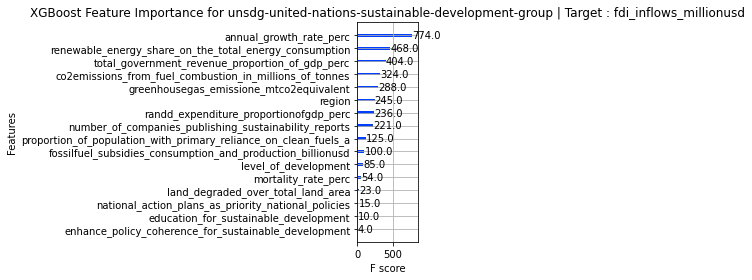

Target Variable: total_government_revenue_proportion_of_gdp_perc
CATS=====================
['region', 'level_of_development', 'national_action_plans_as_priority_national_policies', 'number_of_companies_publishing_sustainability_reports', 'education_for_sustainable_development', 'enhance_policy_coherence_for_sustainable_development', 'land_degraded_over_total_land_area', 'country_processed']
CONTS=====================
['country', 'greenhousegas_emissione_mtco2equivalent', 'fdi_inflows_millionusd', 'annual_growth_rate_perc', 'proportion_of_population_with_primary_reliance_on_clean_fuels_a', 'mortality_rate_perc', 'renewable_energy_share_on_the_total_energy_consumption', 'co2emissions_from_fuel_combustion_in_millions_of_tonnes', 'fossilfuel_subsidies_consumption_and_production_billionusd', 'randd_expenditure_proportionofgdp_perc']
18
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['country', 'greenhousegas_emissione_mtco2equivalent', 'fdi_

  0%|          | 0/42 [00:00<?, ?it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.558654320489784, 'Adjusted R-Squared': 0.5322846100787962, 'RMSE': 0.1237720792153988, 'Time taken': 0.07428717613220215}


 10%|▉         | 4/42 [00:00<00:02, 16.06it/s]

{'Model': 'BaggingRegressor', 'R-Squared': 0.7181554480892767, 'Adjusted R-Squared': 0.7013156792644222, 'RMSE': 0.09890951424450117, 'Time taken': 0.08010435104370117}
{'Model': 'BayesianRidge', 'R-Squared': 0.44324797134505567, 'Adjusted R-Squared': 0.4099829130291942, 'RMSE': 0.13901579604630418, 'Time taken': 0.0387418270111084}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.57955701399964, 'Adjusted R-Squared': 0.5544362066599958, 'RMSE': 0.1208055265891373, 'Time taken': 0.06352090835571289}
{'Model': 'DummyRegressor', 'R-Squared': -0.005761136754068419, 'Adjusted R-Squared': -0.06585378328968905, 'RMSE': 0.18684465, 'Time taken': 0.034700632095336914}
{'Model': 'ElasticNet', 'R-Squared': -0.005761158246847753, 'Adjusted R-Squared': -0.06585380606662805, 'RMSE': 0.18684465411798115, 'Time taken': 0.020880460739135742}


 17%|█▋        | 7/42 [00:00<00:02, 14.75it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.44316540507989743, 'Adjusted R-Squared': 0.40989541355951387, 'RMSE': 0.13902610367786297, 'Time taken': 0.1558854579925537}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 0.7484260754408111, 'Adjusted R-Squared': 0.7333949290048847, 'RMSE': 0.09344714971985926, 'Time taken': 0.024820327758789062}


 21%|██▏       | 9/42 [00:00<00:04,  8.25it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.8452216566469091, 'Adjusted R-Squared': 0.8359738939937369, 'RMSE': 0.07329736188803714, 'Time taken': 0.41444826126098633}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution


 26%|██▌       | 11/42 [00:01<00:03,  8.05it/s]

{'Model': 'GaussianProcessRegressor', 'R-Squared': -12153.656862036847, 'Adjusted R-Squared': -12879.878498447855, 'RMSE': 20.540196701150382, 'Time taken': 0.2485344409942627}


 29%|██▊       | 12/42 [00:01<00:04,  6.15it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.7125067253492393, 'Adjusted R-Squared': 0.695329454222307, 'RMSE': 0.09989576836808108, 'Time taken': 0.32363438606262207}


 31%|███       | 13/42 [00:02<00:07,  4.13it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.7608360333490352, 'Adjusted R-Squared': 0.7465463623856128, 'RMSE': 0.0911131624328915, 'Time taken': 0.5323572158813477}
{'Model': 'HuberRegressor', 'R-Squared': 0.43494351898360295, 'Adjusted R-Squared': 0.4011822826964597, 'RMSE': 0.14004873072229912, 'Time taken': 0.03698444366455078}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.648378911025146, 'Adjusted R-Squared': 0.6273701038222459, 'RMSE': 0.1104767, 'Time taken': 0.03405117988586426}


 43%|████▎     | 18/42 [00:02<00:03,  7.83it/s]

{'Model': 'KernelRidge', 'R-Squared': -0.6102663807019881, 'Adjusted R-Squared': -0.7064772650835536, 'RMSE': 0.2364188550460691, 'Time taken': 0.13738703727722168}
{'Model': 'Lars', 'R-Squared': 0.4424415290142847, 'Adjusted R-Squared': 0.40912828703715065, 'RMSE': 0.139116440183773, 'Time taken': 0.04353213310241699}
{'Model': 'LarsCV', 'R-Squared': 0.4431362884600253, 'Adjusted R-Squared': 0.40986455726738524, 'RMSE': 0.13902973843523508, 'Time taken': 0.06764745712280273}
{'Model': 'Lasso', 'R-Squared': -0.005761158246847753, 'Adjusted R-Squared': -0.06585380606662805, 'RMSE': 0.18684465411798115, 'Time taken': 0.029454708099365234}


 52%|█████▏    | 22/42 [00:02<00:02,  9.75it/s]

{'Model': 'LassoCV', 'R-Squared': 0.44314268054467676, 'Adjusted R-Squared': 0.4098713312690442, 'RMSE': 0.13902894049097245, 'Time taken': 0.16984152793884277}
{'Model': 'LassoLars', 'R-Squared': -0.005761158246847753, 'Adjusted R-Squared': -0.06585380606662805, 'RMSE': 0.18684465411798115, 'Time taken': 0.032332658767700195}
{'Model': 'LassoLarsCV', 'R-Squared': 0.4431362884600253, 'Adjusted R-Squared': 0.40986455726738524, 'RMSE': 0.13902973843523508, 'Time taken': 0.08689498901367188}
{'Model': 'LassoLarsIC', 'R-Squared': 0.4431137060892204, 'Adjusted R-Squared': 0.40984062563543167, 'RMSE': 0.13903255742775672, 'Time taken': 0.03162837028503418}
{'Model': 'LinearRegression', 'R-Squared': 0.4424415290142847, 'Adjusted R-Squared': 0.40912828703715065, 'RMSE': 0.139116440183773, 'Time taken': 0.04268956184387207}


 60%|█████▉    | 25/42 [00:02<00:01, 10.73it/s]

{'Model': 'LinearSVR', 'R-Squared': 0.40843574119183224, 'Adjusted R-Squared': 0.3730907068605266, 'RMSE': 0.14329604709551919, 'Time taken': 0.16071248054504395}
{'Model': 'MLPRegressor', 'R-Squared': 0.4384611196726147, 'Adjusted R-Squared': 0.4049100544958212, 'RMSE': 0.1396121331297941, 'Time taken': 0.37995338439941406}


 64%|██████▍   | 27/42 [00:03<00:02,  6.51it/s]

{'Model': 'NuSVR', 'R-Squared': 0.5442630222591274, 'Adjusted R-Squared': 0.5170334544066852, 'RMSE': 0.12577385745622802, 'Time taken': 0.24533677101135254}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.29762813088746154, 'Adjusted R-Squared': 0.2556625160662721, 'RMSE': 0.1561409442735533, 'Time taken': 0.018285274505615234}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.42928665896855045, 'Adjusted R-Squared': 0.39518743418994173, 'RMSE': 0.1407480087220963, 'Time taken': 0.029284954071044922}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.23324478526239756, 'Adjusted R-Squared': -0.30692922211769824, 'RMSE': 0.2068987613828767, 'Time taken': 0.021248340606689453}
{'Model': 'PoissonRegressor', 'R-Squared': 0.2146455205836164, 'Adjusted R-Squared': 0.1677218252725745, 'RMSE': 0.16510723689236212, 'Time taken': 0.022197246551513672}


 76%|███████▌  | 32/42 [00:38<00:34,  3.50s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.017515440192093834, 'Adjusted R-Squared': -0.07831038787652722, 'RMSE': 0.18793330481708762, 'Time taken': 34.46915245056152}


 79%|███████▊  | 33/42 [00:38<00:27,  3.09s/it]

{'Model': 'RANSACRegressor', 'R-Squared': -20.22177843258638, 'Adjusted R-Squared': -21.489746326357267, 'RMSE': 0.8582703999691172, 'Time taken': 0.2110605239868164}


 90%|█████████ | 38/42 [00:39<00:05,  1.49s/it]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.7485070390215453, 'Adjusted R-Squared': 0.7334807300322665, 'RMSE': 0.0934321115463181, 'Time taken': 0.6916460990905762}
{'Model': 'Ridge', 'R-Squared': 0.4424773410626063, 'Adjusted R-Squared': 0.40916623879905123, 'RMSE': 0.13911197237910375, 'Time taken': 0.013253450393676758}
{'Model': 'RidgeCV', 'R-Squared': 0.4427717055686339, 'Adjusted R-Squared': 0.40947819112147676, 'RMSE': 0.13907524290002646, 'Time taken': 0.03625369071960449}
{'Model': 'SGDRegressor', 'R-Squared': 0.44026625357997595, 'Adjusted R-Squared': 0.4068230423158864, 'RMSE': 0.13938755254739604, 'Time taken': 0.020950794219970703}
{'Model': 'SVR', 'R-Squared': 0.5257168329897326, 'Adjusted R-Squared': 0.49737915948911904, 'RMSE': 0.12830751754498937, 'Time taken': 0.12803030014038086}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.4424415290142847, 'Adjusted R-Squared': 0.40912828703715065, 'RMSE': 0.139116440183773, 'Time taken': 0.017418384552001953}
{'Mo

100%|██████████| 42/42 [00:40<00:00,  1.05it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.7742812268975562, 'Adjusted R-Squared': 0.7607948851084164, 'RMSE': 0.08851504, 'Time taken': 0.6262853145599365}
{'Model': 'LGBMRegressor', 'R-Squared': 0.754689557072792, 'Adjusted R-Squared': 0.7400326438161349, 'RMSE': 0.09227653220698663, 'Time taken': 0.14099359512329102}
Project: unsdg-united-nations-sustainable-development-group
unsdg-united-nations-sustainable-development-group
Target: total_government_revenue_proportion_of_gdp_perc
total_government_revenue_proportion_of_gdp_perc
Target Standard Deviation: 0.17259655892848969
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
ExtraTreesRegressor                          0.84       0.85  0.07        0.41
XGBRegressor                                 0.76       0.77  0.09        0.63
HistGradientBoostingRegressor                0.75       0.76  0.09        0.53
LGBMRegressor          

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_18/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0    0.00       0.33
1    0.00      -0.01
2    0.18       0.15
3    0.00      -0.02
4    0.12       0.11
XGBoost RMSE:  0.088493526


<Figure size 432x288 with 0 Axes>

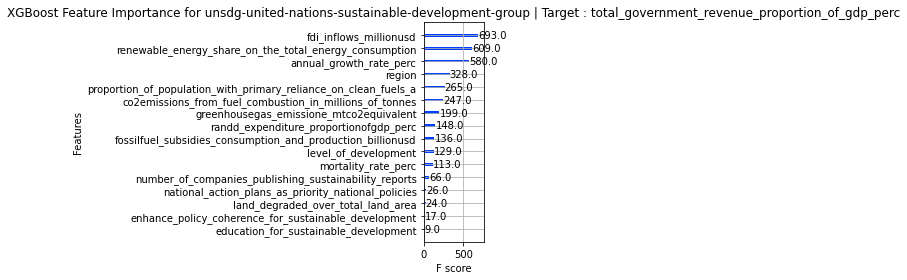

Target Variable: greenhousegas_emissione_mtco2equivalent
CATS=====================
['region', 'level_of_development', 'national_action_plans_as_priority_national_policies', 'number_of_companies_publishing_sustainability_reports', 'education_for_sustainable_development', 'enhance_policy_coherence_for_sustainable_development', 'land_degraded_over_total_land_area', 'country_processed']
CONTS=====================
['country', 'total_government_revenue_proportion_of_gdp_perc', 'fdi_inflows_millionusd', 'annual_growth_rate_perc', 'proportion_of_population_with_primary_reliance_on_clean_fuels_a', 'mortality_rate_perc', 'renewable_energy_share_on_the_total_energy_consumption', 'co2emissions_from_fuel_combustion_in_millions_of_tonnes', 'fossilfuel_subsidies_consumption_and_production_billionusd', 'randd_expenditure_proportionofgdp_perc']
18
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['country', 'total_government_revenue_proportion_of_gdp_perc

  0%|          | 0/42 [00:00<?, ?it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': -9.815219863630245, 'Adjusted R-Squared': -10.461412245419474, 'RMSE': 579.0349567597059, 'Time taken': 0.05002093315124512}


 10%|▉         | 4/42 [00:00<00:02, 16.18it/s]

{'Model': 'BaggingRegressor', 'R-Squared': -5.529220635667292, 'Adjusted R-Squared': -5.9193313025782315, 'RMSE': 449.9018501391097, 'Time taken': 0.0927727222442627}
{'Model': 'BayesianRidge', 'R-Squared': -4.117104017969318, 'Adjusted R-Squared': -4.422842937281951, 'RMSE': 398.28984122805133, 'Time taken': 0.04158139228820801}
{'Model': 'DecisionTreeRegressor', 'R-Squared': -15.766577897792015, 'Adjusted R-Squared': -16.768354564641225, 'RMSE': 720.9569327190806, 'Time taken': 0.06712794303894043}
{'Model': 'DummyRegressor', 'R-Squared': -0.014332683974244143, 'Adjusted R-Squared': -0.07493746697899462, 'RMSE': 177.328, 'Time taken': 0.03345012664794922}
{'Model': 'ElasticNet', 'R-Squared': -1.1996423442214748, 'Adjusted R-Squared': -1.3310675157315632, 'RMSE': 261.1338324569229, 'Time taken': 0.017555952072143555}


 17%|█▋        | 7/42 [00:00<00:02, 13.98it/s]

{'Model': 'ElasticNetCV', 'R-Squared': -1.7610827227757713, 'Adjusted R-Squared': -1.926053074136588, 'RMSE': 292.5679954104612, 'Time taken': 0.17794537544250488}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 0.9921276846319607, 'Adjusted R-Squared': 0.9916573261665746, 'RMSE': 15.622061700138616, 'Time taken': 0.04712677001953125}


 21%|██▏       | 9/42 [00:00<00:04,  8.19it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': -6.607183922336095, 'Adjusted R-Squared': -7.061701200714667, 'RMSE': 485.62279600806977, 'Time taken': 0.37935686111450195}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution


 26%|██▌       | 11/42 [00:01<00:03,  7.98it/s]

{'Model': 'GaussianProcessRegressor', 'R-Squared': -11.74881582174976, 'Adjusted R-Squared': -12.510537521791413, 'RMSE': 628.66897797894, 'Time taken': 0.25032830238342285}


 29%|██▊       | 12/42 [00:01<00:04,  6.03it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': -4.295685744273698, 'Adjusted R-Squared': -4.61209464094414, 'RMSE': 405.1801953900749, 'Time taken': 0.335460901260376}


 33%|███▎      | 14/42 [00:02<00:05,  4.87it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': -6.305816565626679, 'Adjusted R-Squared': -6.742327618289909, 'RMSE': 475.9063380727837, 'Time taken': 0.4873218536376953}
{'Model': 'HuberRegressor', 'R-Squared': 0.09537099035779839, 'Adjusted R-Squared': 0.04132082940433346, 'RMSE': 167.46434769942962, 'Time taken': 0.10572075843811035}
{'Model': 'KNeighborsRegressor', 'R-Squared': -7.0771835494832445, 'Adjusted R-Squared': -7.559782566590735, 'RMSE': 500.39975, 'Time taken': 0.03151202201843262}


 43%|████▎     | 18/42 [00:02<00:02,  8.80it/s]

{'Model': 'KernelRidge', 'R-Squared': -4.360439297771975, 'Adjusted R-Squared': -4.6807171174501745, 'RMSE': 407.64986049786654, 'Time taken': 0.0966792106628418}
{'Model': 'Lars', 'R-Squared': -4.339876241450462, 'Adjusted R-Squared': -4.6589254508453015, 'RMSE': 406.86722114359503, 'Time taken': 0.022722482681274414}
{'Model': 'LarsCV', 'R-Squared': -3.7874066874864027, 'Adjusted R-Squared': -4.073446709694711, 'RMSE': 385.24522805042733, 'Time taken': 0.0767521858215332}
{'Model': 'Lasso', 'R-Squared': -4.280416410733592, 'Adjusted R-Squared': -4.5959129887333985, 'RMSE': 404.5956348635678, 'Time taken': 0.03396749496459961}


 57%|█████▋    | 24/42 [00:02<00:01, 14.48it/s]

{'Model': 'LassoCV', 'R-Squared': -3.9433133568722605, 'Adjusted R-Squared': -4.238668557440101, 'RMSE': 391.4679192701664, 'Time taken': 0.14090180397033691}
{'Model': 'LassoLars', 'R-Squared': -2.5834390837881624, 'Adjusted R-Squared': -2.7975439347063236, 'RMSE': 333.30138621929973, 'Time taken': 0.019812345504760742}
{'Model': 'LassoLarsCV', 'R-Squared': -3.7874066874864027, 'Adjusted R-Squared': -4.073446709694711, 'RMSE': 385.24522805042733, 'Time taken': 0.0461273193359375}
{'Model': 'LassoLarsIC', 'R-Squared': -3.64665000285858, 'Adjusted R-Squared': -3.924280034475917, 'RMSE': 379.5395930865705, 'Time taken': 0.02388620376586914}
{'Model': 'LinearRegression', 'R-Squared': -4.339876241450459, 'Adjusted R-Squared': -4.658925450845298, 'RMSE': 406.867221143595, 'Time taken': 0.03303074836730957}
{'Model': 'LinearSVR', 'R-Squared': 0.08000166270743603, 'Adjusted R-Squared': 0.02503320859247138, 'RMSE': 168.88093629199886, 'Time taken': 0.054602861404418945}


 67%|██████▋   | 28/42 [00:04<00:03,  4.22it/s]

{'Model': 'MLPRegressor', 'R-Squared': -0.36922503951875263, 'Adjusted R-Squared': -0.4510340827604393, 'RMSE': 206.02718237674665, 'Time taken': 1.7705023288726807}
{'Model': 'NuSVR', 'R-Squared': 0.021483361251098065, 'Adjusted R-Squared': -0.036981469365974684, 'RMSE': 174.16914274582246, 'Time taken': 0.17245936393737793}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': -2.0331158387112382, 'Adjusted R-Squared': -2.2143397410241743, 'RMSE': 306.6419763239244, 'Time taken': 0.01493978500366211}


 74%|███████▍  | 31/42 [00:04<00:01,  6.05it/s]

{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': -4.291592532270115, 'Adjusted R-Squared': -4.60775686595921, 'RMSE': 405.0235764819062, 'Time taken': 0.03336310386657715}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.15927839677614564, 'Adjusted R-Squared': 0.10904660287283352, 'RMSE': 161.440766346266, 'Time taken': 0.025166034698486328}
{'Model': 'PoissonRegressor', 'R-Squared': -3.647258025206079, 'Adjusted R-Squared': -3.9249243852026687, 'RMSE': 379.56442398685255, 'Time taken': 0.0657796859741211}


 76%|███████▌  | 32/42 [00:44<01:01,  6.12s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.10243620979401347, 'Adjusted R-Squared': -0.16830503993893897, 'RMSE': 184.86889335963522, 'Time taken': 40.0783953666687}


 79%|███████▊  | 33/42 [00:45<00:45,  5.09s/it]

{'Model': 'RANSACRegressor', 'R-Squared': -0.10243620986559177, 'Adjusted R-Squared': -0.16830504001479385, 'RMSE': 184.86889336563678, 'Time taken': 0.26065540313720703}


 83%|████████▎ | 35/42 [00:45<00:24,  3.51s/it]

{'Model': 'RandomForestRegressor', 'R-Squared': -5.596433681721245, 'Adjusted R-Squared': -5.990560222453018, 'RMSE': 452.211608932607, 'Time taken': 0.7206122875213623}
{'Model': 'Ridge', 'R-Squared': -4.327791064028489, 'Adjusted R-Squared': -4.6461182030742165, 'RMSE': 406.40655056324255, 'Time taken': 0.02205681800842285}
{'Model': 'RidgeCV', 'R-Squared': -4.221683783106333, 'Adjusted R-Squared': -4.53367117895231, 'RMSE': 402.33923970433557, 'Time taken': 0.02634716033935547}
{'Model': 'SGDRegressor', 'R-Squared': -4.608801721221774, 'Adjusted R-Squared': -4.943918805194144, 'RMSE': 416.98664948428205, 'Time taken': 0.02275824546813965}


 90%|█████████ | 38/42 [00:46<00:08,  2.08s/it]

{'Model': 'SVR', 'R-Squared': 0.02045734675492017, 'Adjusted R-Squared': -0.03806878661506907, 'RMSE': 174.26043053753716, 'Time taken': 0.16800403594970703}
{'Model': 'TransformedTargetRegressor', 'R-Squared': -4.339876241450459, 'Adjusted R-Squared': -4.658925450845298, 'RMSE': 406.867221143595, 'Time taken': 0.018874168395996094}
{'Model': 'TweedieRegressor', 'R-Squared': -0.47109623783435595, 'Adjusted R-Squared': -0.5589919250005597, 'RMSE': 213.5539699149469, 'Time taken': 0.021437883377075195}


100%|██████████| 42/42 [00:46<00:00,  1.12s/it]

{'Model': 'XGBRegressor', 'R-Squared': -6.237337908112953, 'Adjusted R-Squared': -6.669757468660583, 'RMSE': 473.6707, 'Time taken': 0.6330785751342773}
{'Model': 'LGBMRegressor', 'R-Squared': -6.002897536610934, 'Adjusted R-Squared': -6.421309653578255, 'RMSE': 465.93570587023993, 'Time taken': 0.18711066246032715}
Project: unsdg-united-nations-sustainable-development-group
unsdg-united-nations-sustainable-development-group
Target: greenhousegas_emissione_mtco2equivalent
greenhousegas_emissione_mtco2equivalent
Target Standard Deviation: 606.0687866210938
                               Adjusted R-Squared  R-Squared   RMSE  \
Model                                                                 
ExtraTreeRegressor                           0.99       0.99  15.62   
PassiveAggressiveRegressor                   0.11       0.16 161.44   
HuberRegressor                               0.04       0.10 167.46   
LinearSVR                                    0.03       0.08 168.88   
NuSVR       

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_18/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0  117.89     120.55
1    0.00       0.62
2    0.00       8.60
3  537.26     538.02
4    0.00       0.73
XGBoost RMSE:  473.67053


<Figure size 432x288 with 0 Axes>

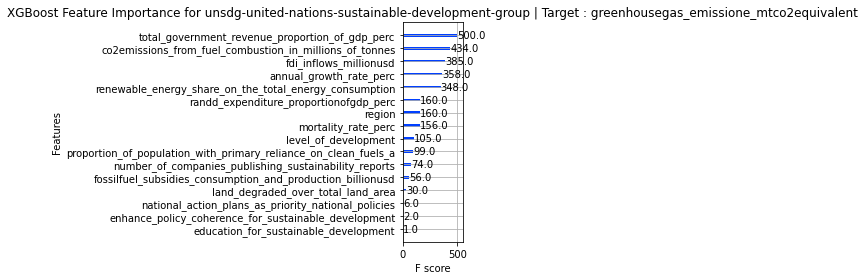

Target Variable: level_of_development
CATS=====================
['region', 'national_action_plans_as_priority_national_policies', 'number_of_companies_publishing_sustainability_reports', 'education_for_sustainable_development', 'enhance_policy_coherence_for_sustainable_development', 'land_degraded_over_total_land_area', 'country_processed']
CONTS=====================
['country', 'greenhousegas_emissione_mtco2equivalent', 'total_government_revenue_proportion_of_gdp_perc', 'fdi_inflows_millionusd', 'annual_growth_rate_perc', 'proportion_of_population_with_primary_reliance_on_clean_fuels_a', 'mortality_rate_perc', 'renewable_energy_share_on_the_total_energy_consumption', 'co2emissions_from_fuel_combustion_in_millions_of_tonnes', 'fossilfuel_subsidies_consumption_and_production_billionusd', 'randd_expenditure_proportionofgdp_perc']
18
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['country', 'greenhousegas_emissione_mtco2equivalent', 'tota

  0%|          | 0/42 [00:00<?, ?it/s]

AdaBoostRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
BaggingRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
BayesianRidge model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
DecisionTreeRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
DummyRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
ElasticNet model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
ElasticNetCV model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
ExtraTreeRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
ExtraTreesRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype

 64%|██████▍   | 27/42 [00:00<00:00, 131.67it/s]

HistGradientBoostingRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
HuberRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
KNeighborsRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
KernelRidge model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
Lars model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
LarsCV model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
Lasso model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
LassoCV model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
LassoLars model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
LassoLarsCV model faile

100%|██████████| 42/42 [00:00<00:00, 126.24it/s]

TweedieRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
XGBRegressor model failed to execute
[01:44:09] ../src/data/data.cc:458: Check failed: valid: Label contains NaN, infinity or a value too large.
Stack trace:
  [bt] (0) /opt/conda/lib/python3.7/site-packages/xgboost/lib/libxgboost.so(+0x16b9c9) [0x7f4f4770a9c9]
  [bt] (1) /opt/conda/lib/python3.7/site-packages/xgboost/lib/libxgboost.so(+0x178eb6) [0x7f4f47717eb6]
  [bt] (2) /opt/conda/lib/python3.7/site-packages/xgboost/lib/libxgboost.so(+0x179d10) [0x7f4f47718d10]
  [bt] (3) /opt/conda/lib/python3.7/site-packages/xgboost/lib/libxgboost.so(XGDMatrixSetInfoFromInterface+0xa4) [0x7f4f4765b754]
  [bt] (4) /opt/conda/lib/python3.7/lib-dynload/../../libffi.so.8(+0x6a4a) [0x7f4fbe72da4a]
  [bt] (5) /opt/conda/lib/python3.7/lib-dynload/../../libffi.so.8(+0x5fea) [0x7f4fbe72cfea]
  [bt] (6) /opt/conda/lib/python3.7/lib-dynload/_ctypes.cpython-37m-x86_64-linux-gnu.so(_ctypes_callproc

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Could not fit model
XGBoost failed
Target Variable: region
CATS=====================
['country', 'region', 'level_of_development', 'national_action_plans_as_priority_national_policies', 'number_of_companies_publishing_sustainability_reports', 'education_for_sustainable_development', 'enhance_policy_coherence_for_sustainable_development', 'land_degraded_over_total_land_area', 'country_processed']
CONTS=====================
['greenhousegas_emissione_mtco2equivalent', 'total_government_revenue_proportion_of_gdp_perc', 'fdi_inflows_millionusd', 'annual_growth_rate_perc', 'proportion_of_population_with_primary_reliance_on_clean_fuels_a', 'mortality_rate_perc', 'renewable_energy_share_on_the_total_energy_consumption', 'co2emissions_from_fuel_combustion_in_millions_of_tonnes', 'fossilfuel_subsidies_consumption_and_production_billionusd', 'randd_expenditure_proportionofgdp_perc']
19


Traceback (most recent call last):
  File "/tmp/ipykernel_18/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['greenhousegas_emissione_mtco2equivalent', 'total_government_revenue_proportion_of_gdp_perc', 'fdi_inflows_millionusd', 'annual_growth_rate_perc', 'proportion_of_population_with_primary_reliance_on_clean_fuels_a', 'mortality_rate_perc', 'renewable_energy_share_on_the_total_energy_consumption', 'co2emissions_from_fuel_combustion_in_millions_of_tonnes', 'fossilfuel_subsidies_consumption_and_production_billionusd', 'randd_expenditure_proportionofgdp_perc']
Categorical variables that made the cut : ['country', 'region', 'level_of_development', 'national_action_plans_as_priority_national_policies', 'number_of_companies_publishing_sustainability_reports', 'education_for_sustainable_development', 'enhance_policy_coherence_for_sustainable_development', 'land_degraded_over_total_land_area', 'country_processed']
Tabular Object size: 1674


  0%|          | 0/42 [00:00<?, ?it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.01397562026977539}
{'Model': 'BaggingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.02820134162902832}
{'Model': 'BayesianRidge', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.019402027130126953}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.018045902252197266}
{'Model': 'DummyRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.01667928695678711}


 14%|█▍        | 6/42 [00:00<00:00, 44.78it/s]

{'Model': 'ElasticNet', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03688240051269531}
ElasticNetCV model failed to execute
Gram matrix passed in via 'precompute' parameter did not pass validation when a single element was checked - please check that it was computed properly. For element (9,10) we computed 247.2552032470703 but the user-supplied value was 247.25527954101562.
{'Model': 'ExtraTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.017566442489624023}
{'Model': 'ExtraTreesRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.14192605018615723}
{'Model': 'GammaRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.01603412628173828}


 26%|██▌       | 11/42 [00:00<00:01, 15.92it/s]

{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.05714285714285716, 'RMSE': 0.2137044287228897, 'Time taken': 0.2866551876068115}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.05190086364746094}
{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.10233688354492188}


 38%|███▊      | 16/42 [00:01<00:01, 14.03it/s]

{'Model': 'HuberRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.05714285714285716, 'RMSE': 4.4085991777185556e-09, 'Time taken': 0.1314988136291504}
{'Model': 'KNeighborsRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.031084537506103516}
{'Model': 'KernelRidge', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.05714285714285716, 'RMSE': 1.0000056, 'Time taken': 0.09503769874572754}
{'Model': 'Lars', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.018258333206176758}
LarsCV model failed to execute
x and y arrays must have at least 2 entries


 52%|█████▏    | 22/42 [00:01<00:01, 19.20it/s]

{'Model': 'Lasso', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.0544586181640625}
LassoCV model failed to execute
Gram matrix passed in via 'precompute' parameter did not pass validation when a single element was checked - please check that it was computed properly. For element (9,10) we computed 247.2552032470703 but the user-supplied value was 247.25527954101562.
{'Model': 'LassoLars', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.0305788516998291}
LassoLarsCV model failed to execute
x and y arrays must have at least 2 entries
{'Model': 'LassoLarsIC', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03591728210449219}
{'Model': 'LinearRegression', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.04089999198913574}


 60%|█████▉    | 25/42 [00:01<00:00, 21.20it/s]

{'Model': 'LinearSVR', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.05714285714285716, 'RMSE': 2.229811178742842e-09, 'Time taken': 0.027544498443603516}


 67%|██████▋   | 28/42 [00:01<00:01, 10.96it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.05714285714285716, 'RMSE': 0.07822299, 'Time taken': 0.4821746349334717}
{'Model': 'NuSVR', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.05714285714285716, 'RMSE': 1.7763568394002505e-15, 'Time taken': 0.06226849555969238}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.018230676651000977}
OrthogonalMatchingPursuitCV model failed to execute
attempt to get argmin of an empty sequence
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.05714285714285716, 'RMSE': 0.03133757308832767, 'Time taken': 0.01931142807006836}
{'Model': 'PoissonRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.018110036849975586}


 76%|███████▌  | 32/42 [00:19<00:16,  1.65s/it]

{'Model': 'QuantileRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.05714285714285716, 'RMSE': 7.815970093361102e-14, 'Time taken': 17.09335422515869}
{'Model': 'RANSACRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.024591922760009766}


 88%|████████▊ | 37/42 [00:19<00:04,  1.08it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.1830894947052002}
{'Model': 'Ridge', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.01678323745727539}
{'Model': 'RidgeCV', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.04274415969848633}
{'Model': 'SGDRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.05714285714285716, 'RMSE': 0.0001119572561424781, 'Time taken': 0.04155874252319336}
{'Model': 'SVR', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.04054903984069824}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.025442123413085938}
{'Model': 'TweedieRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.018666505813598633}


100%|██████████| 42/42 [00:20<00:00,  2.09it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.05714285714285716, 'RMSE': 5.9604645e-08, 'Time taken': 0.5256364345550537}
{'Model': 'LGBMRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03055286407470703}
Project: unsdg-united-nations-sustainable-development-group
unsdg-united-nations-sustainable-development-group
Target: region
region
Target Standard Deviation: 0.0
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
AdaBoostRegressor                            1.00       1.00  0.00        0.01
Lars                                         1.00       1.00  0.00        0.02
TweedieRegressor                             1.00       1.00  0.00        0.02
TransformedTargetRegressor                   1.00       1.00  0.00        0.03
SVR                                          1.00       1.00  0.00        0.04
RidgeCV           

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,6.167408,0.307424,0.554458,00:00
1,4.588692,0.273922,0.523376,00:01
2,3.187127,0.127102,0.356514,00:01
3,2.010615,0.047011,0.216821,00:00
4,1.299869,0.070991,0.266442,00:00


Better model found at epoch 0 with _rmse value: 0.5544583201408386.
Better model found at epoch 1 with _rmse value: 0.5233755707740784.
Better model found at epoch 2 with _rmse value: 0.356513649225235.
Better model found at epoch 3 with _rmse value: 0.21682123839855194.
No improvement since epoch 3: early stopping


Could not show results
XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.00
1       1       1.00
2       1       1.00
3       1       1.00
4       1       1.00
XGBoost RMSE:  5.9604645e-08
XGBoost failed


Traceback (most recent call last):
  File "/tmp/ipykernel_18/2755408106.py", line 310, in <module>
    plot_importance(xgb)
  File "/opt/conda/lib/python3.7/site-packages/xgboost/plotting.py", line 75, in plot_importance
    'Booster.get_score() results in empty.  ' +
ValueError: Booster.get_score() results in empty.  This maybe caused by having all trees as decision dumps.


<Figure size 432x288 with 0 Axes>

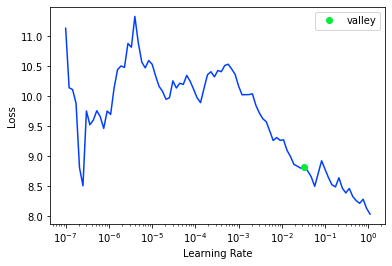

<Figure size 720x720 with 0 Axes>

In [22]:
target = ''
target_str = ''
#The column closest to the end isPARAM_DIR the target variable that can be represented as a float is the target variable
targets = []
#Loop through every possible target column (Continuous)
for i in range(len(df.columns)-1, 0, -1):
    try:
        df[df.columns[i]] = df[df.columns[i]].apply(pd.to_numeric, errors='coerce').dropna()
        target = df.columns[i]
        target_str = target.replace('/', '-')
    except:
        continue
    print(f'Target Variable: {target}')
    #Will be determined by the file name


    #===================================================================================================

    #Create project config files if they don't exist.
    if not os.path.exists(param_dir):
        #create param_dir
        os.makedirs(PARAM_DIR)
    if not os.path.exists(f'{PARAM_DIR}/cats.txt'):
        #create param_dir
        with open(f'{PARAM_DIR}/cats.txt', 'w') as f:
            f.write('')
    if not os.path.exists(f'{PARAM_DIR}/conts.txt'):
        #create param_dir
        with open(f'{PARAM_DIR}/conts.txt', 'w') as f:
            f.write('')
    if not os.path.exists(f'{PARAM_DIR}/cols_to_delete.txt'):
        with open(f'{PARAM_DIR}/cols_to_delete.txt', 'w') as f:
            f.write('')

    df = df.drop_duplicates()
    if SHUFFLE_DATA:
        df = df.sample(frac=1).reset_index(drop=True)

    # workaround for fastai/pytorch bug where bool is treated as object and thus erroring out.
    for n in df:
        if pd.api.types.is_bool_dtype(df[n]):
            df[n] = df[n].astype('uint8')

    with open(f'{PARAM_DIR}/cols_to_delete.txt', 'r') as f:
        cols_to_delete = f.read().splitlines()
    for col in cols_to_delete:
        try:
            del(df[col])
        except:
            pass
    #try to fill in missing values now, otherwise FastAI will do it for us later
    try:
        df = df.fillna(0)
    except:
        pass
    #print missing values
    #print(df.isna().sum().sort_values(ascending=False))
    #shrink df as much as possible
    df = df_shrink(df)


    #print types inside of df
    #print(df.dtypes)


    #Auto detect categorical and continuous variables
    #==============================================================================
    likely_cat = {}
    for var in df.columns:
        likely_cat[var] = 1.*df[var].nunique()/df[var].count() < 0.05 #or some other threshold

    cats = [var for var in df.columns if likely_cat[var]]
    conts = [var for var in df.columns if not likely_cat[var]]

    #remove target from lists
    try:
        conts.remove(target)
        cats.remove(target)
    except:
        pass
    #Convert target to float
    df[target] = df[target].apply(pd.to_numeric, errors='coerce').dropna()

    print('CATS=====================')
    print(cats)
    print('CONTS=====================')
    print(conts)

    #Populate categorical and continuous lists
    #==============================================================================

    if VARIABLE_FILES == True:
        with open(f'{PARAM_DIR}/cats.txt', 'r') as f:
            cats = f.read().splitlines()

        with open(f'{PARAM_DIR}/conts.txt', 'r') as f:
            conts = f.read().splitlines()

    #==============================================================================

    #==============================================================================
    procs = [Categorify, FillMissing, Normalize]
    #print(df.describe().T)
    df = df[0:SAMPLE_COUNT]
    splits = RandomSplitter()(range_of(df))

    print((len(cats)) + len(conts))
    #conts = []

    #Convert cont variables to floats
    #==============================================================================

    #Convert cont variables to floats
    #==============================================================================

    for var in conts:
        try:
            df[var] = df[var].apply(pd.to_numeric, errors='coerce').dropna()
        except:
            print(f'Could not convert {var} to float.')
            pass

    #==============================================================================

    #Experimental logic to add columns one-by-one to find a breakpoint
    #==============================================================================
    if ENABLE_BREAKPOINT == True:
        temp_procs = [Categorify, FillMissing]
        print('Looping through continuous variables to find breakpoint')
        cont_list = []
        for cont in conts:
            focus_cont = cont
            cont_list.append(cont)
            #print(focus_cont)
            try:
                to = TabularPandas(df, procs=procs, cat_names=cats, cont_names=cont_list, y_names=target, y_block=RegressionBlock(), splits=splits)
                del(to)
            except:
                print('Error with ', focus_cont)
                #remove focus_cont from list
                cont_list.remove(focus_cont)
                #traceback.print_exc()
                continue
        #convert all continuous variables to floats
        for var in cont_list:
            try:
                df[var] = df[var].apply(pd.to_numeric, errors='coerce').dropna()
            except:
                print(f'Could not convert {var} to float.')
                cont_list.remove(var)
                if CONVERT_TO_CAT == True:
                    cats.append(var)
                pass
        print(f'Continuous variables that made the cut : {cont_list}')
        print(f'Categorical variables that made the cut : {cats}')
        #shrink df as much as possible
        df = df_shrink(df)
        #print(df.dtypes)

    #==============================================================================

    #Creating tabular object + quick preprocessing
    #==============================================================================
    to = None
    if REGRESSOR == True:
        try:
            to = TabularPandas(df, procs, cats, conts, target, y_block=RegressionBlock(), splits=splits)
        except:
            conts = []
            to = TabularPandas(df, procs, cats, conts, target, y_block=RegressionBlock(), splits=splits)
    else:
        try:
            to = TabularPandas(df, procs, cats, conts, target, splits=splits)
        except:
            conts = []
            to = TabularPandas(df, procs, cats, conts, target, splits=splits)

    #print(dir(to))
    #print(to.xs)
    dls = to.dataloaders()
    print(f'Tabular Object size: {len(to)}')
    try:
        dls.one_batch()
    except:
        print(f'problem with getting one batch of {PROJECT_NAME}')
    #==============================================================================

    #Extracting train and test sets from tabular object
    #==============================================================================

    X_train, y_train = to.train.xs, to.train.ys.values.ravel()
    X_test, y_test = to.valid.xs, to.valid.ys.values.ravel()

    #Make sure target isn't in independent columns
    if target in X_train and target in X_test:
        del(X_train[target])
        del(X_test[target])
    #create dataframe from X_train and y_train
    #export tabular object to csv
    pd.DataFrame(X_train).to_csv(f'{PARAM_DIR}/X_train_{target_str}.csv', index=False)
    pd.DataFrame(X_test).to_csv(f'{PARAM_DIR}/X_test_{target_str}.csv', index=False)
    pd.DataFrame(y_train).to_csv(f'{PARAM_DIR}/y_train_{target_str}.csv', index=False)
    pd.DataFrame(y_test).to_csv(f'{PARAM_DIR}/y_test_{target_str}.csv', index=False)

    #==============================================================================

    #==============================================================================

    #Ready for model selection!

    if REGRESSOR == True:
        try:
            reg = LazyRegressor(verbose=2, ignore_warnings=False, custom_metric=None)
            models, predictions = reg.fit(X_train, X_test, y_train, y_test)
            print(f'Project: {PROJECT_NAME}')
            print(PROJECT_NAME)
            print(f'Target: {target}')
            print(target)
            target_std = y_train.std()
            print(f'Target Standard Deviation: {target_std}')
            print(models)
            models['project'] = PROJECT_NAME
            models['target'] = target
            models['target_std'] = target_std
            #rename index of 
            models.to_csv(f'{PARAM_DIR}/regression_results_{target_str}.csv', mode='a', header=True, index=True)
        except:
            print('Issue during lazypredict analysis')
    else:
        #TODO: remove this
        try:
            clf = LazyClassifier(verbose=2, ignore_warnings=False, custom_metric=None)
            models, predictions = clf.fit(X_train, X_test, y_train, y_test)
            print(f'Project: {PROJECT_NAME}')
            print(PROJECT_NAME)
            print(f'Target: {target}')
            print(target)
            print(f'Target Standard Deviation: {y_train.std()}')
            print(models)
            models.to_csv(f'{PARAM_DIR}/classification_results.csv', mode='a', header=False)
        except:
            print('Issue during lazypredict analysis')

    model_name = 'tabnet'

    # FastAI + pre-trained TabNet
    #==============================================================================
    learn = None
    i = 0
    while True:
        try:
            del learn
        except:
            pass
        try:
            learn = 0
            model = TabNetModel(get_emb_sz(to), len(to.cont_names), dls.c, n_d=64, n_a=64, n_steps=5, virtual_batch_size=256)
            # save the best model so far, determined by early stopping
            cbs = [SaveModelCallback(monitor='_rmse', comp=np.less, fname=f'{model_name}_{PROJECT_NAME}_{target_str}_best'), EarlyStoppingCallback()]
            learn = Learner(dls, model, loss_func=MSELossFlat(), metrics=rmse, cbs=cbs)
            #learn = get_learner(to)
            if(learn != 0):
                break
            if i > 50:
                break
        except:
            i += 1
            print('Error in FastAI TabNet')
            traceback.print_exc()
            continue
    try:
        #display learning rate finder results
        x = learn.lr_find()
    except:
        pass
    if AUTO_ADJUST_LEARNING_RATE == True:
        FASTAI_LEARNING_RATE = x.valley
    print(f'LEARNING RATE: {FASTAI_LEARNING_RATE}')
    try:
        if i < 50:
            learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
            plt.figure(figsize=(10, 10))
            try:
                ax = learn.show_results()
                plt.show(block=True)
            except:
                print('Could not show results')
                pass
    except:
        print('Could not fit model')
        traceback.print_exc()
        pass

    #==============================================================================

    #fit an xgboost model
    #==============================================================================
    if REGRESSOR == True:
        xgb = XGBRegressor()
    else:
        xgb = XGBClassifier()
    try:
        xgb = XGBRegressor()
        xgb.fit(X_train, y_train)
        y_pred = xgb.predict(X_test)
        print('XGBoost Predictions vs Actual==========')
        print(pd.DataFrame({'actual': y_test, 'predicted': y_pred}).head())
        print('XGBoost RMSE: ', np.sqrt(mean_squared_error(y_test, y_pred)))
        #save feature importance plot to file
        plot_importance(xgb)
        plt.title(f'XGBoost Feature Importance for {PROJECT_NAME} | Target : {target}', wrap=True)
        plt.tight_layout()
        plt.show()
        plt.savefig(f'{PARAM_DIR}/xgb_feature_importance_{target_str}.png')
        fi_df = pd.DataFrame([xgb.get_booster().get_score()]).T
        fi_df.columns = ['importance']
        #create a column based off the index called feature
        fi_df['feature'] = fi_df.index
        #create a dataframe of feature importance
        fi_df = fi_df[['feature', 'importance']]
        fi_df.to_csv(f'{PARAM_DIR}/xgb_feature_importance_{target_str}.csv', index=False)
        #xgb_fi = pd.DataFrame(xgb.feature_importances_, index=X_train.columns, columns=['importance'])
        #xgb_fi.to_csv(f'{PARAM_DIR}/xgb_feature_importance_{target_str}.csv')
        #print('XGBoost AUC: ', roc_auc_score(y_test, y_pred))
    except:
        traceback.print_exc()
        print('XGBoost failed')

# <div style="text-align: center; background-color: blue; color: white; padding: 14px; line-height: 1;border-radius:20px">**Overall Feature Importance**</div>

                                                 feature  importance
0                                                 region      245.00
1                                   level_of_development       85.00
2    national_action_plans_as_priority_national_policies       15.00
3  number_of_companies_publishing_sustainability_reports      221.00
4                  education_for_sustainable_development       10.00


<AxesSubplot:title={'center':'XGBoost Overall Feature Importance'}, xlabel='feature'>

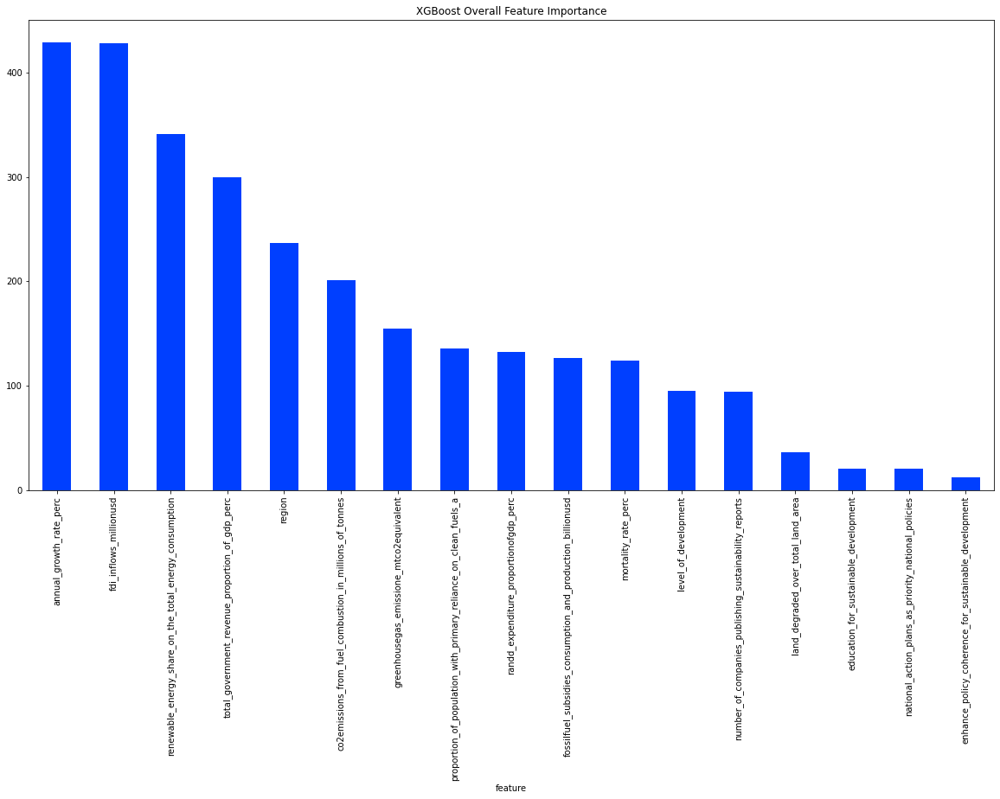

In [23]:
out_dir = f'./{PROJECT_NAME}'
xgb_feature_importance_csvs = []

for file in os.listdir(out_dir):
    if 'xgb_feature_importance' in file and '.csv' in file:
        xgb_feature_importance_csvs.append(pd.read_csv(os.path.join(out_dir, file)))

xgb_feature_importance = pd.concat(xgb_feature_importance_csvs,axis=0)
xgb_feature_importance.rename(columns={'Unnamed: 0': 'feature'}, inplace=True)
print(xgb_feature_importance.head())
xgb_feature_importance.groupby('feature')['importance'].mean().sort_values(ascending=False).plot(kind='bar', title='XGBoost Overall Feature Importance', figsize=(20, 10))

In [24]:
df.isna().sum()

country                                                            0
region                                                             0
level_of_development                                               0
greenhousegas_emissione_mtco2equivalent                            0
total_government_revenue_proportion_of_gdp_perc                    0
fdi_inflows_millionusd                                             0
annual_growth_rate_perc                                            0
proportion_of_population_with_primary_reliance_on_clean_fuels_a    0
mortality_rate_perc                                                0
renewable_energy_share_on_the_total_energy_consumption             0
co2emissions_from_fuel_combustion_in_millions_of_tonnes            0
fossilfuel_subsidies_consumption_and_production_billionusd         0
randd_expenditure_proportionofgdp_perc                             0
national_action_plans_as_priority_national_policies                0
number_of_companies_publishing_sus

# **To Be Continued...**